# **Librerías Generales**

In [ ]:
!pip install catboost

In [ ]:
import sys

# Importación, visualización, manipulación de datos
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from ipywidgets import interact_manual, widgets
from IPython.display import display, HTML, clear_output

#Algoritmos
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor, Pool
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor

# Transformación de datos
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import KFold, RandomizedSearchCV
from sklearn.inspection import permutation_importance
from sklearn.pipeline import Pipeline

# Métricas y desempeño
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import skew

In [ ]:
# Version de las librerias usadas
import sys, sklearn, xgboost, lightgbm, catboost, pandas, numpy, matplotlib, seaborn, scipy

print("Python version:", sys.version)
print("pandas:", pandas.__version__)
print("numpy:", numpy.__version__)
print("matplotlib:", matplotlib.__version__)
print("seaborn:", seaborn.__version__)
print("scikit-learn:", sklearn.__version__)
print("xgboost:", xgboost.__version__)
print("lightgbm:", lightgbm.__version__)
print("catboost:", catboost.__version__)
print("scipy:", scipy.__version__)


Python version: 3.12.12 (main, Oct 10 2025, 08:52:57) [GCC 11.4.0]
pandas: 2.2.2
numpy: 2.0.2
matplotlib: 3.10.0
seaborn: 0.13.2
scikit-learn: 1.6.1
xgboost: 3.1.1
lightgbm: 4.6.0
catboost: 1.2.8
scipy: 1.16.3


# **Datasets**


## Dataset 1

### **Información del dataset**

**Concrete Compressive Strength**

```
I-Cheng Yeh (1998), “Modeling of strength of high performance concrete using artificial neural networks,” *Cement and Concrete Research*, Vol. 28, No. 12, pp. 1797–1808.  
https://archive.ics.uci.edu/ml/datasets/Concrete+Compressive+Strength
```
**Descripción general:**

Base experimental de concretos de alto desempeño que recopila la resistencia a compresión en función de la composición de la mezcla. Incluye materiales cementantes (cemento, escoria de alto horno, ceniza volante), agua, aditivos químicos (superplastificante), y agregados (grueso y fino). La resistencia se mide en diferentes edades de curado. Este dataset es ampliamente usado como benchmark para problemas de regresión en ingeniería civil y aprendizaje automático.

---

#### Variables del dataset

| Nombre de columna             | Tipo de dato | Unidad de medida | Descripción                                               |
|-------------------------------|--------------|------------------|-----------------------------------------------------------|
| **Cement**                    | Cuantitativa | kg/m³            | Cantidad de cemento Portland en la mezcla.                |
| **Blast Furnace Slag**        | Cuantitativa | kg/m³            | Cantidad de escoria granulada de alto horno.              |
| **Fly Ash**                   | Cuantitativa | kg/m³            | Cantidad de ceniza volante utilizada como adición.         |
| **Water**                     | Cuantitativa | kg/m³            | Cantidad de agua en la mezcla.                            |
| **Superplasticizer**          | Cuantitativa | kg/m³            | Cantidad de superplastificante utilizado.                 |
| **Coarse Aggregate**          | Cuantitativa | kg/m³            | Cantidad de agregado grueso en la mezcla.                 |
| **Fine Aggregate**            | Cuantitativa | kg/m³            | Cantidad de agregado fino (arena natural) en la mezcla.   |
| **Age**                       | Cuantitativa | días (1–365)     | Tiempo de curado antes de la prueba de resistencia.        |
| **Concrete Compressive Strength (CCS)** | Cuantitativa | MPa              | **Variable objetivo**: resistencia a compresión del concreto. |


### **Importación del dataset**


In [ ]:
dataset1 = pd.read_excel('Concrete_Data.xls')


## Dataset 2

### **Información del dataset**

**Dataset of compressive strength and slump of normal concrete**

```
Ke, Lu; Ming, Qiu (2024), “Dataset of compressive strength and slump of normal concrete”, Mendeley Data, V1, doi: [10.17632/zrsbhndz9f.1](https://doi.org/10.17632/zrsbhndz9f.1)  
https://data.mendeley.com/datasets/zrsbhndz9f/1
```

**Descripción general:**

Conjunto experimental de concretos convencionales en el que se registran las propiedades mecánicas (resistencia a compresión) en función de las proporciones de los materiales constituyentes. El dataset considera cemento, agua, agregados finos y gruesos, adiciones minerales (fly ash, silica fume) y aditivos químicos (admixtures, agentes acelerantes), medidos a distintas edades de curado.

---

#### Variables del dataset

| Nombre de columna            | Tipo de dato | Unidad de medida | Descripción                                                                 |
|------------------------------|--------------|------------------|-----------------------------------------------------------------------------|
| **Cement**                   | Cuantitativa | kg/m³            | Cantidad de cemento Portland utilizado en la mezcla.                        |
| **Fine_Aggregates**          | Cuantitativa | kg/m³            | Cantidad de agregado fino (arena natural) en la mezcla.                     |
| **Coarse_Aggregates**        | Cuantitativa | kg/m³            | Cantidad de agregado grueso natural en la mezcla.                           |
| **Water**                    | Cuantitativa | kg/m³            | Cantidad de agua empleada en la mezcla.                                     |
| **Water_reducing_Admixture** | Cuantitativa | kg/m³            | Cantidad de aditivo reductor de agua o superplastificante.                  |
| **Fly_Ash**                  | Cuantitativa | kg/m³            | Cantidad de ceniza volante utilizada como adición mineral puzolánica.       |
| **Accelerating_Agent**       | Cuantitativa | kg/m³            | Cantidad de aditivo acelerante de fraguado empleado en la mezcla.           |
| **Silica_Fume**              | Cuantitativa | kg/m³            | Cantidad de humo de sílice añadido como material cementante suplementario.  |
| **Time**                     | Cuantitativa | días             | Tiempo de curado (edad del concreto) al momento de la prueba de compresión. |
| **Strength**                 | Cuantitativa | MPa              | **Variable objetivo**: resistencia a compresión del concreto.               |


### **Importación del dataset**


In [ ]:
dataset2 = pd.read_excel('CSSNC.xlsx')


## Dataset  3


### **Información del dataset**

**Experimental Data set for concrete compressive strength prediction from IIT Bhubaneswar concrete laboratory**

```
Biswal, Uma Shankar; Pasla, Dinakar ; Mishra, Mayank (2022), “Experimental Data set for concrete compressive strength prediction from IIT Bhubaneswar concrete laboratory”, Mendeley Data, V2, doi: [10.17632/5wkxzmzwnz.2](https://doi.org/10.17632/5wkxzmzwnz.2)  
https://data.mendeley.com/datasets/5wkxzmzwnz/2
```
**Descripción general:**

Base experimental con 188 mezclas de concreto fabricadas con agregados reciclados como sustituto parcial o total de agregados naturales. Se incluyen cementantes suplementarios (fly ash, GGBS, metakaolín), relaciones agua/aglutinante y aditivos químicos. Se mide la resistencia a compresión en distintas edades de curado para evaluar el desempeño mecánico y la sostenibilidad de las mezclas.

---

#### Variables del dataset

| Nombre de columna   | Tipo de dato  | Unidad de medida | Descripción                                                                 |
|---------------------|---------------|------------------|-----------------------------------------------------------------------------|
| **cement**          | Cuantitativa  | kg/m³            | Cantidad de cemento Portland en la mezcla.                                  |
| **flyash**          | Cuantitativa  | kg/m³            | Cantidad de ceniza volante usada como adición mineral.                      |
| **GGBS**            | Cuantitativa  | kg/m³            | Cantidad de escoria granulada de alto horno molida.                         |
| **MK**              | Cuantitativa  | kg/m³            | Cantidad de metacaolín utilizado como adición.                              |
| **TCM**             | Cuantitativa  | kg/m³            | Contenido total de materiales cementantes (cemento + SCMs).                 |
| **water**           | Cuantitativa  | kg/m³            | Cantidad de agua usada en la mezcla.                                        |
| **water_TCM**       | Cuantitativa  | – (razón)        | Relación agua / materiales cementantes totales.                             |
| **SP**              | Cuantitativa  | kg/m³            | Cantidad de superplastificante utilizado como aditivo químico.              |
| **VMA**             | Cuantitativa  | kg/m³            | Cantidad de aditivo modificador de viscosidad.                              |
| **NCA_20_DOWN**     | Cuantitativa  | kg/m³            | Agregado grueso natural de tamaño <20 mm.                                   |
| **NCA_10_DOWN**     | Cuantitativa  | kg/m³            | Agregado grueso natural de tamaño <10 mm.                                   |
| **RCA_20_DOWN**     | Cuantitativa  | kg/m³            | Agregado grueso reciclado de tamaño <20 mm usado en la mezcla.              |
| **RCA_10_DOWN**     | Cuantitativa  | kg/m³            | Agregado grueso reciclado de tamaño <10 mm usado en la mezcla.              |
| **SAND**            | Cuantitativa  | kg/m³            | Cantidad de arena (agregado fino) en la mezcla.                             |
| **AGE**             | Cuantitativa  | días             | Tiempo de curado del concreto al momento de la prueba de compresión.        |
| **CS**              | Cuantitativa  | MPa              | **Variable objetivo**: resistencia a compresión del concreto reciclado.     |


### **Importación del dataset**


In [ ]:
dataset3 = pd.read_excel('CCSPIIT.xlsx')



# ***Análisis Exploratorio de Datos***

## Dataset 1

In [ ]:
dataset1

,Cement (component 1)(kg in a m^3 mixture),Blast Furnace Slag (component 2)(kg in a m^3 mixture),Fly Ash (component 3)(kg in a m^3 mixture),Water (component 4)(kg in a m^3 mixture),Superplasticizer (component 5)(kg in a m^3 mixture),Coarse Aggregate (component 6)(kg in a m^3 mixture),Fine Aggregate (component 7)(kg in a m^3 mixture),Age (day),"Concrete compressive strength(MPa, megapascals)"
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.986111
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.887366
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.269535
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.052780
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.296075
...,...,...,...,...,...,...,...,...,...
1025,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.284354
1026,322.2,0.0,115.6,196.0,10.4,817.9,813.4,28,31.178794
1027,148.5,139.4,108.6,192.7,6.1,892.4,780.0,28,23.696601
1028,159.1,186.7,0.0,175.6,11.3,989.6,788.9,28,32.768036


In [ ]:
dataset1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   Cement (component 1)(kg in a m^3 mixture)              1030 non-null   float64
 1   Blast Furnace Slag (component 2)(kg in a m^3 mixture)  1030 non-null   float64
 2   Fly Ash (component 3)(kg in a m^3 mixture)             1030 non-null   float64
 3   Water  (component 4)(kg in a m^3 mixture)              1030 non-null   float64
 4   Superplasticizer (component 5)(kg in a m^3 mixture)    1030 non-null   float64
 5   Coarse Aggregate  (component 6)(kg in a m^3 mixture)   1030 non-null   float64
 6   Fine Aggregate (component 7)(kg in a m^3 mixture)      1030 non-null   float64
 7   Age (day)                                              1030 non-null   int64  
 8   Concrete compressive strength(MPa, megapascals)  

In [ ]:
#Renombrar las columnas a un nombre mas sencillo
dataset1.columns = [
    'cement',
    'slag',
    'flyash',
    'water',
    'superplasticizer',
    'coarseaggregate',
    'fineaggregate',
    'age',
    'csMPa'
]

In [ ]:
#Comprobar la actualización
dataset1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cement            1030 non-null   float64
 1   slag              1030 non-null   float64
 2   flyash            1030 non-null   float64
 3   water             1030 non-null   float64
 4   superplasticizer  1030 non-null   float64
 5   coarseaggregate   1030 non-null   float64
 6   fineaggregate     1030 non-null   float64
 7   age               1030 non-null   int64  
 8   csMPa             1030 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 72.6 KB


In [ ]:
dataset1['csMPa'].agg(['min', 'max'])

,csMPa
min,2.331808
max,82.599225


In [ ]:
dataset1.describe()

,cement,slag,flyash,water,superplasticizer,coarseaggregate,fineaggregate,age,csMPa
count,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000
mean,281.165631,73.895485,54.187136,181.566359,6.203112,972.918592,773.578883,45.662136,35.817836
std,104.507142,86.279104,63.996469,21.355567,5.973492,77.753818,80.175427,63.169912,16.705679
min,102.000000,0.000000,0.000000,121.750000,0.000000,801.000000,594.000000,1.000000,2.331808
25%,192.375000,0.000000,0.000000,164.900000,0.000000,932.000000,730.950000,7.000000,23.707115
50%,272.900000,22.000000,0.000000,185.000000,6.350000,968.000000,779.510000,28.000000,34.442774
75%,350.000000,142.950000,118.270000,192.000000,10.160000,1029.400000,824.000000,56.000000,46.136287
max,540.000000,359.400000,200.100000,247.000000,32.200000,1145.000000,992.600000,365.000000,82.599225


In [ ]:
# Para ver si existen filas con la misma información
dataset1.duplicated().sum()

np.int64(25)

In [ ]:
# Quitamos las repetidas
dataset1.drop_duplicates(inplace=True)

In [ ]:
# Confirmamos la actualización
dataset1.duplicated().sum()

np.int64(0)

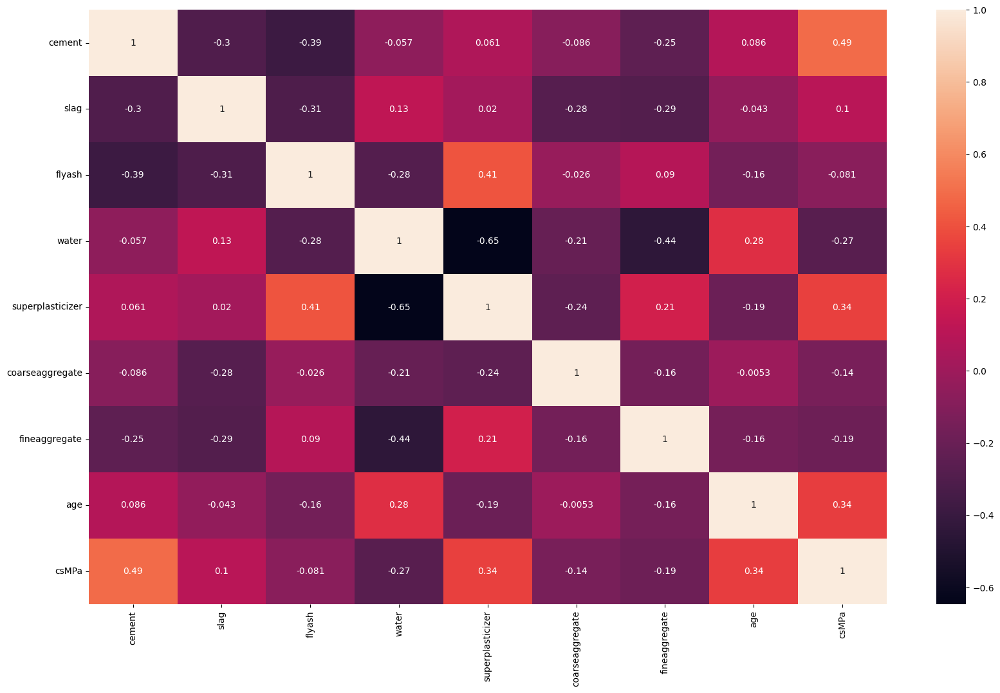

In [ ]:
sns.heatmap(data=dataset1.corr(), annot=True)

fig=plt.gcf()
fig.set_size_inches(20,12)
plt.show()

In [ ]:
# Calcula la matriz de correlación y guárdala en una variable
corr_matrix = dataset1.corr()

# Imprime (o muestra) la tabla de datos
print("Matriz de correlación:")
print(corr_matrix)

Matriz de correlación:
                    cement      slag    flyash     water  superplasticizer  \
cement            1.000000 -0.303301 -0.385618 -0.056583          0.061296   
slag             -0.303301  1.000000 -0.312342  0.130295          0.019902   
flyash           -0.385618 -0.312342  1.000000 -0.283372          0.414055   
water            -0.056583  0.130295 -0.283372  1.000000         -0.646875   
superplasticizer  0.061296  0.019902  0.414055 -0.646875          1.000000   
coarseaggregate  -0.086212 -0.277558 -0.026485 -0.212495         -0.242031   
fineaggregate    -0.245379 -0.289676  0.090229 -0.444888          0.207794   
age               0.086349 -0.042759 -0.158940  0.279269         -0.194094   
csMPa             0.488283  0.103370 -0.080648 -0.269606          0.344225   

                  coarseaggregate  fineaggregate       age     csMPa  
cement                  -0.086212      -0.245379  0.086349  0.488283  
slag                    -0.277558      -0.289676 -0.04

In [ ]:
#g = sns.PairGrid(dataset, hue="csMPa", palette='viridis')
#g.map_diag(sns.histplot)
#g.map_offdiag(sns.scatterplot)
#g.add_legend() #Tarda como 7 minutos

## Dataset 2

In [ ]:
dataset2

,Cement,Fine_Aggregates,Coarse_Aggregates,Water,Water_reducing_Admixture,Fly_Ash,Accelerating_Agent,Silica_Fume,Time,Strength
0,380.0,832,1017.0,171,6.84,0.0,0.0,0,7,36.2
1,338.0,824,1007.0,171,7.16,60.0,0.0,0,7,36.4
2,241.0,896,1051.0,170,4.24,42.0,0.0,0,7,18.9
3,358.0,823,1047.0,172,5.37,0.0,0.0,0,7,36.8
4,304.0,823,1047.0,172,5.37,54.0,0.0,0,7,35.6
...,...,...,...,...,...,...,...,...,...,...
1665,230.0,1600,0.0,190,0.00,0.0,0.0,0,28,11.2
1666,724.0,1179,0.0,297,0.00,0.0,0.0,0,28,41.1
1667,700.0,1180,0.0,320,0.00,0.0,0.0,0,28,41.8
1668,300.0,1542,0.0,250,0.00,0.0,0.0,0,28,14.6


In [ ]:
dataset2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670 entries, 0 to 1669
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Cement                    1670 non-null   float64
 1   Fine_Aggregates           1670 non-null   int64  
 2   Coarse_Aggregates         1670 non-null   float64
 3   Water                     1670 non-null   int64  
 4   Water_reducing_Admixture  1670 non-null   float64
 5   Fly_Ash                   1670 non-null   float64
 6   Accelerating_Agent        1670 non-null   float64
 7   Silica_Fume               1670 non-null   int64  
 8   Time                      1670 non-null   int64  
 9   Strength                  1670 non-null   float64
dtypes: float64(6), int64(4)
memory usage: 130.6 KB


In [ ]:
dataset2['Strength'].agg(['min', 'max'])

,Strength
min,4.3
max,76.3


In [ ]:
dataset2.describe()

,Cement,Fine_Aggregates,Coarse_Aggregates,Water,Water_reducing_Admixture,Fly_Ash,Accelerating_Agent,Silica_Fume,Time,Strength
count,1670.000000,1670.000000,1670.000000,1670.000000,1670.000000,1670.000000,1670.000000,1670.000000,1670.000000,1670.000000
mean,363.054872,865.885030,947.064870,178.517365,5.407483,23.133126,0.718713,0.225150,17.638323,37.617393
std,100.450670,211.460198,310.235601,39.059379,4.633672,34.977785,4.829271,2.194735,10.502234,12.979861
min,194.000000,631.000000,0.000000,110.000000,0.000000,0.000000,0.000000,0.000000,7.000000,4.300000
25%,300.000000,772.000000,999.000000,162.000000,3.800000,0.000000,0.000000,0.000000,7.000000,28.700000
50%,355.500000,817.500000,1047.000000,168.000000,5.170000,0.000000,0.000000,0.000000,28.000000,38.100000
75%,400.000000,860.750000,1087.000000,172.000000,6.190000,52.000000,0.000000,0.000000,28.000000,45.387500
max,958.000000,1712.000000,1398.000000,476.000000,39.200000,195.000000,50.000000,25.000000,28.000000,76.300000


In [ ]:
# Para ver si existen filas con la misma información
dataset2.duplicated().sum()

np.int64(52)

In [ ]:
# Quitamos las repetidas
dataset2.drop_duplicates(inplace=True)

In [ ]:
# Confirmamos la actualización
dataset2.duplicated().sum()

np.int64(0)

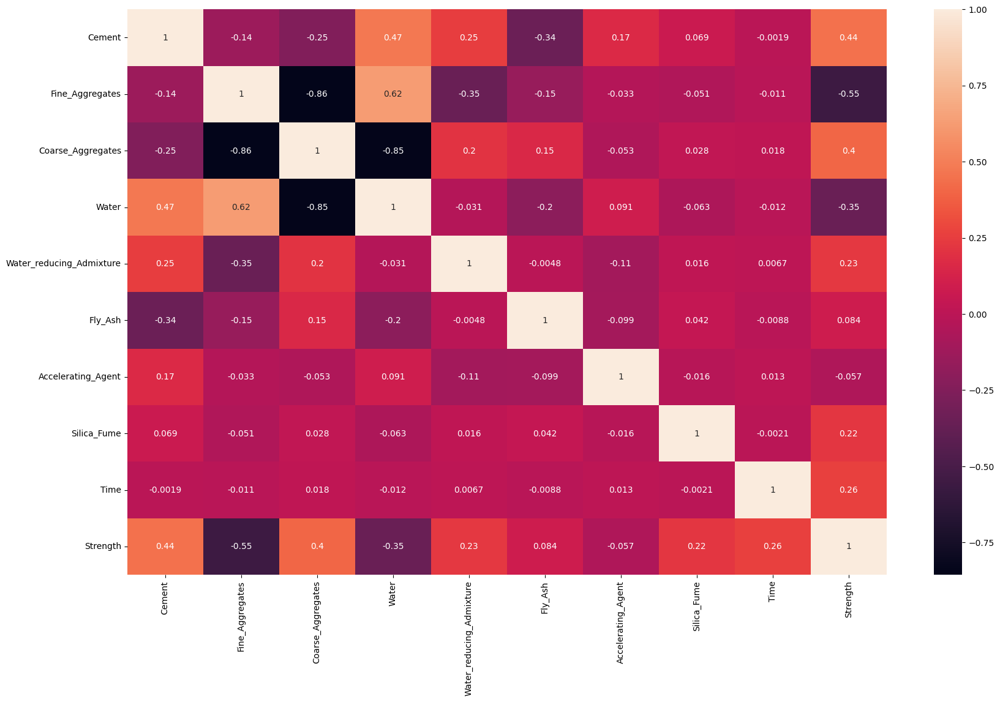

In [ ]:
sns.heatmap(data=dataset2.corr(), annot=True)

fig=plt.gcf()
fig.set_size_inches(20,12)
plt.show()

In [ ]:
# Calcula la matriz de correlación y guárdala en una variable
corr_matrix = dataset2.corr()

# Imprime (o muestra) la tabla de datos
print("Matriz de correlación:")
print(corr_matrix)

Matriz de correlación:
                            Cement  Fine_Aggregates  Coarse_Aggregates  \
Cement                    1.000000        -0.135995          -0.252044   
Fine_Aggregates          -0.135995         1.000000          -0.856365   
Coarse_Aggregates        -0.252044        -0.856365           1.000000   
Water                     0.474102         0.624942          -0.845146   
Water_reducing_Admixture  0.248403        -0.352893           0.203094   
Fly_Ash                  -0.344948        -0.153333           0.154946   
Accelerating_Agent        0.165535        -0.032940          -0.052655   
Silica_Fume               0.069446        -0.050720           0.028013   
Time                     -0.001853        -0.010635           0.018397   
Strength                  0.442337        -0.553684           0.401493   

                             Water  Water_reducing_Admixture   Fly_Ash  \
Cement                    0.474102                  0.248403 -0.344948   
Fine_Aggregate

In [ ]:
#g = sns.PairGrid(dataset, hue="csMPa", palette='viridis')
#g.map_diag(sns.histplot)
#g.map_offdiag(sns.scatterplot)
#g.add_legend() #Tarda como 7 minutos

## Dataset 3

In [ ]:
dataset3

,Serial_No,cement,flyash,GGBS,MK,TCM,water,water_TCM,SP,VMA,NCA_20_DOWN,NCA_10_DOWN,RCA_20_DOWN,RCA_10_DOWN,SAND,AGE,CS
0,1,550,0,0,0,550,165,0.30,3.30,0.28,0,0,247,337,607,7,49.71
1,2,385,165,0,0,550,148,0.26,6.05,1.10,0,0,270,432,729,7,18.53
2,3,275,275,0,0,550,146,0.26,5.50,1.10,0,0,276,441,745,7,15.09
3,4,165,385,0,0,550,172,0.30,4.40,1.10,0,0,280,448,757,7,6.34
4,5,385,0,165,0,550,155,0.28,6.60,1.38,0,0,361,417,815,7,42.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183,184,480,0,0,0,480,170,0.35,1.20,0.00,0,0,458,514,620,90,48.32
184,185,612,0,0,68,680,170,0.25,1.95,0.00,0,0,412,462,558,90,71.62
185,186,578,0,0,102,680,170,0.25,3.46,0.00,0,0,410,461,555,90,68.56
186,187,437,0,0,49,486,170,0.35,1.96,0.00,0,0,456,512,617,90,52.98


In [ ]:
# borrar la columna de Serial_No ya que es irrelevante para hacer una predicción
dataset3 = dataset3.drop(columns=["Serial_No"])

In [ ]:
dataset3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188 entries, 0 to 187
Data columns (total 16 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   cement       188 non-null    int64  
 1   flyash       188 non-null    int64  
 2   GGBS         188 non-null    int64  
 3   MK           188 non-null    int64  
 4   TCM          188 non-null    int64  
 5   water        188 non-null    int64  
 6   water_TCM    188 non-null    float64
 7   SP           188 non-null    float64
 8   VMA          188 non-null    float64
 9   NCA_20_DOWN  188 non-null    int64  
 10  NCA_10_DOWN  188 non-null    int64  
 11  RCA_20_DOWN  188 non-null    int64  
 12  RCA_10_DOWN  188 non-null    int64  
 13  SAND         188 non-null    int64  
 14  AGE          188 non-null    int64  
 15  CS           188 non-null    float64
dtypes: float64(4), int64(12)
memory usage: 23.6 KB


In [ ]:
dataset3['CS'].agg(['min', 'max'])

,CS
min,6.00
max,73.76


In [ ]:
dataset3.describe()

,cement,flyash,GGBS,MK,TCM,water,water_TCM,SP,VMA,NCA_20_DOWN,NCA_10_DOWN,RCA_20_DOWN,RCA_10_DOWN,SAND,AGE,CS
count,188.000000,188.00000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000
mean,338.574468,50.00000,60.021277,11.446809,460.042553,170.446809,0.417654,2.506218,0.334043,37.452128,37.053191,387.063830,484.457447,646.563830,27.452128,34.418404
std,146.911774,101.26473,113.019328,26.732830,145.279588,14.172065,0.163969,2.303849,0.496071,143.861278,142.330366,126.338338,147.473240,80.977657,28.366261,17.938460
min,113.000000,0.00000,0.000000,0.000000,226.000000,146.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,516.000000,3.000000,6.000000
25%,227.000000,0.00000,0.000000,0.000000,309.000000,170.000000,0.280000,0.463750,0.000000,0.000000,0.000000,340.000000,447.000000,558.000000,7.000000,18.000000
50%,309.000000,0.00000,0.000000,0.000000,486.000000,170.000000,0.350000,1.950000,0.000000,0.000000,0.000000,412.000000,514.000000,653.000000,14.000000,35.000000
75%,468.000000,68.00000,113.000000,0.000000,550.000000,170.000000,0.550000,4.400000,1.100000,0.000000,0.000000,482.000000,571.500000,699.250000,28.000000,48.297500
max,680.000000,385.00000,385.000000,102.000000,680.000000,221.000000,0.750000,6.600000,1.380000,604.000000,598.000000,516.000000,633.000000,815.000000,90.000000,73.760000


In [ ]:
# Para ver si existen filas con la misma información
dataset3.duplicated().sum()

np.int64(3)

In [ ]:
# Quitamos las repetidas
dataset3.drop_duplicates(inplace=True)

In [ ]:
# Confirmamos la actualización
dataset3.duplicated().sum()

np.int64(0)

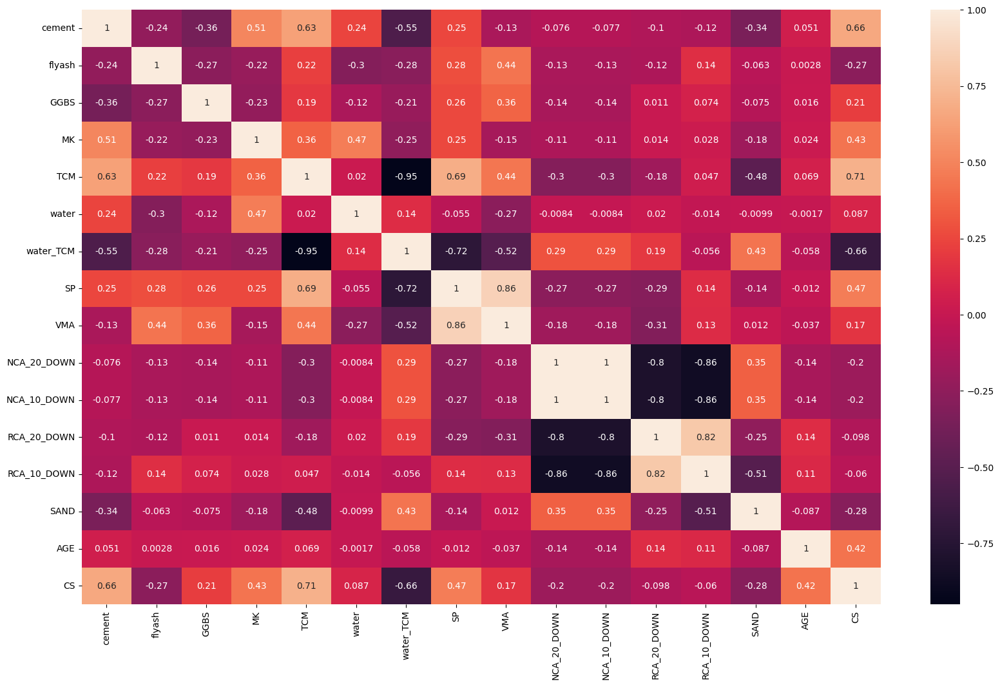

In [ ]:
sns.heatmap(data=dataset3.corr(), annot=True)

fig=plt.gcf()
fig.set_size_inches(20,12)
plt.show()

In [ ]:
# Calcula la matriz de correlación y guárdala en una variable
corr_matrix = dataset3.corr()

# Imprime (o muestra) la tabla de datos
print("Matriz de correlación:")
print(corr_matrix)

Matriz de correlación:
               cement    flyash      GGBS        MK       TCM     water  \
cement       1.000000 -0.235898 -0.364124  0.512218  0.633871  0.240516   
flyash      -0.235898  1.000000 -0.269050 -0.216755  0.218907 -0.298499   
GGBS        -0.364124 -0.269050  1.000000 -0.233209  0.192243 -0.121687   
MK           0.512218 -0.216755 -0.233209  1.000000  0.357648  0.473039   
TCM          0.633871  0.218907  0.192243  0.357648  1.000000  0.020425   
water        0.240516 -0.298499 -0.121687  0.473039  0.020425  1.000000   
water_TCM   -0.546810 -0.279499 -0.210405 -0.248184 -0.950320  0.136791   
SP           0.246028  0.281600  0.258922  0.254225  0.692999 -0.054885   
VMA         -0.129110  0.435641  0.364552 -0.148535  0.437858 -0.270908   
NCA_20_DOWN -0.076495 -0.131659 -0.141654 -0.114121 -0.301128 -0.008390   
NCA_10_DOWN -0.076534 -0.131658 -0.141652 -0.114120 -0.301164 -0.008390   
RCA_20_DOWN -0.104670 -0.119842  0.011364  0.013897 -0.176631  0.020118   
RC

In [ ]:
#g = sns.PairGrid(dataset, hue="csMPa", palette='viridis')
#g.map_diag(sns.histplot)
#g.map_offdiag(sns.scatterplot)
#g.add_legend() #Tarda como 7 minutos

# ***Preprocesamiento de Datos***

In [ ]:
# Configuración de estilo y tamaño global (versión ampliada)
plt.rcParams.update({
    'font.size': 16,        # Tamaño base
    'axes.titlesize': 20,   # Título más grande
    'axes.labelsize': 18,   # Etiquetas de los ejes
    'xtick.labelsize': 14,  # Números del eje X
    'ytick.labelsize': 14,  # Números del eje Y
    'legend.fontsize': 14,  # Texto de leyendas
})

## Dataset 1

### **Separar variables independientes y dependiente**

In [ ]:
# Definimos Entradas y Salidas
X1 = dataset1.drop('csMPa', axis=1)    #drop quita una columna de un dataframe, y devuelve otra dataframe
y1 = dataset1['csMPa']                 #Asignamos únicamente la columna de interés

### **Verificar sesgo en la variable objetivo**

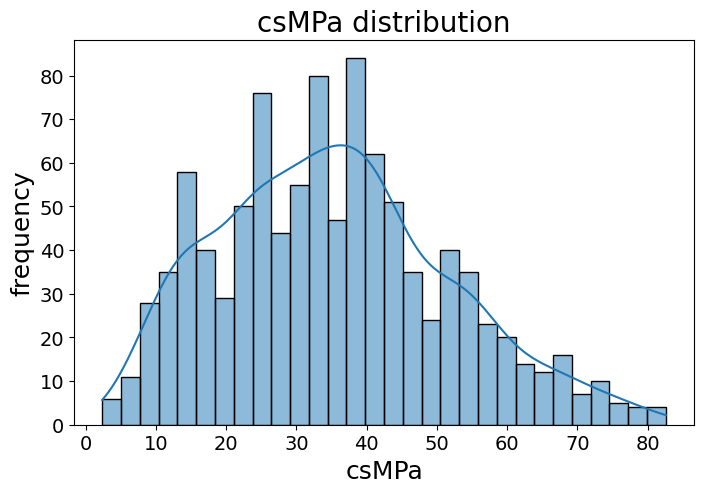

Skewness: 0.395062169356232


In [ ]:
# Histograma
plt.figure(figsize=(8, 5))
sns.histplot(y1, kde=True, bins=30)
plt.title('csMPa distribution')
plt.xlabel('csMPa')
plt.ylabel('frequency')
plt.show()

# Calcular asimetría
print("Skewness:", skew(y1))

Interpretación del skew:

- Cerca de 0 → simétrica

- 1 o menor a -1 → altamente sesgada

- Entre 0.5 y 1 o -0.5 y -1 → moderadamente sesgada

- Mayor a 1.0	Altamente sesgada (no normal)

Conclusión:
La variable objetivo csMPa tiene una ligera asimetría positiva, por lo que no es necesario aplicar transformación logarítmica.

### **Dividir datos para Entrenamineto y prueba**

In [ ]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.3, random_state=123)

In [ ]:
X_train1.shape

(703, 8)

In [ ]:
X_test1.shape

(302, 8)

### **Escalar base de datos**

In [ ]:
scaler = StandardScaler()
X_train_scaled1 = scaler.fit_transform(X_train1)
X_test_scaled1 = scaler.transform(X_test1)

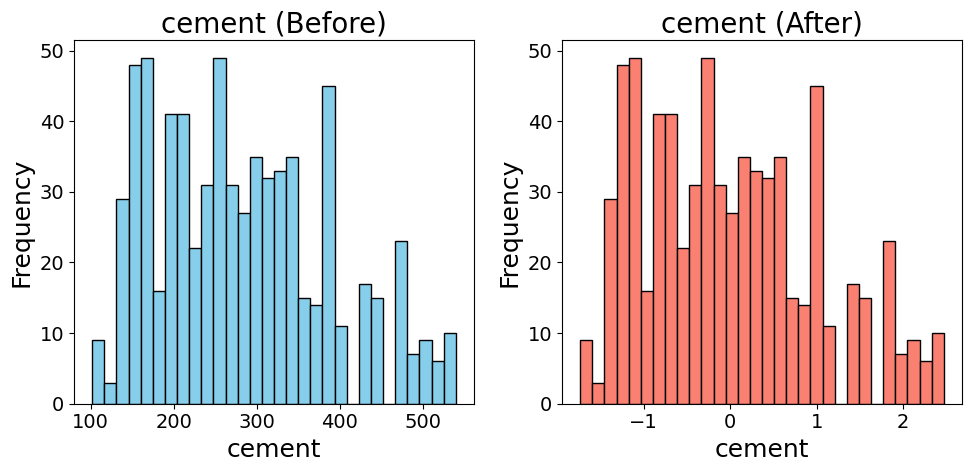

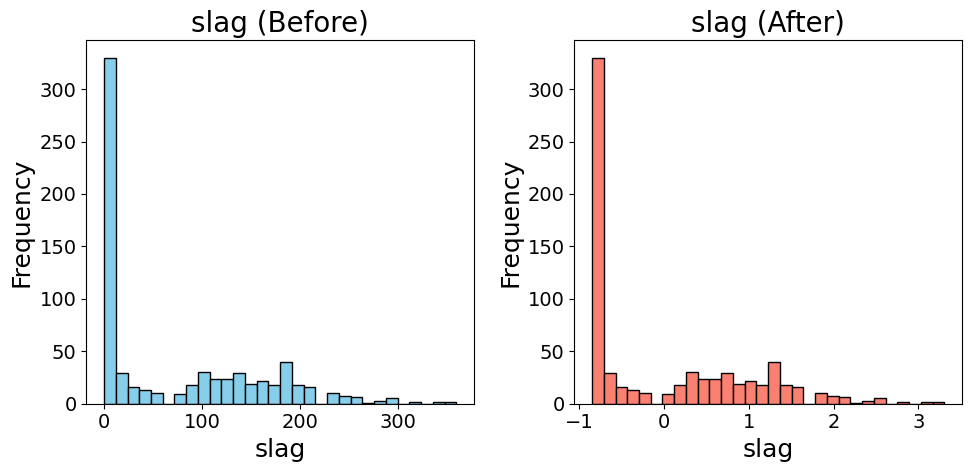

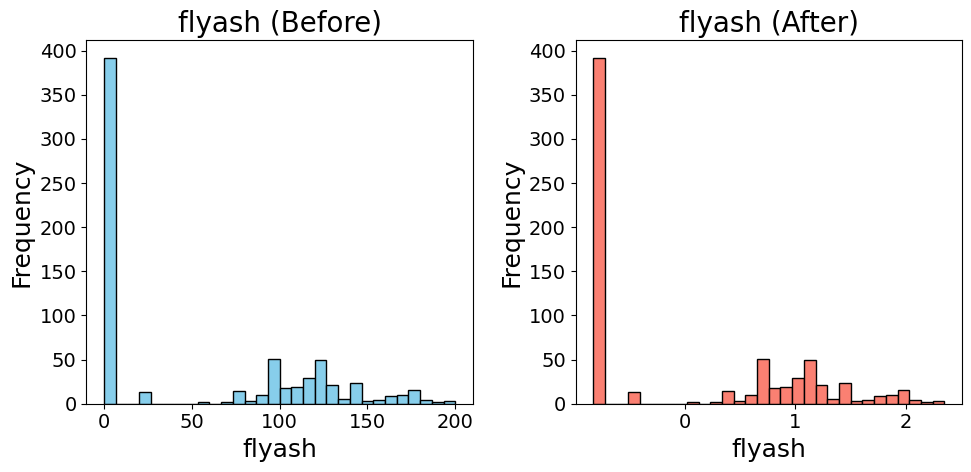

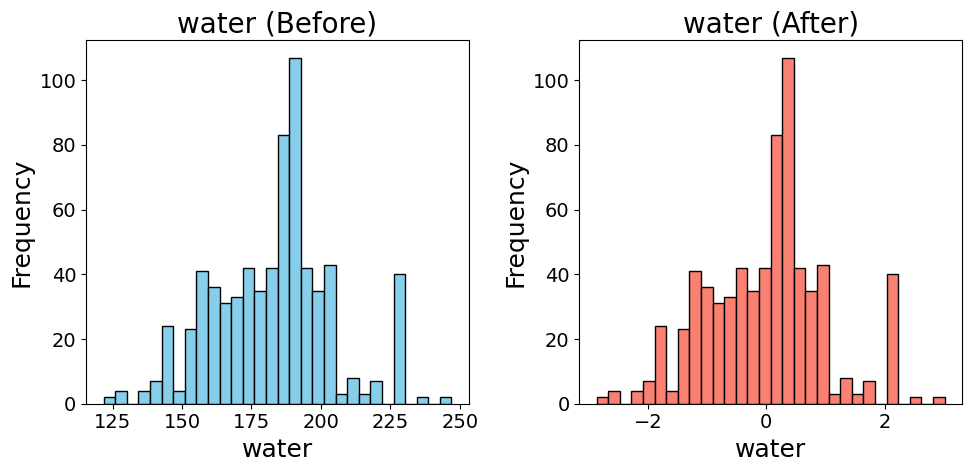

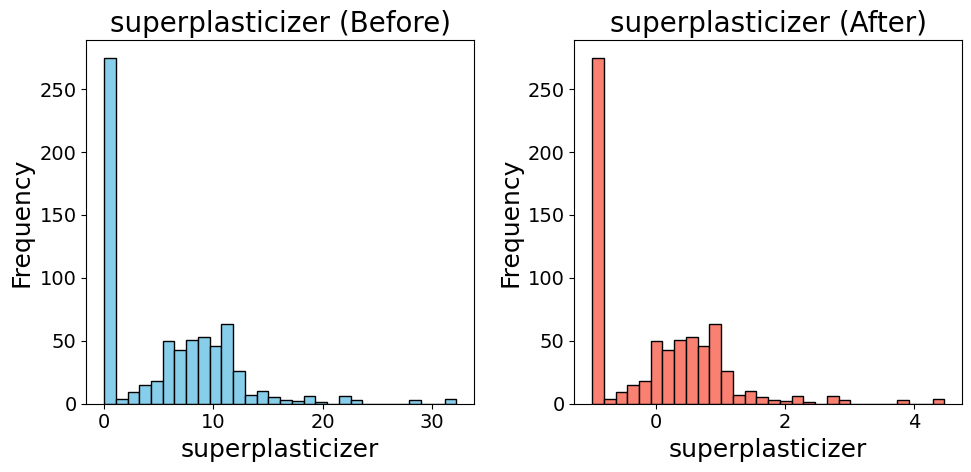

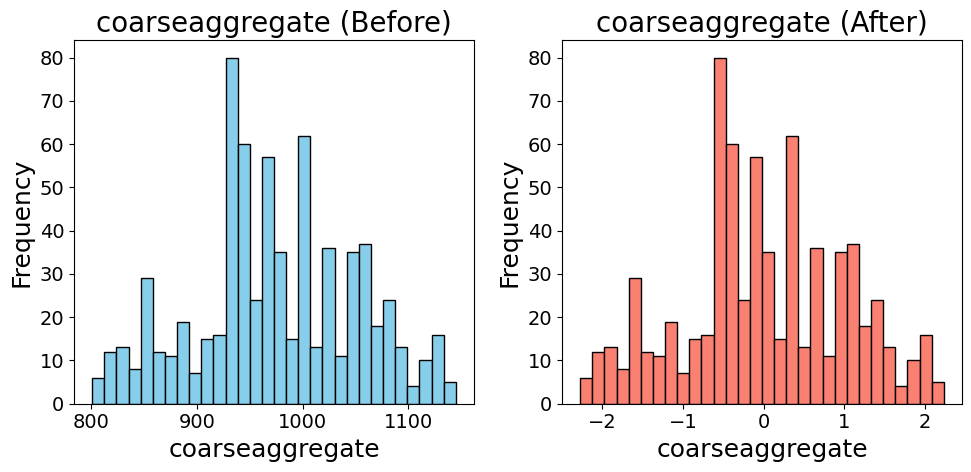

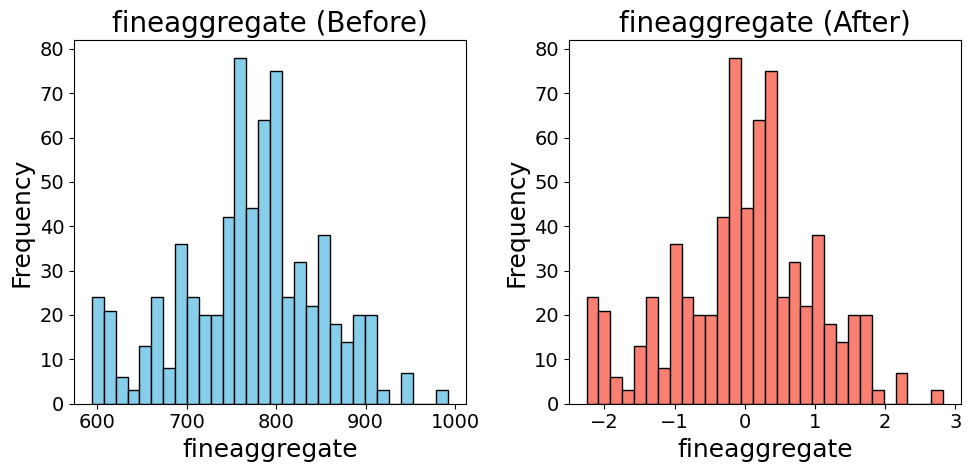

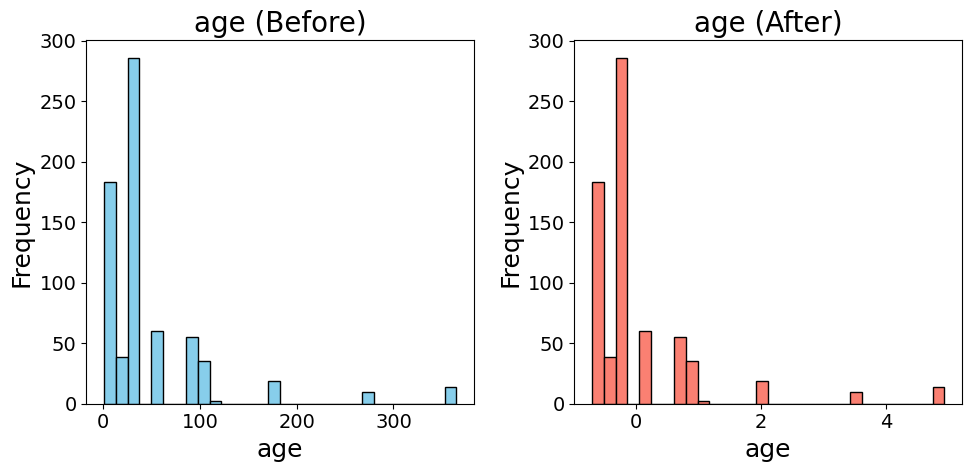

In [ ]:
import matplotlib.pyplot as plt

# Iterar sobre todas las variables de entrada
for feature in X_train1.columns:
    plt.figure(figsize=(10,5))

    # Histograma antes de escalar
    plt.subplot(1,2,1)
    plt.hist(X_train1[feature], bins=30, color="skyblue", edgecolor="black")
    plt.title(f"{feature} (Before)")
    plt.xlabel(feature)
    plt.ylabel("Frequency")

    # Histograma después de escalar
    plt.subplot(1,2,2)
    # Usamos la posición de la columna
    col_idx = list(X_train1.columns).index(feature)
    plt.hist(X_train_scaled1[:, col_idx], bins=30, color="salmon", edgecolor="black")
    plt.title(f"{feature} (After)")
    plt.xlabel(feature)
    plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()


## Dataset 2

### **Separar variables independientes y dependiente**

In [ ]:
# Definimos Entradas y Salidas
X2 = dataset2.drop('Strength', axis=1)    #drop quita una columna de un dataframe, y devuelve otra dataframe
y2 = dataset2['Strength']                 #Asignamos únicamente la columna de interés

### **Verificar sesgo en la variable objetivo**

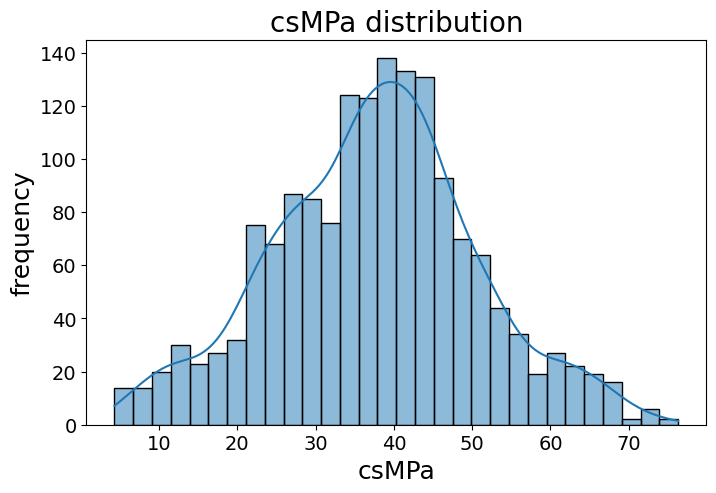

Skewness: 0.007232031053623096


In [ ]:
# Histograma
plt.figure(figsize=(8, 5))
sns.histplot(y2, kde=True, bins=30)
plt.title('csMPa distribution')
plt.xlabel('csMPa')
plt.ylabel('frequency')
plt.show()

# Calcular asimetría
print("Skewness:", skew(y2))

Interpretación del skew:

- Cerca de 0 → simétrica

- 1 o menor a -1 → altamente sesgada

- Entre 0.5 y 1 o -0.5 y -1 → moderadamente sesgada

- Mayor a 1.0	Altamente sesgada (no normal)

Conclusión:
La variable objetivo csMPa está prácticamente simétrica respecto a una distribución normal.

### **Dividir datos para Entrenamineto y prueba**

In [ ]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.3, random_state=123)

In [ ]:
X_train2.shape

(1132, 9)

In [ ]:
X_test2.shape

(486, 9)

### **Escalar base de datos**

In [ ]:
scaler = StandardScaler()
X_train_scaled2 = scaler.fit_transform(X_train2)
X_test_scaled2 = scaler.transform(X_test2)

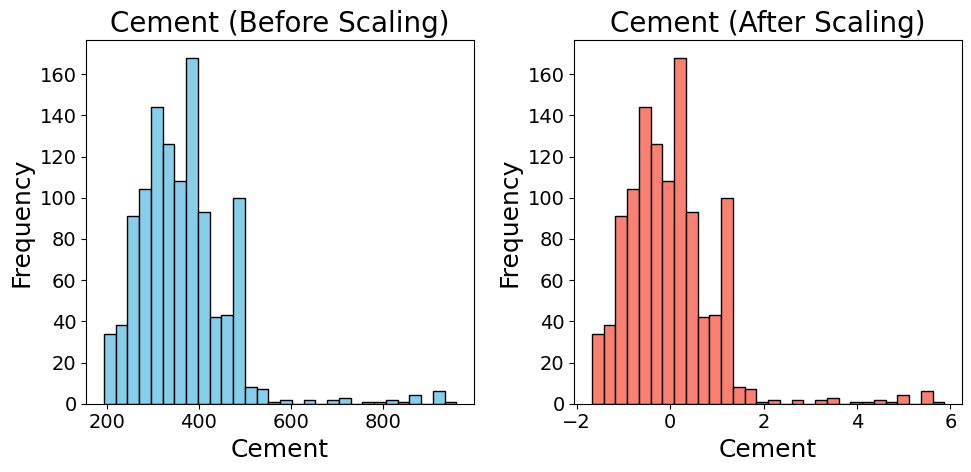

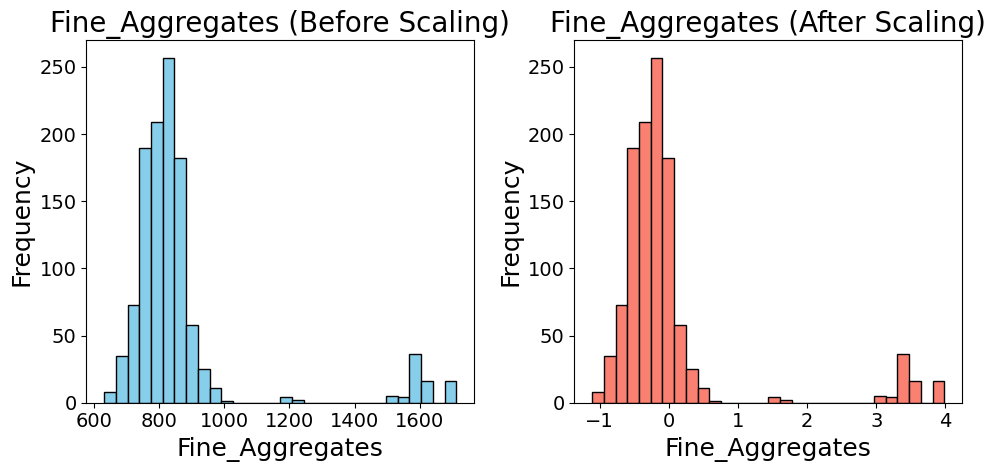

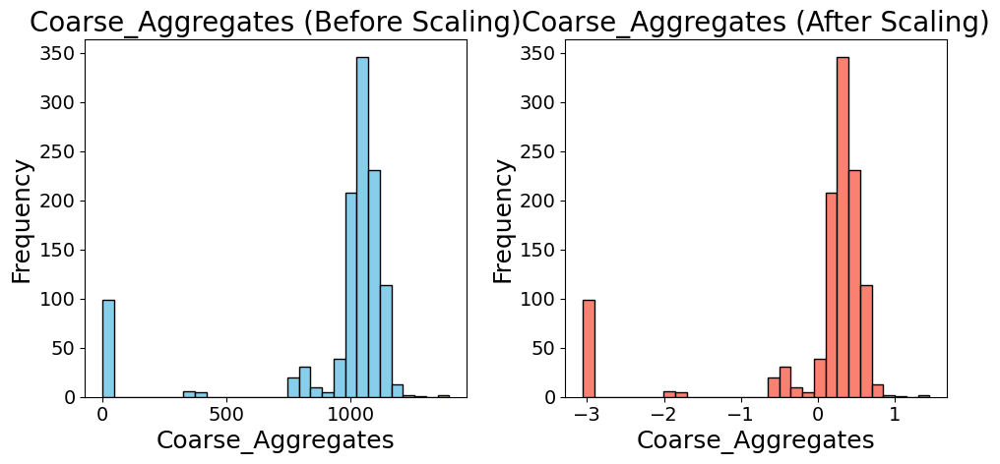

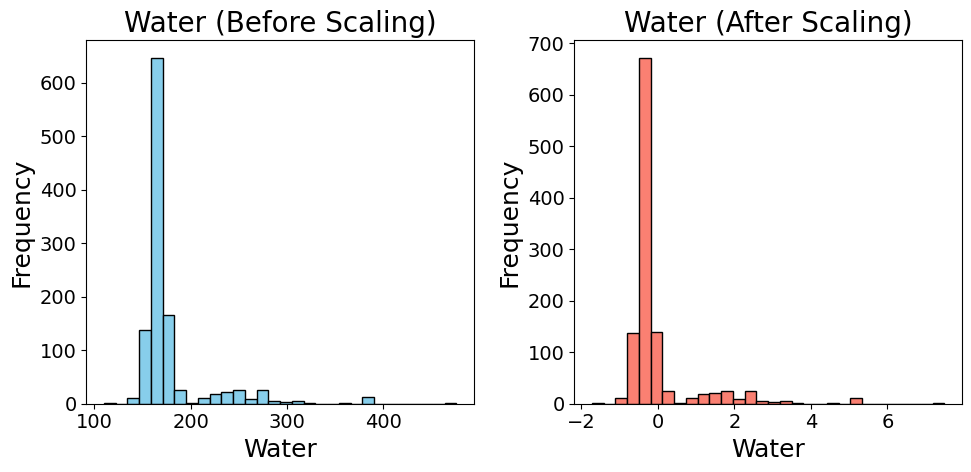

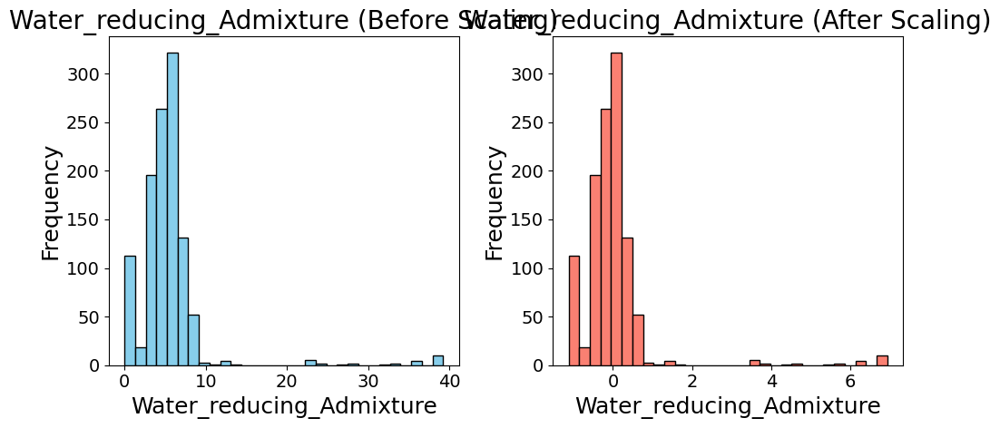

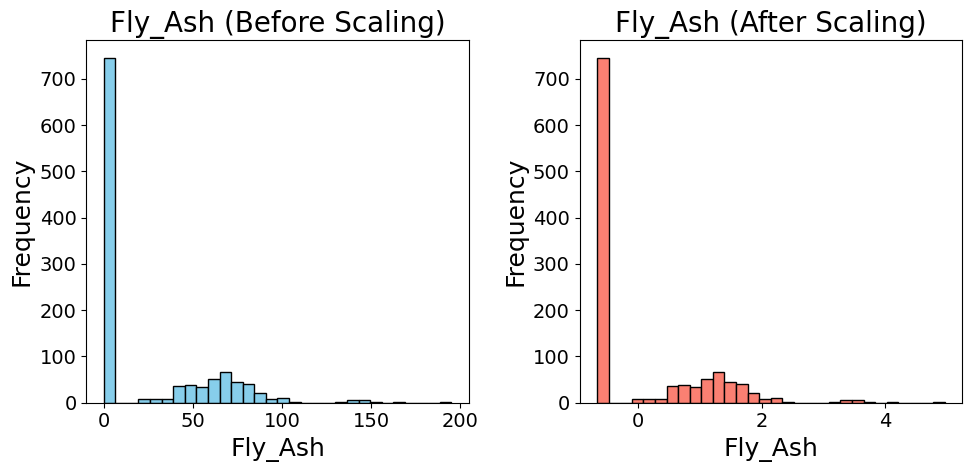

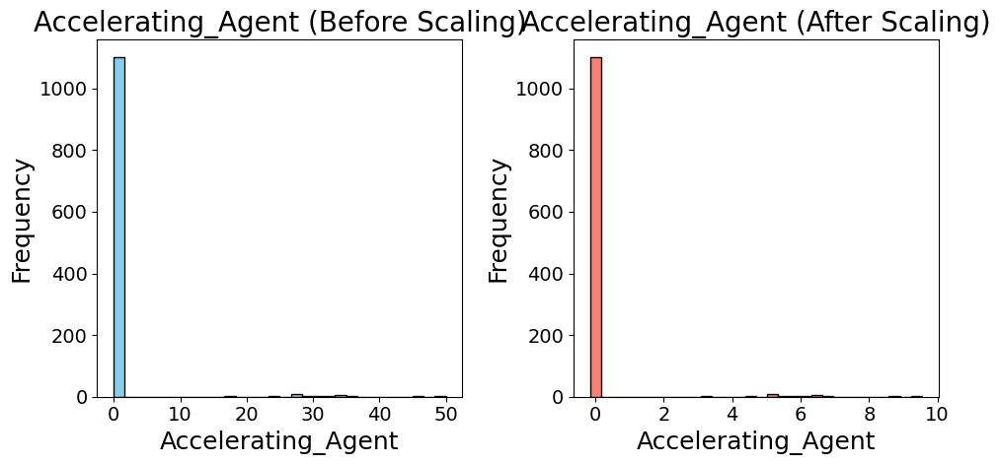

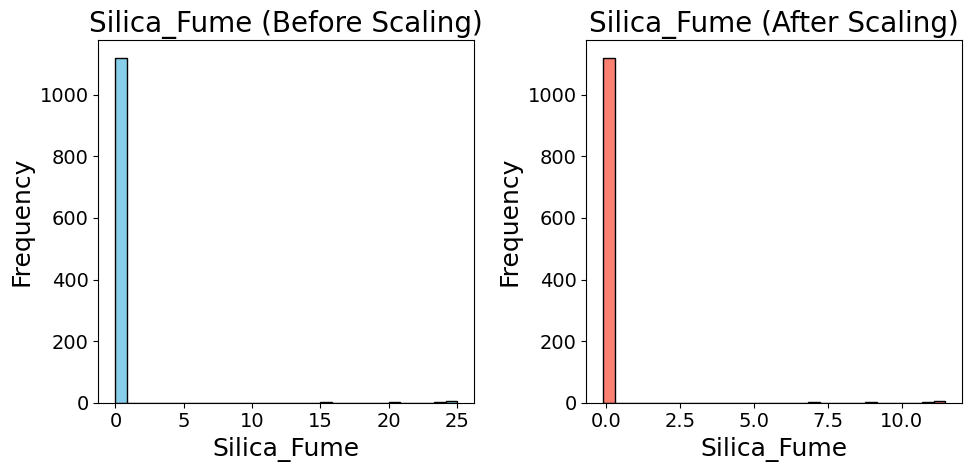

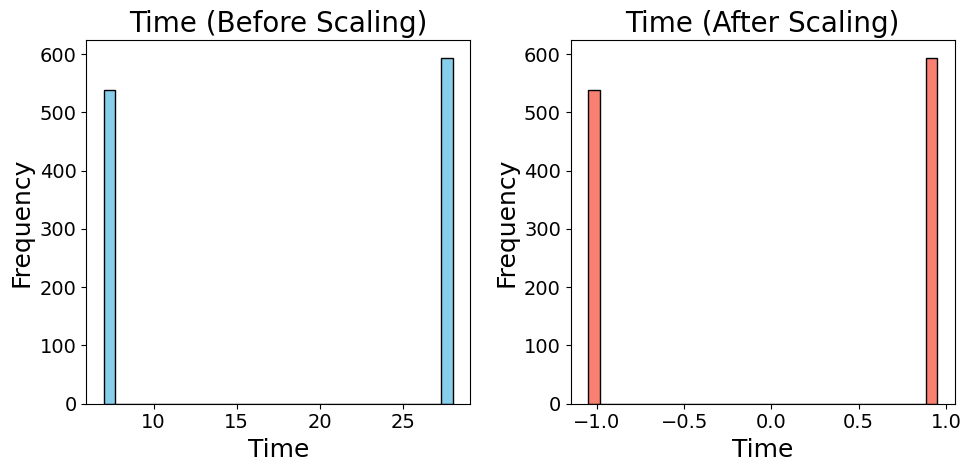

In [ ]:
import matplotlib.pyplot as plt

# Iterar sobre todas las variables de entrada
for feature in X_train2.columns:
    plt.figure(figsize=(10,5))

    # Histograma antes de escalar
    plt.subplot(1,2,1)
    plt.hist(X_train2[feature], bins=30, color="skyblue", edgecolor="black")
    plt.title(f"{feature} (Before Scaling)")
    plt.xlabel(feature)
    plt.ylabel("Frequency")

    # Histograma después de escalar
    plt.subplot(1,2,2)
    # Usamos la posición de la columna
    col_idx = list(X_train2.columns).index(feature)
    plt.hist(X_train_scaled2[:, col_idx], bins=30, color="salmon", edgecolor="black")
    plt.title(f"{feature} (After Scaling)")
    plt.xlabel(feature)
    plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()


## Dataset 3

### **Separar variables independientes y dependiente**

In [ ]:
# Definimos Entradas y Salidas
X3 = dataset3.drop('CS', axis=1)    #drop quita una columna de un dataframe, y devuelve otra dataframe
y3 = dataset3['CS']                 #Asignamos únicamente la columna de interés

### **Verificar sesgo en la variable objetivo**

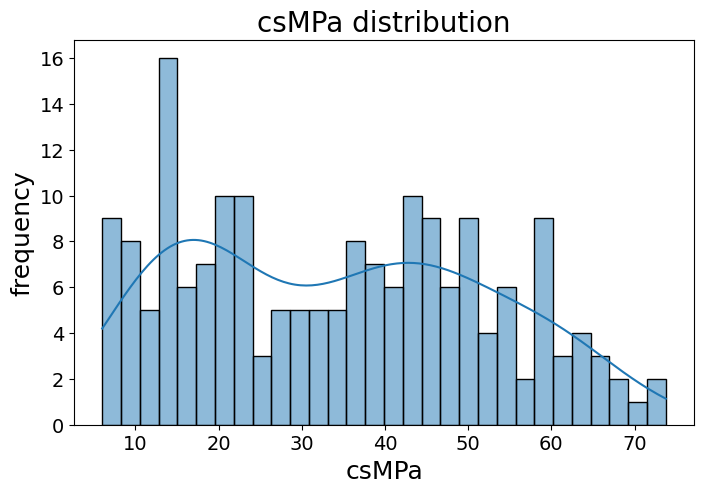

Skewness: 0.20263704209539016


In [ ]:
# Histograma
plt.figure(figsize=(8, 5))
sns.histplot(y3, kde=True, bins=30)
plt.title('csMPa distribution')
plt.xlabel('csMPa')
plt.ylabel('frequency')
plt.show()

# Calcular asimetría
print("Skewness:", skew(y3))

Interpretación del skew:

- Cerca de 0 → simétrica

- 1 o menor a -1 → altamente sesgada

- Entre 0.5 y 1 o -0.5 y -1 → moderadamente sesgada

- Mayor a 1.0	Altamente sesgada (no normal)

Conclusión:
La variable objetivo csMPa tiene una ligera asimetría positiva, por lo que no es necesario aplicar transformación logarítmica.

### **Dividir datos para Entrenamineto y prueba**

In [ ]:
X_train3, X_test3, y_train3, y_test3 = train_test_split(X3, y3, test_size=0.3, random_state=123)

In [ ]:
X_train3.shape

(129, 15)

In [ ]:
X_test3.shape

(56, 15)

### **Escalar base de datos**

In [ ]:
scaler = StandardScaler()
X_train_scaled3 = scaler.fit_transform(X_train3)
X_test_scaled3 = scaler.transform(X_test3)

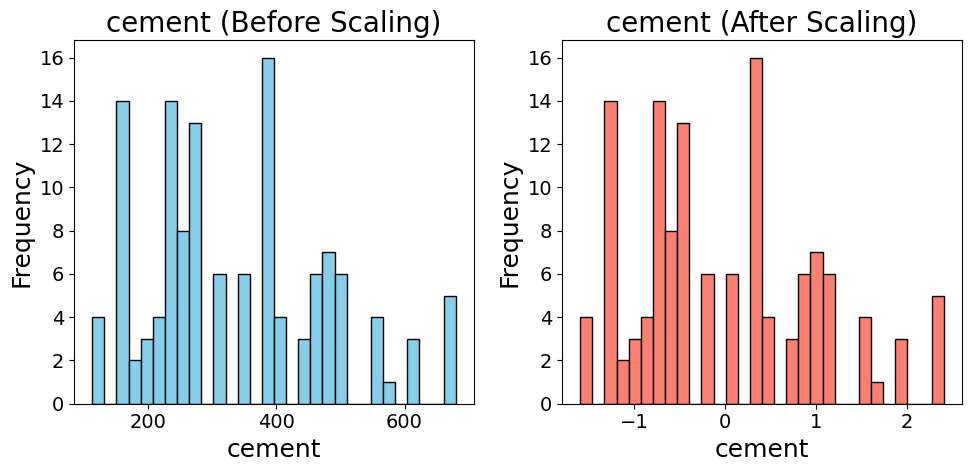

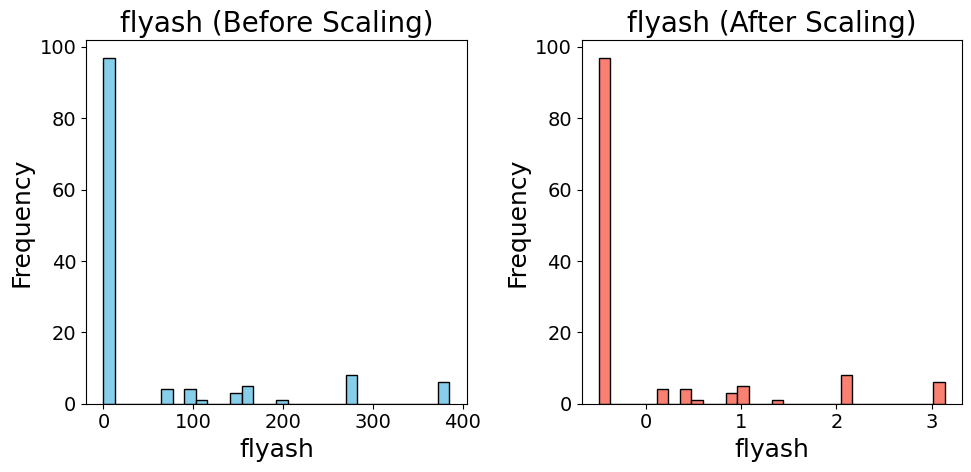

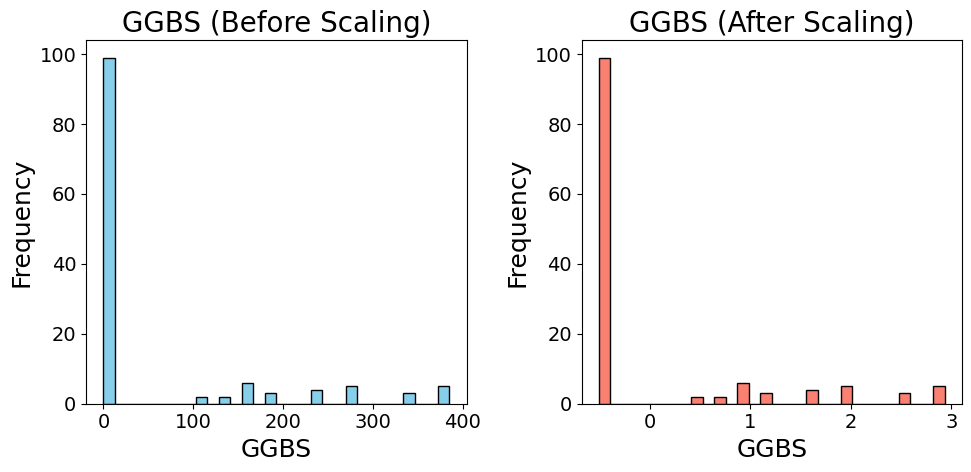

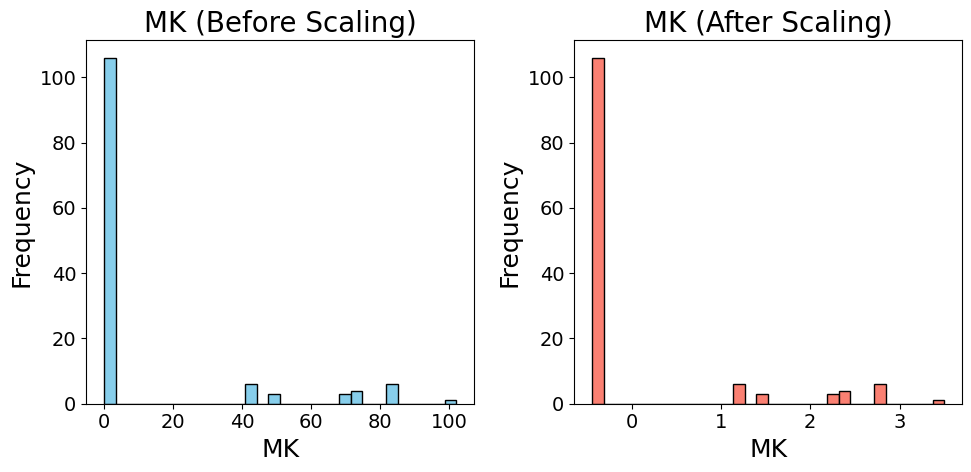

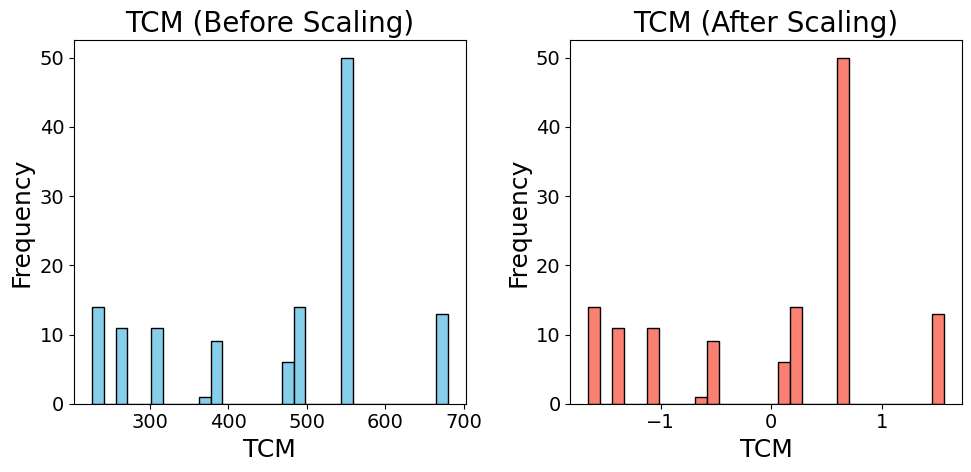

...

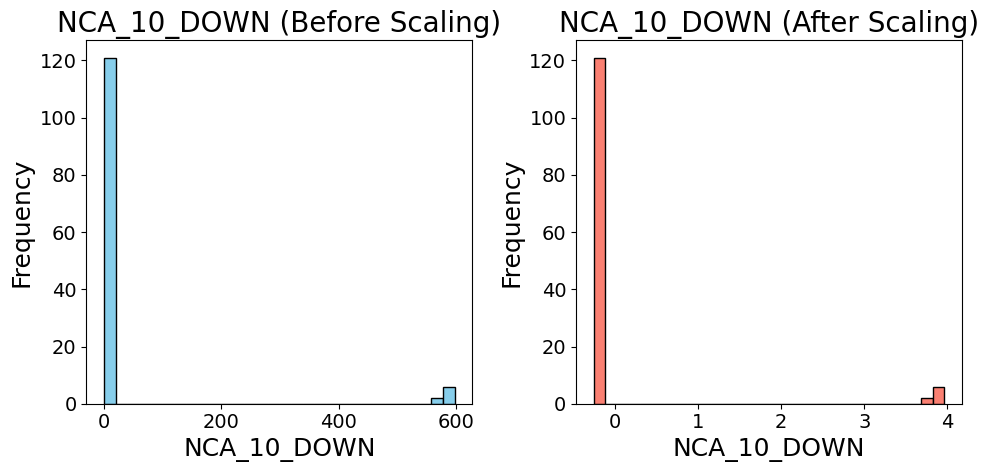

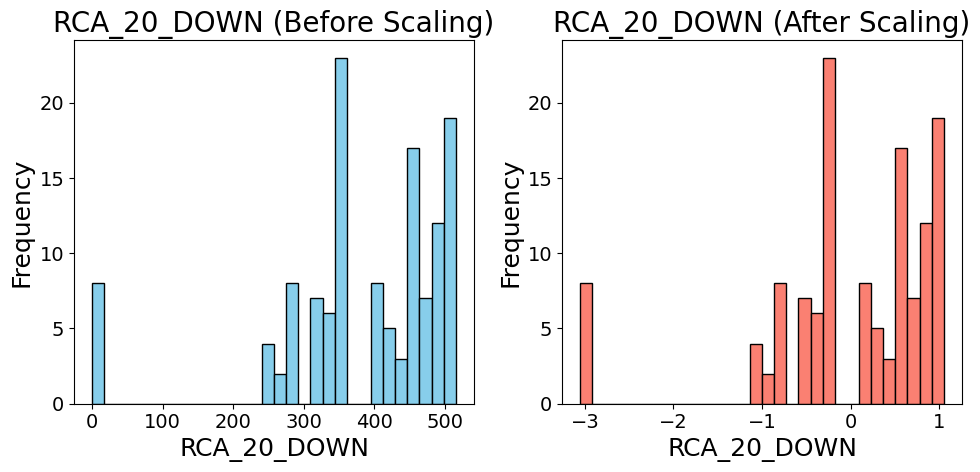

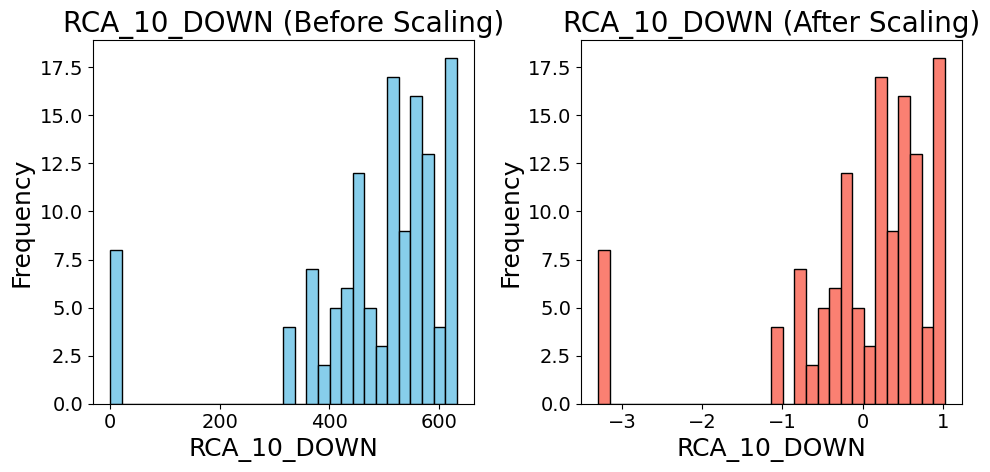

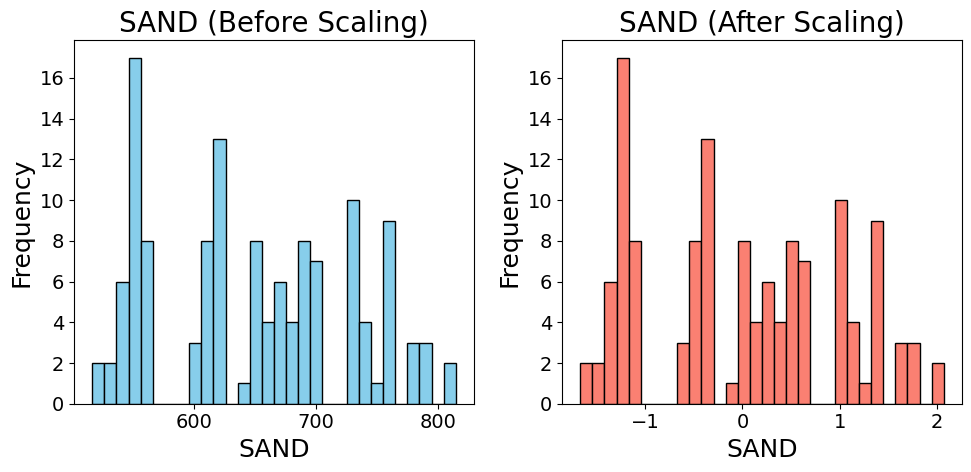

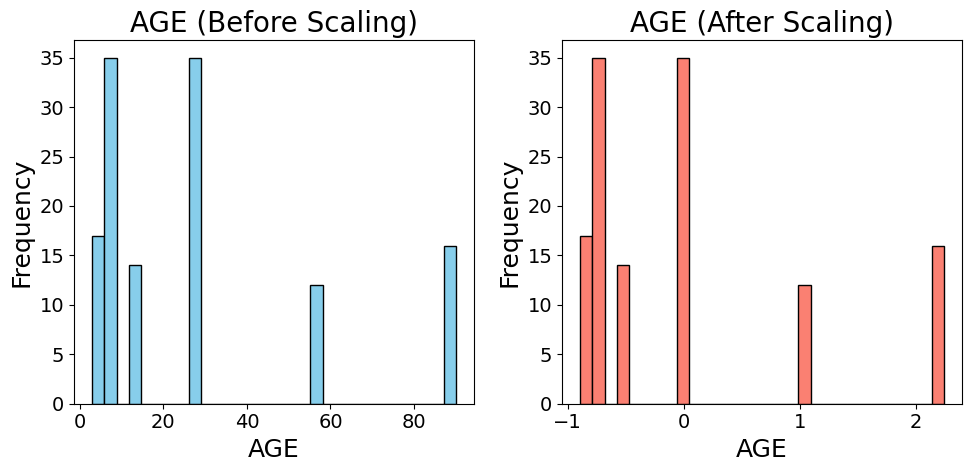

In [ ]:
import matplotlib.pyplot as plt

# Iterar sobre todas las variables de entrada
for feature in X_train3.columns:
    plt.figure(figsize=(10,5))

    # Histograma antes de escalar
    plt.subplot(1,2,1)
    plt.hist(X_train3[feature], bins=30, color="skyblue", edgecolor="black")
    plt.title(f"{feature} (Before Scaling)")
    plt.xlabel(feature)
    plt.ylabel("Frequency")

    # Histograma después de escalar
    plt.subplot(1,2,2)
    # Usamos la posición de la columna
    col_idx = list(X_train3.columns).index(feature)
    plt.hist(X_train_scaled3[:, col_idx], bins=30, color="salmon", edgecolor="black")
    plt.title(f"{feature} (After Scaling)")
    plt.xlabel(feature)
    plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()


# ***Analisis de los Algoritmos***

## **Identificación de Hiperparametros**

###Regresión Lineal

In [ ]:
lr = LinearRegression()
print(lr.get_params())

{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}


###Random Forest

In [ ]:
rf = RandomForestRegressor()
print(rf.get_params())

{'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


###CatBoost

In [ ]:
cb = CatBoostRegressor()
print(cb.get_params())

{'loss_function': 'RMSE'}


###XGBoost

In [ ]:
xgb = XGBRegressor()
print(xgb.get_params())

{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'feature_weights': None, 'gamma': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': None, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': None, 'max_leaves': None, 'min_child_weight': None, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': None, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': None, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}


###LightGBM

In [ ]:
lgbm = LGBMRegressor()
print(lgbm.get_params())

{'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.1, 'max_depth': -1, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 100, 'n_jobs': None, 'num_leaves': 31, 'objective': None, 'random_state': None, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0}


### KNN

In [ ]:
knn = KNeighborsRegressor()
print(knn.get_params())

{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}


### SVR

In [ ]:
svr = SVR()
print(svr.get_params())

{'C': 1.0, 'cache_size': 200, 'coef0': 0.0, 'degree': 3, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'shrinking': True, 'tol': 0.001, 'verbose': False}


### MLP

In [ ]:
mlp = MLPRegressor()
print(mlp.get_params())

{'activation': 'relu', 'alpha': 0.0001, 'batch_size': 'auto', 'beta_1': 0.9, 'beta_2': 0.999, 'early_stopping': False, 'epsilon': 1e-08, 'hidden_layer_sizes': (100,), 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_fun': 15000, 'max_iter': 200, 'momentum': 0.9, 'n_iter_no_change': 10, 'nesterovs_momentum': True, 'power_t': 0.5, 'random_state': None, 'shuffle': True, 'solver': 'adam', 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': False, 'warm_start': False}


# ***Entrenamiento de los Modelos***

## **Diccionarios**

In [ ]:
# diccionario que se utilizara para guardar las predicciones de los modelos, estos se utilizaran para graficar los resultados
predictions_db1 = {}
predictions_db2 = {}
predictions_db3 = {}

In [ ]:
# diccionario que se utilizara para guardar los modelos optimizados, estos se utilizaran para graficar los resultados
models_dic_db1 = {}
models_dic_db2 = {}
models_dic_db3 = {}

# diccionario temporal que se utilizara para comparar el modelo escalado y sin escalar para el algoritmo de Regresion Lineal
lr_scaled_temp = {}

In [ ]:
# Diccionario para almacenar los resultados de los modelos
results_db1 = {'Modelo': [], 'RMSE': [], 'MAE': [], 'MAPE (%)': [], 'R²': []}
results_db2 = {'Modelo': [], 'RMSE': [], 'MAE': [], 'MAPE (%)': [], 'R²': []}
results_db3 = {'Modelo': [], 'RMSE': [], 'MAE': [], 'MAPE (%)': [], 'R²': []}


In [ ]:
# Diccionarios Maestros

## Modelos
models_dics = {
    "Dataset 1": models_dic_db1,
    "Dataset 2": models_dic_db2,
    "Dataset 3": models_dic_db3
}

#e Predicciones
predictions_dics = {
    "Dataset 1": predictions_db1,
    "Dataset 2": predictions_db2,
    "Dataset 3": predictions_db3
}

# Resultados
results_dics = {
    "Dataset 1": results_db1,
    "Dataset 2": results_db2,
    "Dataset 3": results_db3
}

In [ ]:
# --- Diccionario con los datasets para entrenamiento y evaluacion ---

## Train
datasets_train = {
    "Dataset 1": (X_train1, y_train1),
    "Dataset 2": (X_train2, y_train2),
    "Dataset 3": (X_train3, y_train3)
}

datasets_train_scaled = {
    "Dataset 1": (X_train_scaled1, y_train1),
    "Dataset 2": (X_train_scaled2, y_train2),
    "Dataset 3": (X_train_scaled3, y_train3)
}

## Test
datasets_test = {
    "Dataset 1": (X_test1, y_test1),
    "Dataset 2": (X_test2, y_test2),
    "Dataset 3": (X_test3, y_test3)
}

datasets_test_scaled = {
    "Dataset 1": (X_test_scaled1, y_test1),
    "Dataset 2": (X_test_scaled2, y_test2),
    "Dataset 3": (X_test_scaled3, y_test3)
}

## **Función de Evaluación de Metricas**

In [ ]:
def _dispersion(y, mode='std'):
    y = np.asarray(y).ravel()
    if mode == 'std':
        denom = float(np.std(y, ddof=0))  # población; consistente entre datasets
    elif mode == 'iqr':
        q75, q25 = np.percentile(y, [75, 25])
        denom = float(q75 - q25)
    elif mode == 'range':
        denom = float(np.max(y) - np.min(y))
    else:
        raise ValueError("normalizer must be 'std', 'iqr', or 'range'")
    return denom

In [ ]:
def mean_absolute_percentage_error(y_true, y_pred):  # Evita errores si y_true tiene ceros
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    nonzero = y_true != 0
    return np.mean(np.abs((y_true[nonzero] - y_pred[nonzero]) / y_true[nonzero])) * 100

In [ ]:
def evaluate_model(ds_name: str, optimized: bool, name, model, X_test, y_test,
                   normalizer: str = 'std', nrmse_as_pct: bool = False):
    """
    Evalúa un modelo y guarda métricas (incluye nRMSE) en results_dics[ds_name].
    normalizer: 'std' (default), 'iqr' o 'range'
    nrmse_as_pct: si True, reporta nRMSE en porcentaje.
    """
    y_pred = model.predict(X_test)

    # Métricas base
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae  = mean_absolute_error(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2   = r2_score(y_test, y_pred)

    # nRMSE
    denom = _dispersion(y_test, mode=normalizer)
    if denom > 0:
        nrmse = rmse / denom
    else:
        nrmse = np.nan  # evita división por cero si y_test es constante

    nrmse_out = nrmse * 100.0 if nrmse_as_pct and np.isfinite(nrmse) else nrmse

    # Guardar en el diccionario maestro (crea la clave si no existe)
    if optimized:
        d = results_dics[ds_name]
        # Asegura las claves
        for k in ['Modelo', 'RMSE', 'MAE', 'MAPE (%)', 'R²', 'nRMSE']:
            d.setdefault(k, [])
        # Append
        d['Modelo'].append(name)
        d['RMSE'].append(rmse)
        d['MAE'].append(mae)
        d['MAPE (%)'].append(mape)
        d['R²'].append(r2)
        d['nRMSE'].append(nrmse_out)

    # Print amigable
    if nrmse_as_pct:
        print(f"{ds_name} – {name}: RMSE={rmse:.3f}, MAE={mae:.3f}, MAPE={mape:.2f}%, R²={r2:.3f}, nRMSE({normalizer})={nrmse_out:.2f}%")
    else:
        print(f"{ds_name} – {name}: RMSE={rmse:.3f}, MAE={mae:.3f}, MAPE={mape:.2f}%, R²={r2:.3f}, nRMSE({normalizer})={nrmse_out:.3f}")

## **Modelos**

### Estandarización de CV

In [ ]:
# 5 Splits
kf5 = KFold(n_splits=5, shuffle=True, random_state=42)
# 3 Splits
kf3 = KFold(n_splits=3, shuffle=True, random_state=42)


### Regresión Lineal

#### Entrenamiento de los Modelos

In [ ]:
# Espacio de búsqueda de hiperparámetros
params_lr = {
    'fit_intercept': [True, False],
    'positive': [True, False]
}

In [ ]:
lr = LinearRegression()

In [ ]:
# --- Entrenamiento automático con loop sin escalar ---
results_lr = {}
for name, (X_train, y_train) in datasets_train.items():
    rs = RandomizedSearchCV(
        estimator=lr,
        param_distributions=params_lr,
        n_iter=50,
        cv=kf5,
        scoring="neg_mean_squared_error",
        random_state=42,
        n_jobs=-1
    )
    model = rs.fit(X_train, y_train)
    results_lr[name] = model

# --- Entrenamiento automático con loop escalado---
results_s_lr = {}
for name, (X_train, y_train) in datasets_train_scaled.items():
    rs = RandomizedSearchCV(
        estimator=lr,
        param_distributions=params_lr,
        n_iter=50,
        cv=kf5,
        scoring="neg_mean_squared_error",
        random_state=42,
        n_jobs=-1
    )
    model = rs.fit(X_train, y_train)
    results_s_lr[name] = model

/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 4 is smaller than n_iter=50. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 4 is smaller than n_iter=50. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 4 is smaller than n_iter=50. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 4 is smaller than n_iter=50. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/

In [ ]:
lr_m1 = results_lr["Dataset 1"]
lr_m2 = results_lr["Dataset 2"]
lr_m3 = results_lr["Dataset 3"]
# --------------- escalado
s_lr_m1 = results_s_lr["Dataset 1"]
s_lr_m2 = results_s_lr["Dataset 2"]
s_lr_m3 = results_s_lr["Dataset 3"]

In [ ]:
# Extraer el mejor modelo ya entrenado
mejor_lr1 = lr_m1.best_estimator_
mejor_lr2 = lr_m2.best_estimator_
mejor_lr3 = lr_m3.best_estimator_
print("Mejor Modelo Dataset 1:", mejor_lr1)
print("Mejor Modelo Dataset 2:", mejor_lr2)
print("Mejor Modelo Dataset 3:", mejor_lr3)
print("---------- escalado ----------")
# --------------- escalado
# Extraer el mejor modelo ya entrenado
mejor_s_lr1 = s_lr_m1.best_estimator_
mejor_s_lr2 = s_lr_m2.best_estimator_
mejor_s_lr3 = s_lr_m3.best_estimator_
print("Mejor Modelo Dataset 1:", mejor_s_lr1)
print("Mejor Modelo Dataset 2:", mejor_s_lr2)
print("Mejor Modelo Dataset 3:", mejor_s_lr3)

Mejor Modelo Dataset 1: LinearRegression(fit_intercept=False)
Mejor Modelo Dataset 2: LinearRegression()
Mejor Modelo Dataset 3: LinearRegression(positive=True)
---------- escalado ----------
Mejor Modelo Dataset 1: LinearRegression()
Mejor Modelo Dataset 2: LinearRegression()
Mejor Modelo Dataset 3: LinearRegression(positive=True)


In [ ]:
#Guardar el mejor modelo un un diccionario que se utilizara para los resultados
models_dic_db1["Linear Regression"] = mejor_lr1
models_dic_db2["Linear Regression"] = mejor_lr2
models_dic_db3["Linear Regression"] = mejor_lr3
# --------------- escalado
lr_scaled_temp["Linear Regression 1"] = mejor_s_lr1
lr_scaled_temp["Linear Regression 2"] = mejor_s_lr2
lr_scaled_temp["Linear Regression 3"] = mejor_s_lr3

In [ ]:
# Obtener predicciones del modelo
pred_lr1 = mejor_lr1.predict(X_test1)
pred_lr2 = mejor_lr2.predict(X_test2)
pred_lr3 = mejor_lr3.predict(X_test3)
# --------------- escalado
# Obtener predicciones del modelo
pred_s_lr1 = mejor_s_lr1.predict(X_test_scaled1)
pred_s_lr2 = mejor_s_lr2.predict(X_test_scaled2)
pred_s_lr3 = mejor_s_lr3.predict(X_test_scaled3)

In [ ]:
#Se alamcena en el diccionario de predicciones  - Sin escalar
predictions_db1["Linear Regression"] = pred_lr1
predictions_db2["Linear Regression"] = pred_lr2
predictions_db3["Linear Regression"] = pred_lr3

#### Evaluación de los Modelos


Linear Regression Results in Dataset 1:
Dataset 1 – Linear Regression: RMSE=9.682, MAE=7.594, MAPE=30.72%, R²=0.618, nRMSE(std)=61.81%


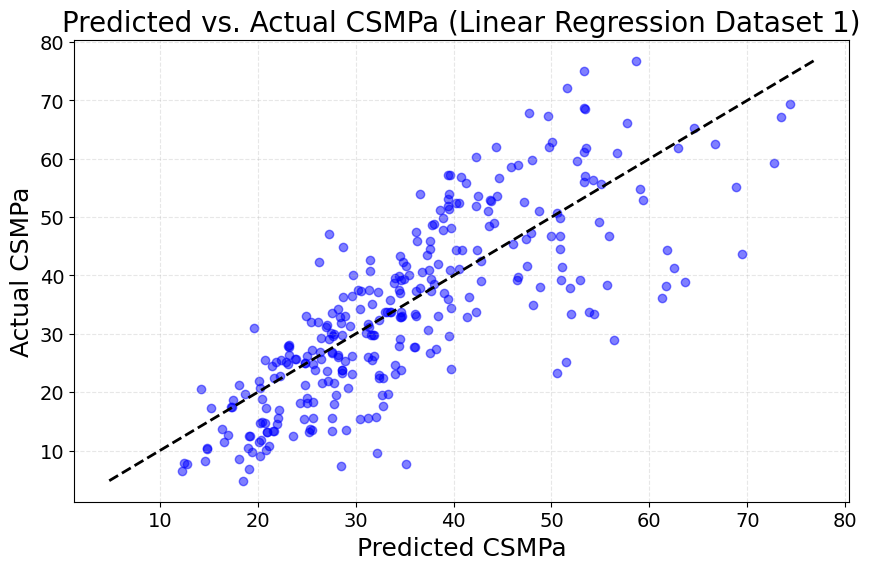

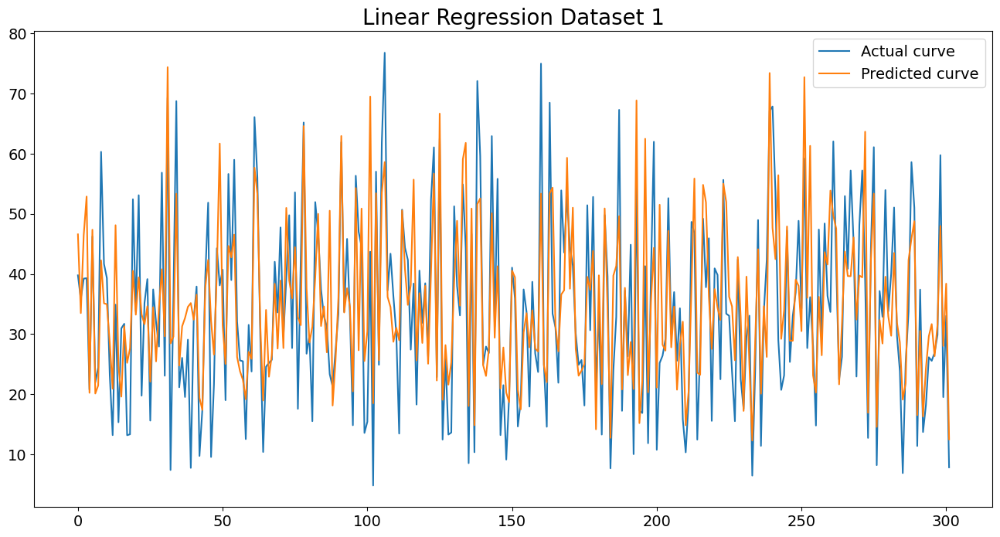


Linear Regression Results in Dataset 2:
Dataset 2 – Linear Regression: RMSE=6.844, MAE=4.340, MAPE=21.88%, R²=0.711, nRMSE(std)=53.75%


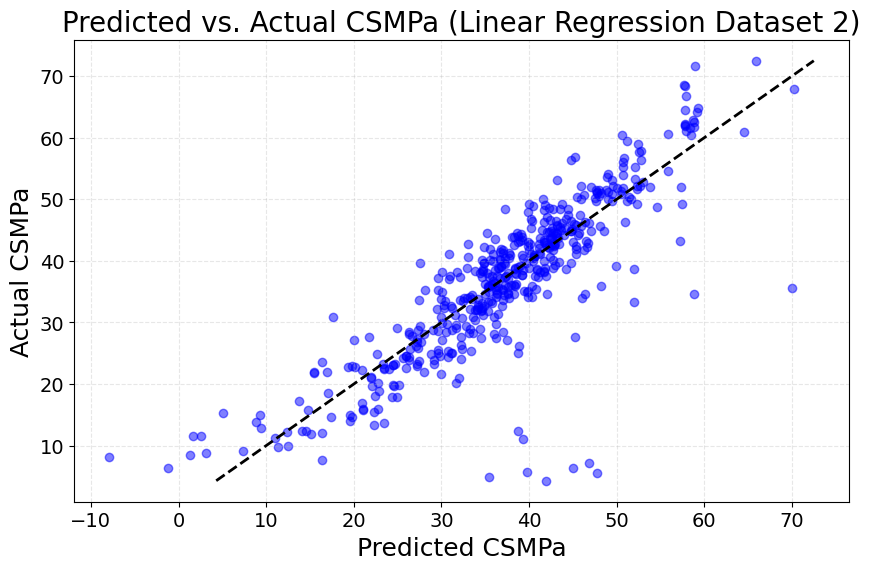

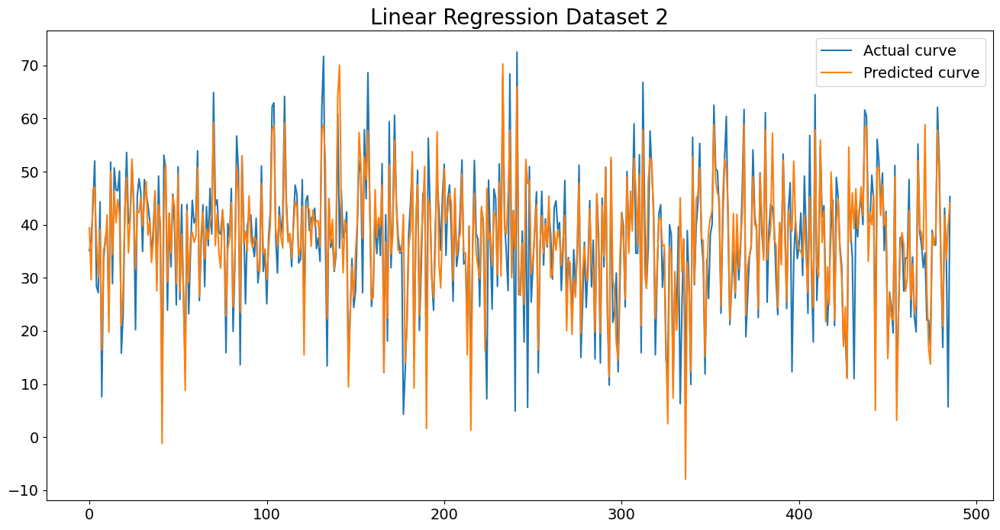


Linear Regression Results in Dataset 3:
Dataset 3 – Linear Regression: RMSE=7.397, MAE=6.203, MAPE=23.67%, R²=0.843, nRMSE(std)=39.64%


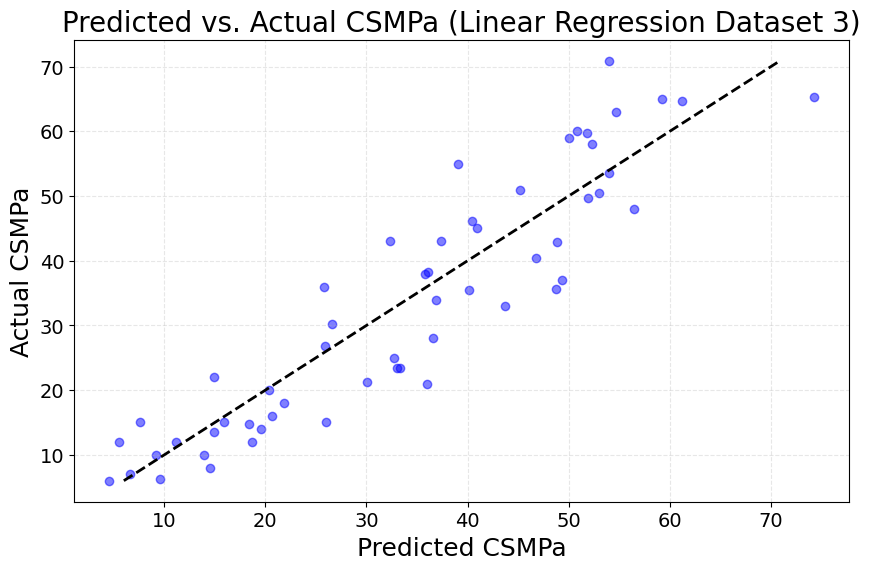

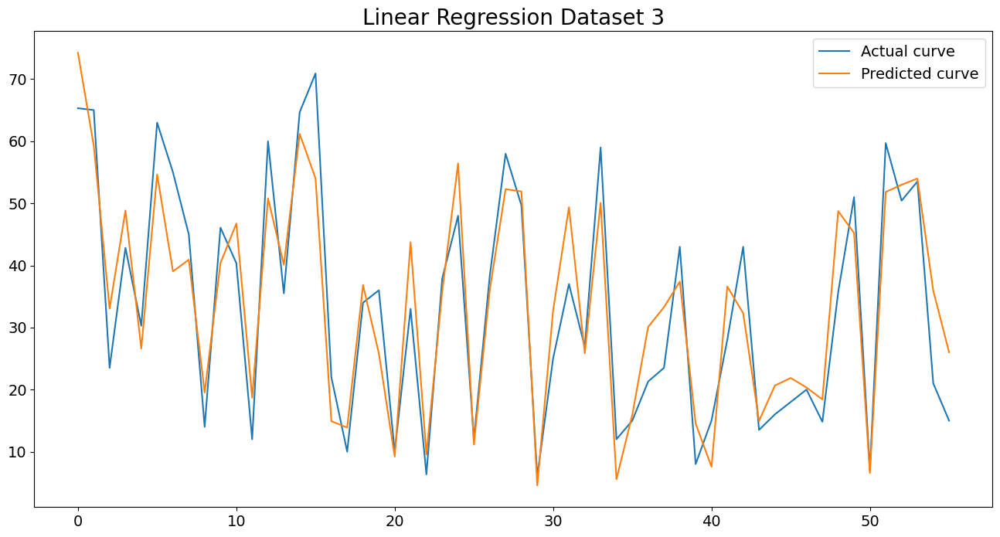

In [ ]:
# Evaluación de los modelos
for ds_name in datasets_test.keys():
    X_test, y_test = datasets_test[ds_name]
    lr_model = models_dics[ds_name]["Linear Regression"]
    y_pred = predictions_dics[ds_name]["Linear Regression"]

    print(f"\nLinear Regression Results in {ds_name}:")
    evaluate_model(ds_name,True, f"Linear Regression", lr_model, X_test, y_test, normalizer='std', nrmse_as_pct=True)

    # Crear gráfica de dispersión
    plt.figure(figsize=(10, 6))
    plt.scatter(x=y_pred, y=y_test, alpha=0.5, color='blue')  # Puntos azules con transparencia
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Línea de referencia (ideal)
    plt.xlabel('Predicted CSMPa', fontsize=18)
    plt.ylabel('Actual CSMPa', fontsize=18)
    plt.title(f'Predicted vs. Actual CSMPa (Linear Regression {ds_name})', fontsize=20)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.show()

    # Comparación de la salida real vs predicha
    plt.figure(figsize=(16,8))
    plt.plot(np.arange(len(X_test)), y_test.values, label='Actual curve')
    plt.plot(np.arange(len(X_test)), y_pred, label='Predicted curve')
    plt.title(f'Linear Regression {ds_name}', fontsize=20)
    plt.legend()
    plt.show()




Linear Regression Results in Dataset 1:
Dataset 1 – Linear Regression: RMSE=9.679, MAE=7.589, MAPE=30.69%, R²=0.618, nRMSE(std)=61.79%


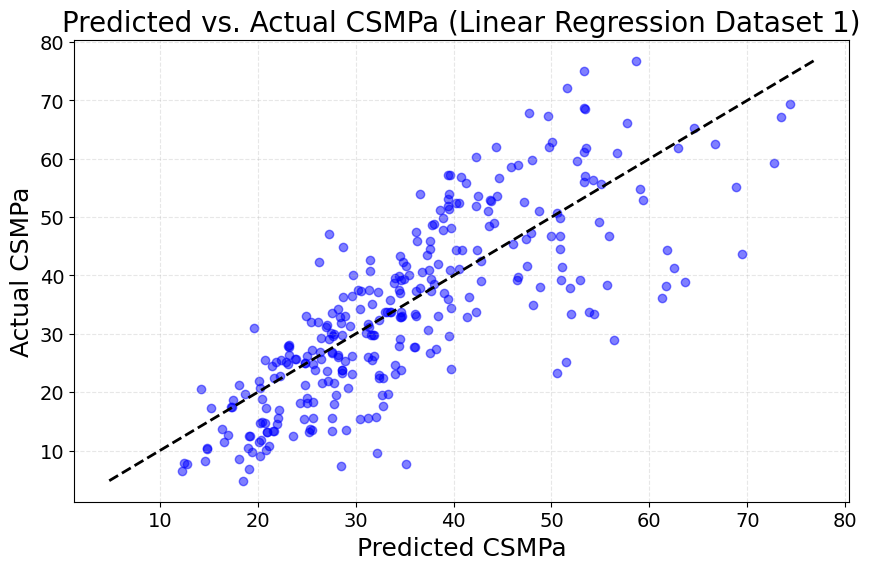

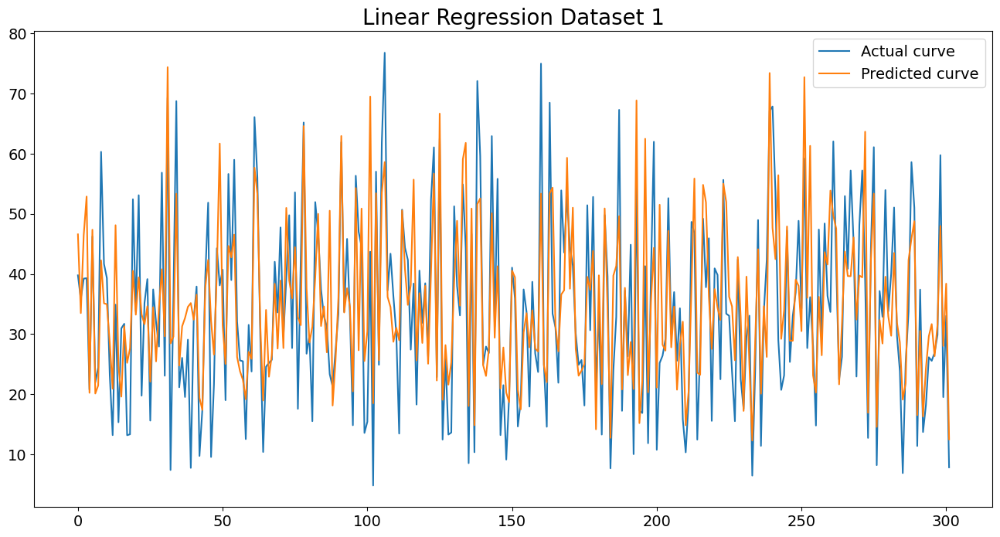


Linear Regression Results in Dataset 2:
Dataset 2 – Linear Regression: RMSE=6.844, MAE=4.340, MAPE=21.88%, R²=0.711, nRMSE(std)=53.75%


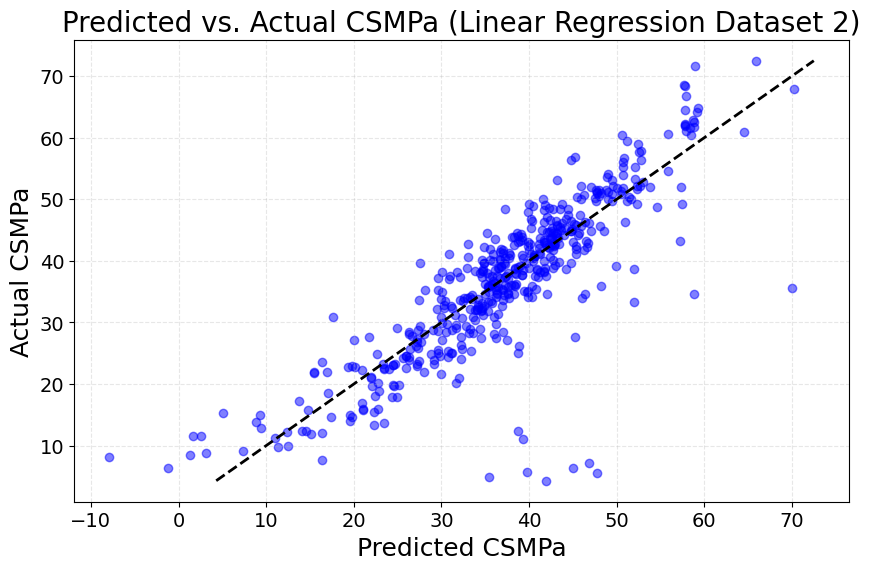

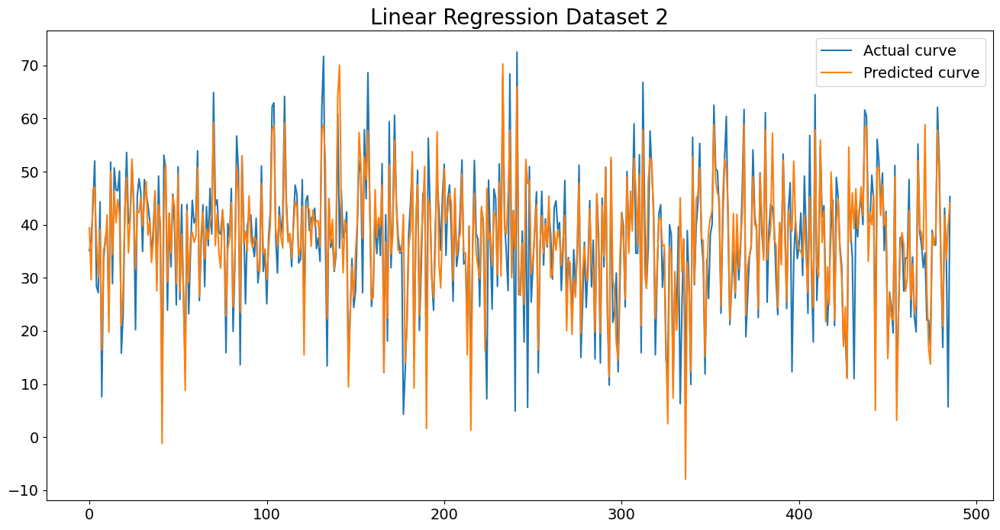


Linear Regression Results in Dataset 3:
Dataset 3 – Linear Regression: RMSE=7.397, MAE=6.203, MAPE=23.67%, R²=0.843, nRMSE(std)=39.64%


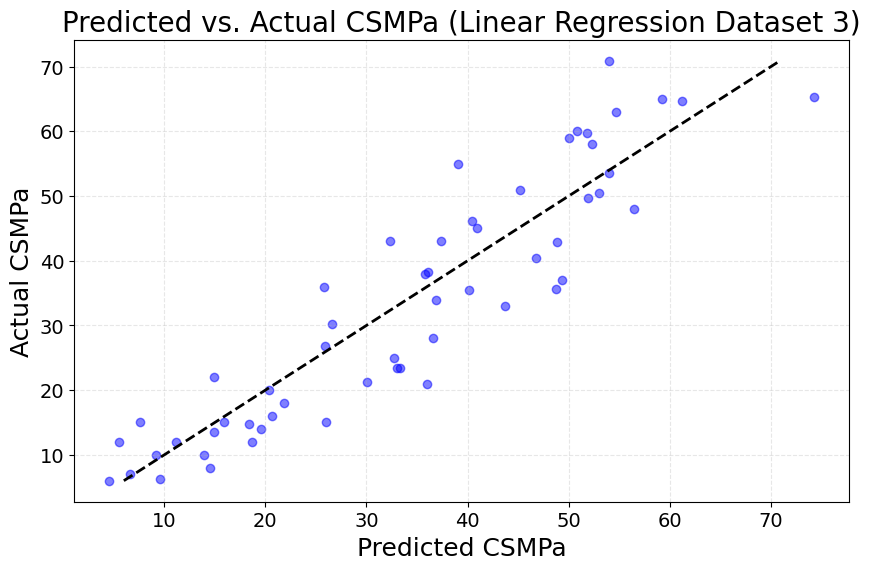

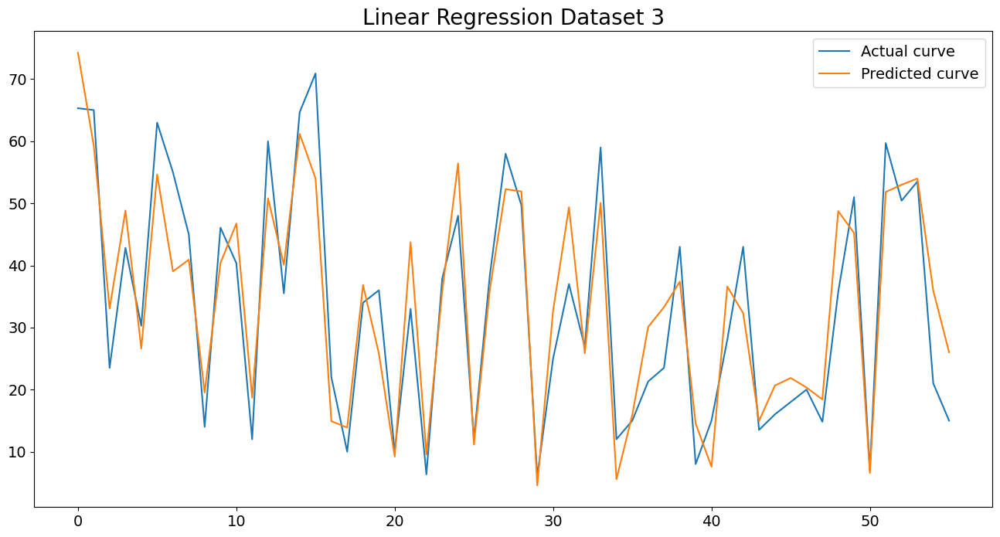

In [ ]:
# Evaluación de los modelos escalados
for ds_name in datasets_test_scaled.keys():
    X_test, y_test = datasets_test_scaled[ds_name]
    lr_model = lr_scaled_temp[f"Linear Regression {ds_name.split()[-1]}"]
    y_pred = predictions_dics[ds_name]["Linear Regression"]

    print(f"\nLinear Regression Results in {ds_name}:")
    evaluate_model(ds_name,False, f"Linear Regression", lr_model, X_test, y_test, normalizer='std', nrmse_as_pct=True)

    # Crear gráfica de dispersión
    plt.figure(figsize=(10, 6))
    plt.scatter(x=y_pred, y=y_test, alpha=0.5, color='blue')  # Puntos azules con transparencia
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Línea de referencia (ideal)
    plt.xlabel('Predicted CSMPa', fontsize=18)
    plt.ylabel('Actual CSMPa', fontsize=18)
    plt.title(f'Predicted vs. Actual CSMPa (Linear Regression {ds_name})', fontsize=20)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.show()

    # Comparación de la salida real vs predicha
    plt.figure(figsize=(16,8))
    plt.plot(np.arange(len(X_test)), y_test.values, label='Actual curve')
    plt.plot(np.arange(len(X_test)), y_pred, label='Predicted curve')
    plt.title(f'Linear Regression {ds_name}', fontsize=20)
    plt.legend()
    plt.show()


### Random Forest

#### Entrenamiento de los modelos

In [ ]:
# Crearemos una grilla de parámetros
param_rf = {
            "n_estimators" : np.arange(50, 500, 25),
            "max_features" : ['sqrt', 'log2'],
            "min_samples_split" : [2, 4],
            "min_samples_leaf" : [1, 2],
            "bootstrap" : [True, False],
            "max_depth" : [None, 10, 20]
            }

In [ ]:
# Modelo base
rf = RandomForestRegressor(random_state=42)

In [ ]:
# --- Entrenamiento automático con loop ---
results_rf = {}
for name, (X_train, y_train) in datasets_train.items():
    rs = RandomizedSearchCV(
      estimator=rf,
      param_distributions=param_rf,
      n_iter=50,                      # Número de combinaciones aleatorias
      cv=kf5,                           # Validación cruzada de 5 folds
      scoring='neg_mean_squared_error', # Métrica a optimizar (MSE negativo)
      random_state=42,
      n_jobs=-1
    )
    model = rs.fit(X_train, y_train)
    results_rf[name] = model


In [ ]:
# Ejecutar la búsqueda
rf_m1 = results_rf["Dataset 1"]
rf_m2 = results_rf["Dataset 2"]
rf_m3 = results_rf["Dataset 3"]

In [ ]:
# Extraer el mejor modelo ya entrenado
mejor_rf1 = rf_m1.best_estimator_
mejor_rf2 = rf_m2.best_estimator_
mejor_rf3 = rf_m3.best_estimator_
print("Mejor Modelo Dataset 1:", mejor_rf1)
print("Mejor Modelo Dataset 2:", mejor_rf2)
print("Mejor Modelo Dataset 3:", mejor_rf3)

Mejor Modelo Dataset 1: RandomForestRegressor(bootstrap=False, max_depth=20, max_features='log2',
                      min_samples_split=4, n_estimators=np.int64(250),
                      random_state=42)
Mejor Modelo Dataset 2: RandomForestRegressor(bootstrap=False, max_depth=10, max_features='sqrt',
                      n_estimators=np.int64(175), random_state=42)
Mejor Modelo Dataset 3: RandomForestRegressor(bootstrap=False, max_depth=10, max_features='log2',
                      n_estimators=np.int64(325), random_state=42)


In [ ]:
#Guardar el mejor modelo un un diccionario que se utilizara para los resultados
models_dic_db1["Random Forest"] = mejor_rf1
models_dic_db2["Random Forest"] = mejor_rf2
models_dic_db3["Random Forest"] = mejor_rf3

In [ ]:
# Obtener predicciones del modelo entrenado
pred_rf1 = mejor_rf1.predict(X_test1)
pred_rf2 = mejor_rf2.predict(X_test2)
pred_rf3 = mejor_rf3.predict(X_test3)

In [ ]:
#Se alamcena en el diccionario de predicciones
predictions_db1["Random Forest"] = pred_rf1
predictions_db2["Random Forest"] = pred_rf2
predictions_db3["Random Forest"] = pred_rf3

#### Evaluación de los Modelos


Random Forest Results in Dataset 1:
Dataset 1 – Random Forest: RMSE=4.361, MAE=3.179, MAPE=11.83%, R²=0.922, nRMSE(std)=27.84%


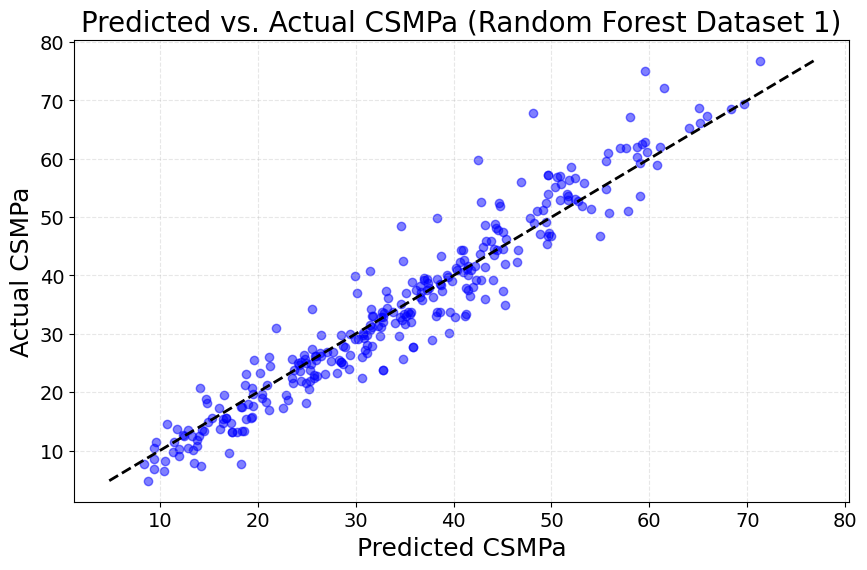

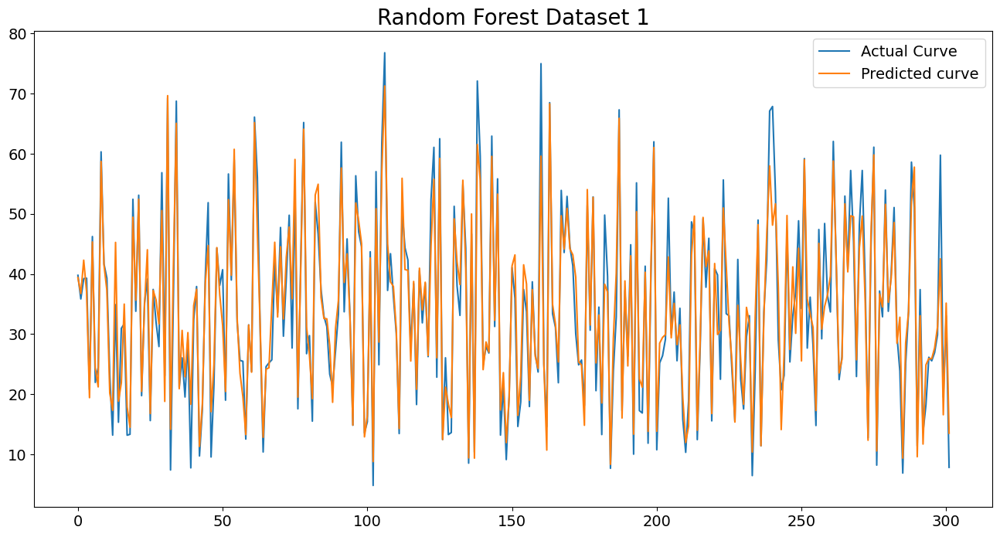


Random Forest Results in Dataset 2:
Dataset 2 – Random Forest: RMSE=4.341, MAE=3.052, MAPE=12.55%, R²=0.884, nRMSE(std)=34.09%


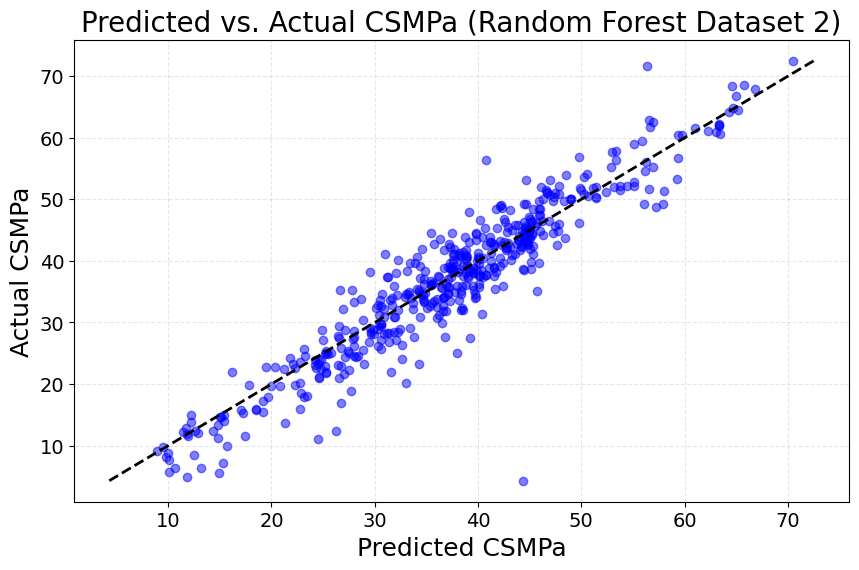

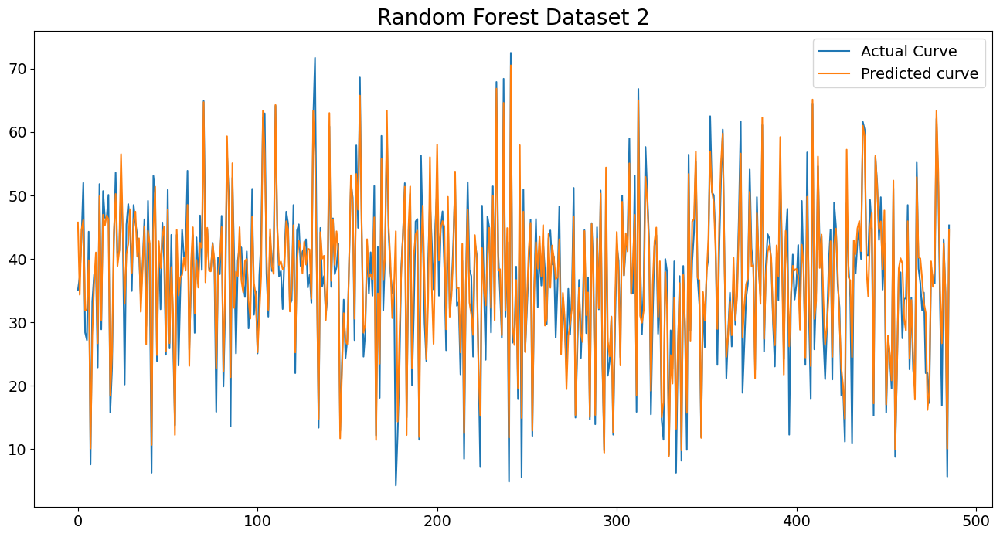


Random Forest Results in Dataset 3:
Dataset 3 – Random Forest: RMSE=6.567, MAE=5.406, MAPE=24.10%, R²=0.876, nRMSE(std)=35.19%


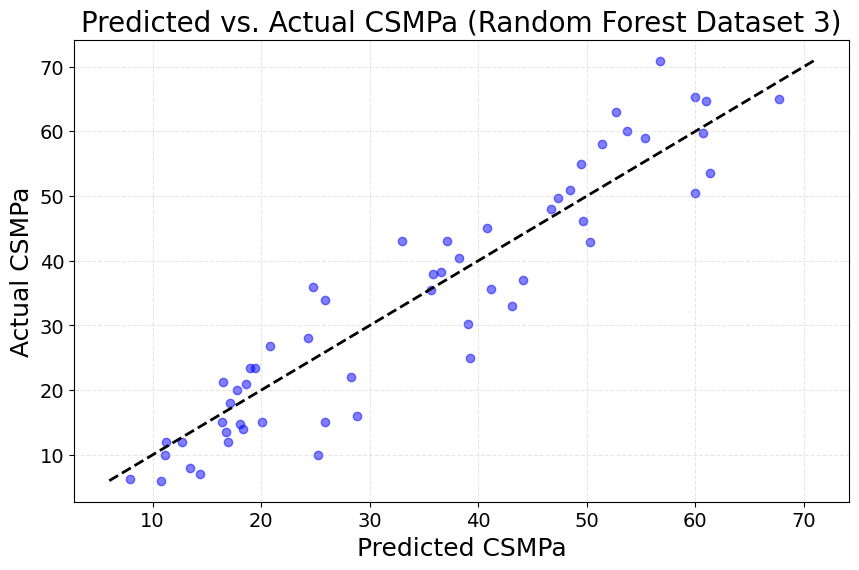

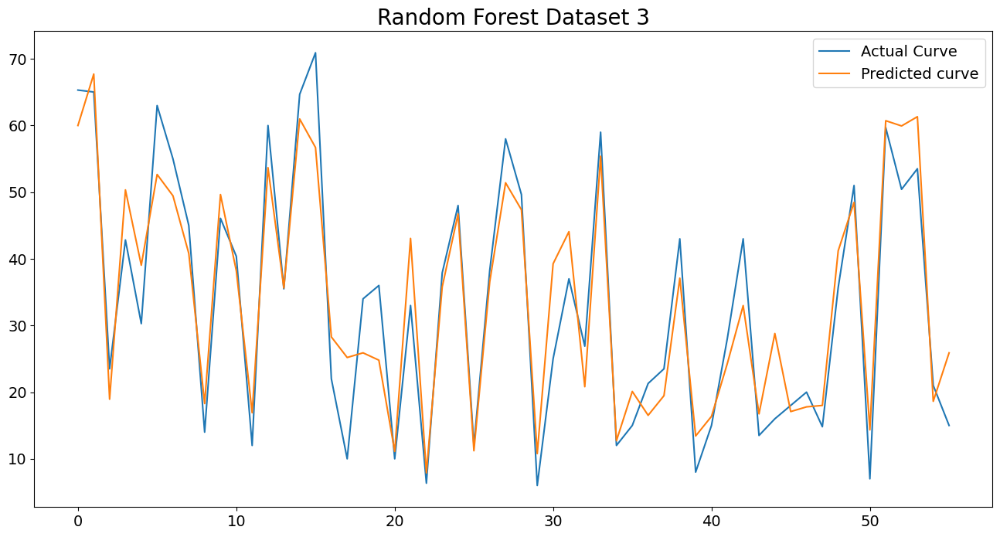

In [ ]:
# Evaluación de los modelos
for ds_name in datasets_test.keys():
    X_test, y_test = datasets_test[ds_name]
    rf_model = models_dics[ds_name]["Random Forest"]
    y_pred = predictions_dics[ds_name]["Random Forest"]

    print(f"\nRandom Forest Results in {ds_name}:")
    evaluate_model(ds_name,True, f"Random Forest", rf_model, X_test, y_test, normalizer='std', nrmse_as_pct=True)

    # Crear gráfica de dispersión
    plt.figure(figsize=(10, 6))
    plt.scatter(x=y_pred, y=y_test, alpha=0.5, color='blue')  # Puntos azules con transparencia
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Línea de referencia (ideal)
    plt.xlabel('Predicted CSMPa', fontsize=18)
    plt.ylabel('Actual CSMPa', fontsize=18)
    plt.title(f'Predicted vs. Actual CSMPa (Random Forest {ds_name})', fontsize=20)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.show()

    # Comparación de la salida real vs predicha
    plt.figure(figsize=(16,8))
    plt.plot(np.arange(len(X_test)), y_test.values, label='Actual Curve')
    plt.plot(np.arange(len(X_test)), y_pred, label='Predicted curve')
    plt.title(f'Random Forest {ds_name}', fontsize=20)
    plt.legend()
    plt.show()

### SVR (Soporte Vectorial para Regresión)

#### Entrenamiento de los modelos

In [ ]:
# SVR (con Pipeline)
params_svr = {
    'model__kernel': ['rbf'],                 # 'rbf' suele rendir mejor en tabulares
    'model__C': [0.1, 1, 3, 10, 30, 100, 300, 1000],
    'model__gamma': ['scale', 'auto', 1, 0.3, 0.1, 0.03, 0.01],
    'model__epsilon': [0.01, 0.05, 0.1, 0.2, 0.5]
}


In [ ]:
svr_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('model', SVR())
])

In [ ]:
results_svr = {}
for name, (X_train, y_train) in datasets_train.items():
    rs = RandomizedSearchCV(
      estimator=svr_pipe,
      param_distributions=params_svr,
      n_iter=50,
      cv=kf5,
      scoring='neg_mean_squared_error',
      random_state=42,
      n_jobs=-1
    )
    model = rs.fit(X_train, y_train)
    results_svr[name] = model

In [ ]:
# Ejecutar la búsqueda
svr_m1 = results_svr["Dataset 1"]
svr_m2 = results_svr["Dataset 2"]
svr_m3 = results_svr["Dataset 3"]

In [ ]:
# Extraer el mejor modelo ya entrenado
mejor_svr1 = svr_m1.best_estimator_
mejor_svr2 = svr_m2.best_estimator_
mejor_svr3 = svr_m3.best_estimator_
print("Mejor Modelo Dataset 1:", mejor_svr1)
print("Mejor Modelo Dataset 2:", mejor_svr2)
print("Mejor Modelo Dataset 3:", mejor_svr3)

Mejor Modelo Dataset 1: Pipeline(steps=[('scaler', StandardScaler()),
                ('model', SVR(C=1000, gamma=0.03))])
Mejor Modelo Dataset 2: Pipeline(steps=[('scaler', StandardScaler()),
                ('model', SVR(C=100, epsilon=0.01, gamma='auto'))])
Mejor Modelo Dataset 3: Pipeline(steps=[('scaler', StandardScaler()),
                ('model', SVR(C=300, epsilon=0.05, gamma=0.03))])


In [ ]:
#Guardar el mejor modelo un un diccionario que se utilizara para los resultados
models_dic_db1["SVR"] = mejor_svr1
models_dic_db2["SVR"] = mejor_svr2
models_dic_db3["SVR"] = mejor_svr3

In [ ]:
# Obtener predicciones del modelo entrenado
pred_svr1 = mejor_svr1.predict(X_test1)
pred_svr2 = mejor_svr2.predict(X_test2)
pred_svr3 = mejor_svr3.predict(X_test3)

In [ ]:
#Se alamcena en el diccionario de predicciones
predictions_db1["SVR"] = pred_svr1
predictions_db2["SVR"] = pred_svr2
predictions_db3["SVR"] = pred_svr3

#### Evaluación de los modelos


SVR Results in Dataset 1:
Dataset 1 – SVR: RMSE=5.514, MAE=4.000, MAPE=13.79%, R²=0.876, nRMSE(std)=35.20%


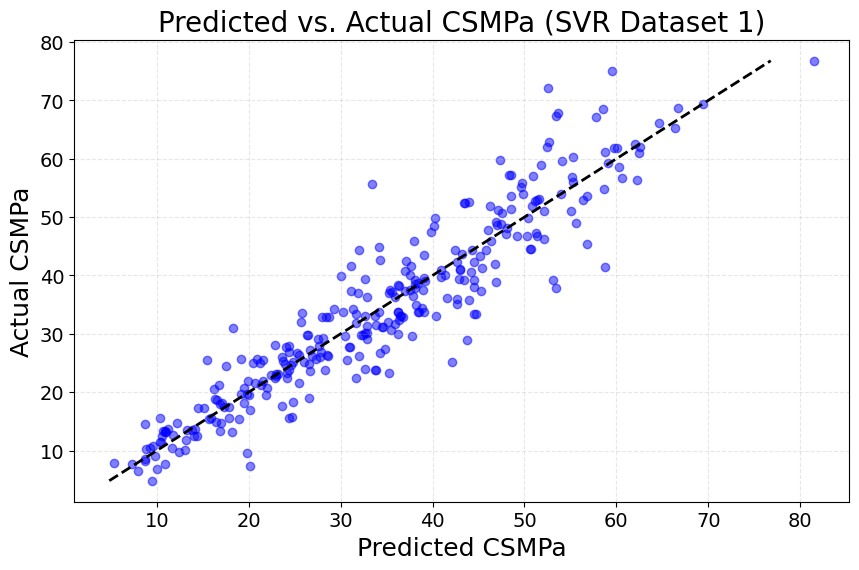

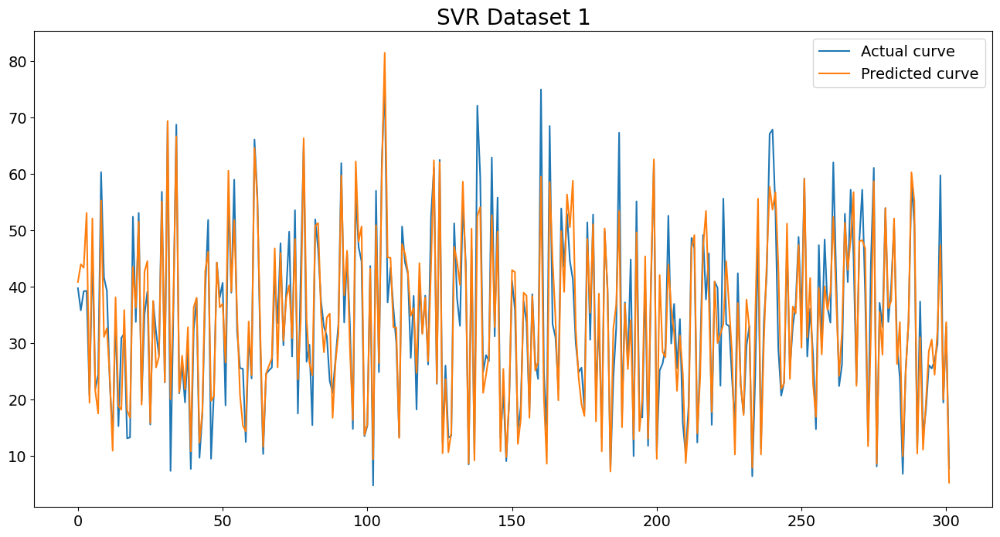


SVR Results in Dataset 2:
Dataset 2 – SVR: RMSE=5.709, MAE=3.327, MAPE=16.92%, R²=0.799, nRMSE(std)=44.84%


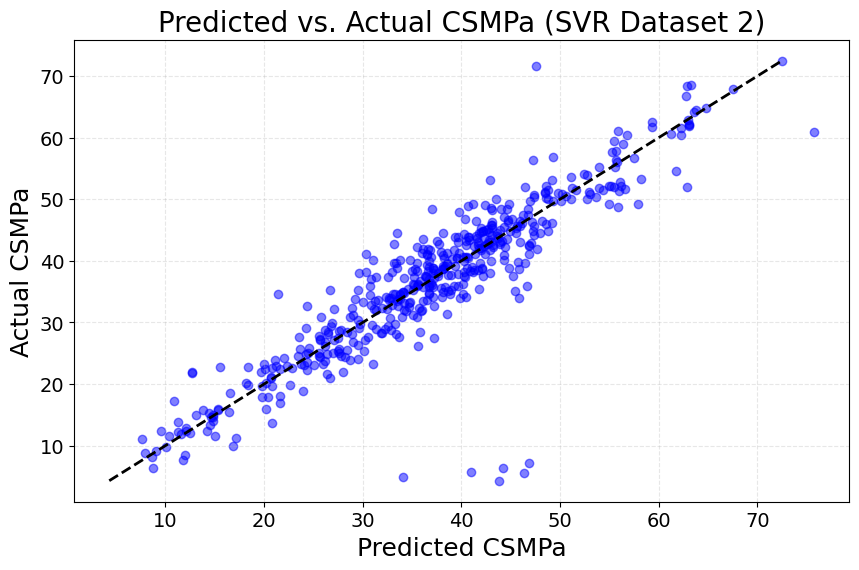

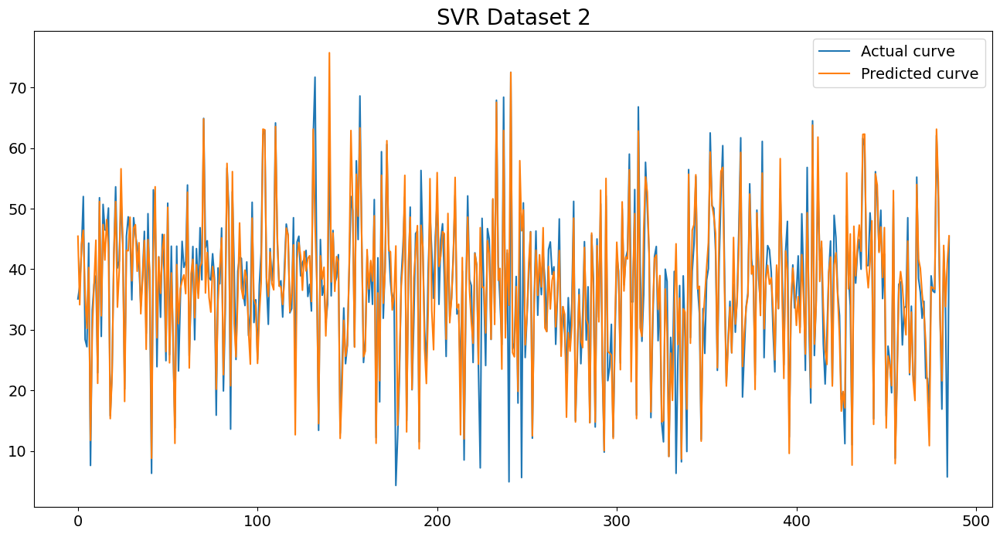


SVR Results in Dataset 3:
Dataset 3 – SVR: RMSE=5.454, MAE=3.935, MAPE=16.48%, R²=0.915, nRMSE(std)=29.22%


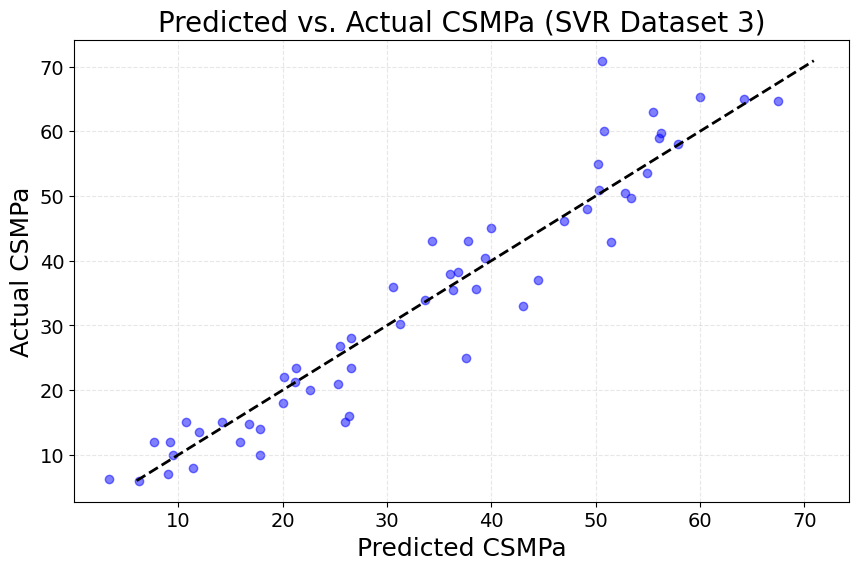

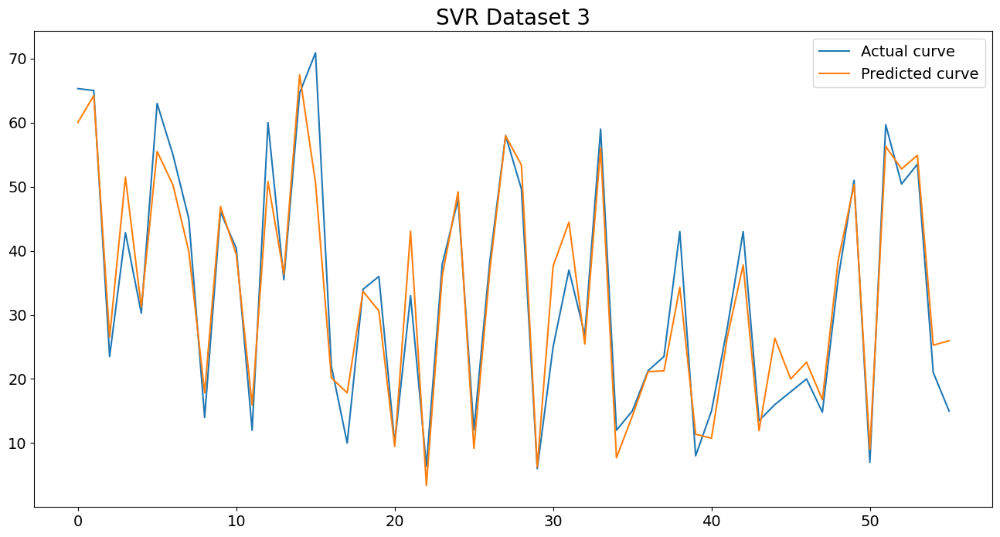

In [ ]:
# Evaluación de los modelos
for ds_name in datasets_test.keys():
    X_test, y_test = datasets_test[ds_name]
    svr_model = models_dics[ds_name]["SVR"]
    y_pred = predictions_dics[ds_name]["SVR"]

    print(f"\nSVR Results in {ds_name}:")
    evaluate_model(ds_name,True, f"SVR", svr_model, X_test, y_test, normalizer='std', nrmse_as_pct=True)

    # Crear gráfica de dispersión
    plt.figure(figsize=(10, 6))
    plt.scatter(x=y_pred, y=y_test, alpha=0.5, color='blue')  # Puntos azules con transparencia
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Línea de referencia (ideal)
    plt.xlabel('Predicted CSMPa', fontsize=18)
    plt.ylabel('Actual CSMPa', fontsize=18)
    plt.title(f'Predicted vs. Actual CSMPa (SVR {ds_name})', fontsize=20)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.show()

    # Comparación de la salida real vs predicha
    plt.figure(figsize=(16,8))
    plt.plot(np.arange(len(X_test)), y_test.values, label='Actual curve')
    plt.plot(np.arange(len(X_test)), y_pred, label='Predicted curve')
    plt.title(f'SVR {ds_name}', fontsize=20)
    plt.legend()
    plt.show()

### MLP (Perceptrón Multicapa)

#### Entrenamiento de los modelos

In [ ]:
# MLP (con Pipeline)
params_mlp = {
    'model__hidden_layer_sizes': [(64,), (128,), (64,32), (128,64)],
    'model__activation': ['relu', 'tanh'],
    'model__alpha': np.logspace(-5, -2, 4),         # [1e-5, 1e-4, 1e-3, 1e-2]
    'model__learning_rate': ['adaptive'],
    'model__max_iter': [1000, 2000]
}

In [ ]:
mlp_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('model', MLPRegressor(random_state=42, max_iter=1000))
])

In [ ]:
results_mlp = {}
for name, (X_train, y_train) in datasets_train.items():
    rs = RandomizedSearchCV(
      estimator=mlp_pipe,
      param_distributions=params_mlp,
      n_iter=30,
      cv=kf3,  # Redes neuronales son costosas, menos folds
      scoring='neg_mean_squared_error',
      random_state=42,
      n_jobs=-1
    )
    model = rs.fit(X_train, y_train)
    results_mlp[name] = model

/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
# Ejecutar la búsqueda
mlp_m1 = results_mlp["Dataset 1"]
mlp_m2 = results_mlp["Dataset 2"]
mlp_m3 = results_mlp["Dataset 3"]

In [ ]:
# Extraer el mejor modelo ya entrenado
mejor_mlp1 = mlp_m1.best_estimator_
mejor_mlp2 = mlp_m2.best_estimator_
mejor_mlp3 = mlp_m3.best_estimator_
print("Mejor Modelo Dataset 1:", mejor_mlp1)
print("Mejor Modelo Dataset 2:", mejor_mlp2)
print("Mejor Modelo Dataset 3:", mejor_mlp3)

Mejor Modelo Dataset 1: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 MLPRegressor(activation='tanh', alpha=np.float64(0.0001),
                              hidden_layer_sizes=(128, 64),
                              learning_rate='adaptive', max_iter=2000,
                              random_state=42))])
Mejor Modelo Dataset 2: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 MLPRegressor(activation='tanh', alpha=np.float64(0.0001),
                              hidden_layer_sizes=(128, 64),
                              learning_rate='adaptive', max_iter=2000,
                              random_state=42))])
Mejor Modelo Dataset 3: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 MLPRegressor(activation='tanh', alpha=np.float64(0.0001),
                              hidden_layer_sizes=(128, 64),
                              learning_rate='adaptive', max_iter=

In [ ]:
#Guardar el mejor modelo un un diccionario que se utilizara para los resultados
models_dic_db1["MLP"] = mejor_mlp1
models_dic_db2["MLP"] = mejor_mlp2
models_dic_db3["MLP"] = mejor_mlp3

In [ ]:
# Obtener predicciones del modelo
pred_mlp1 = mejor_mlp1.predict(X_test1)
pred_mlp2 = mejor_mlp2.predict(X_test2)
pred_mlp3 = mejor_mlp3.predict(X_test3)

In [ ]:
#Se alamcena en el diccionario de predicciones
predictions_db1["MLP"] = pred_mlp1
predictions_db2["MLP"] = pred_mlp2
predictions_db3["MLP"] = pred_mlp3

#### Evaluación de los modelos


MLP Results in Dataset 1:
Dataset 1 – MLP: RMSE=4.232, MAE=2.968, MAPE=9.67%, R²=0.927, nRMSE(std)=27.02%


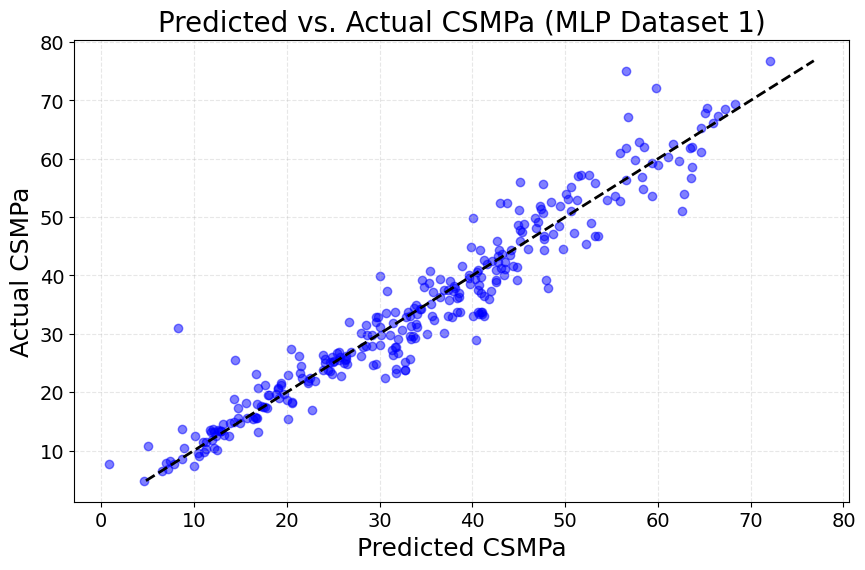

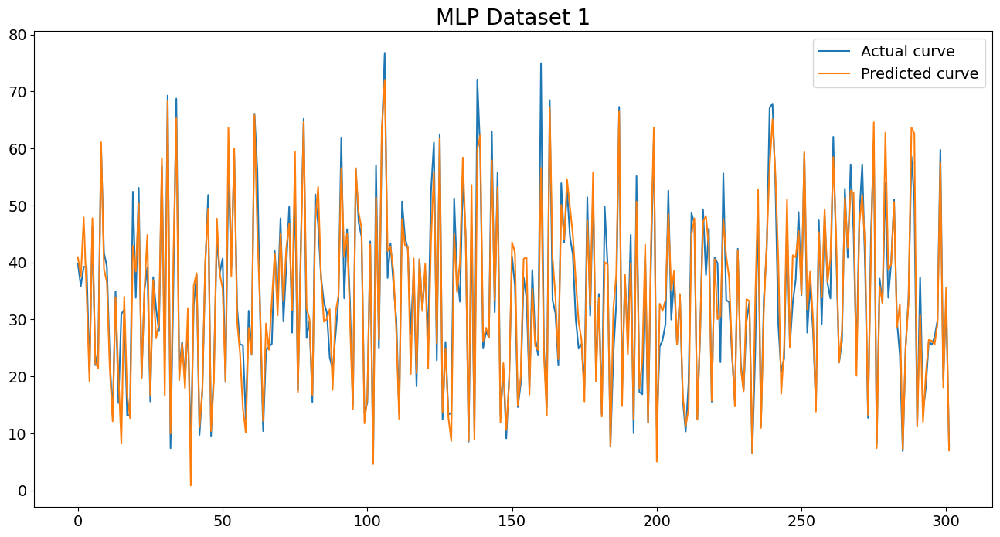


MLP Results in Dataset 2:
Dataset 2 – MLP: RMSE=4.853, MAE=3.334, MAPE=13.35%, R²=0.855, nRMSE(std)=38.11%


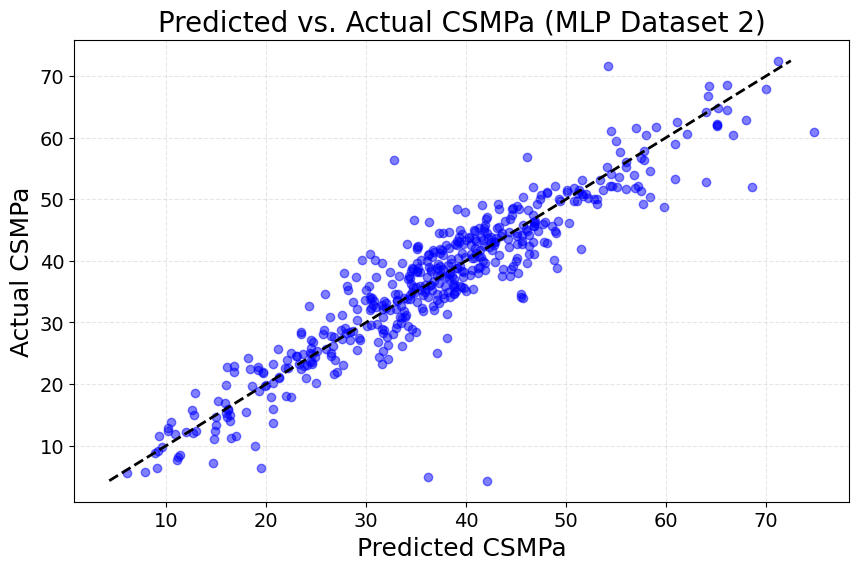

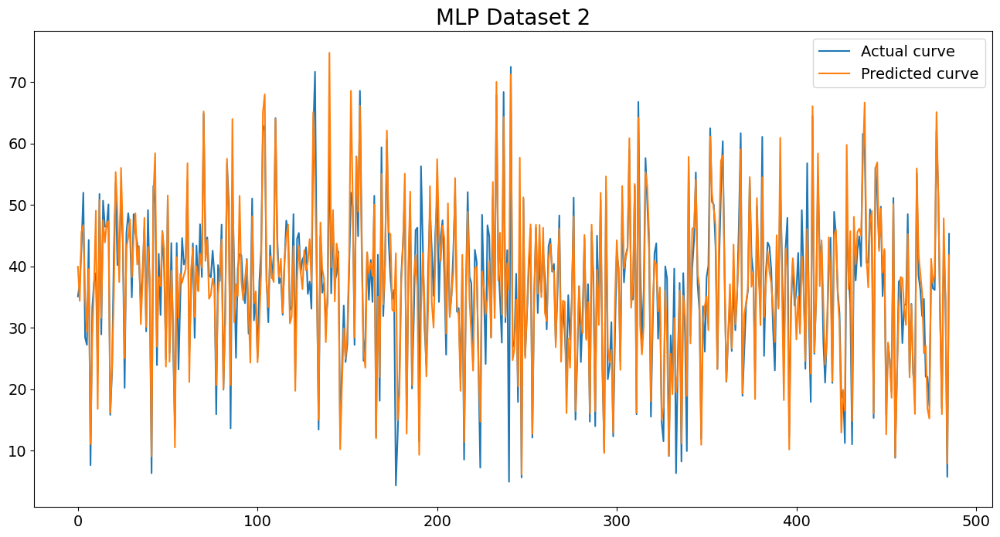


MLP Results in Dataset 3:
Dataset 3 – MLP: RMSE=5.065, MAE=3.929, MAPE=16.56%, R²=0.926, nRMSE(std)=27.14%


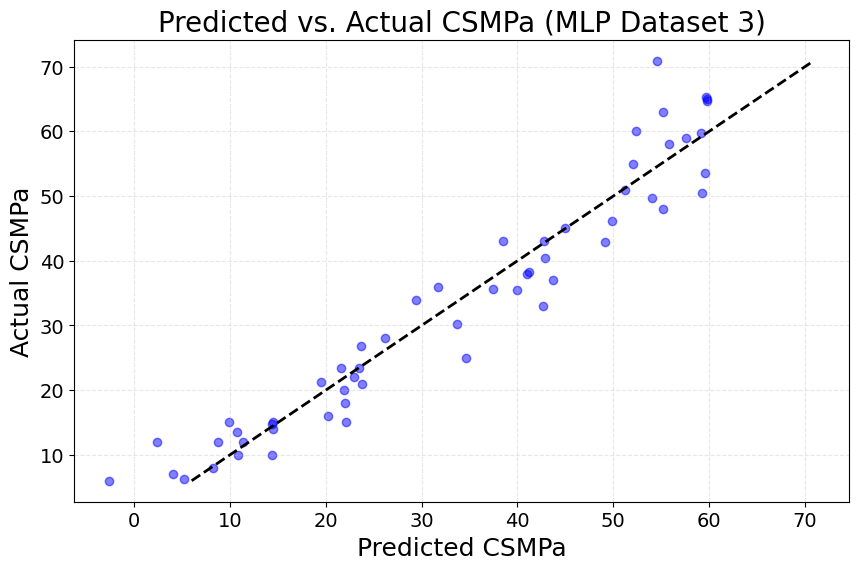

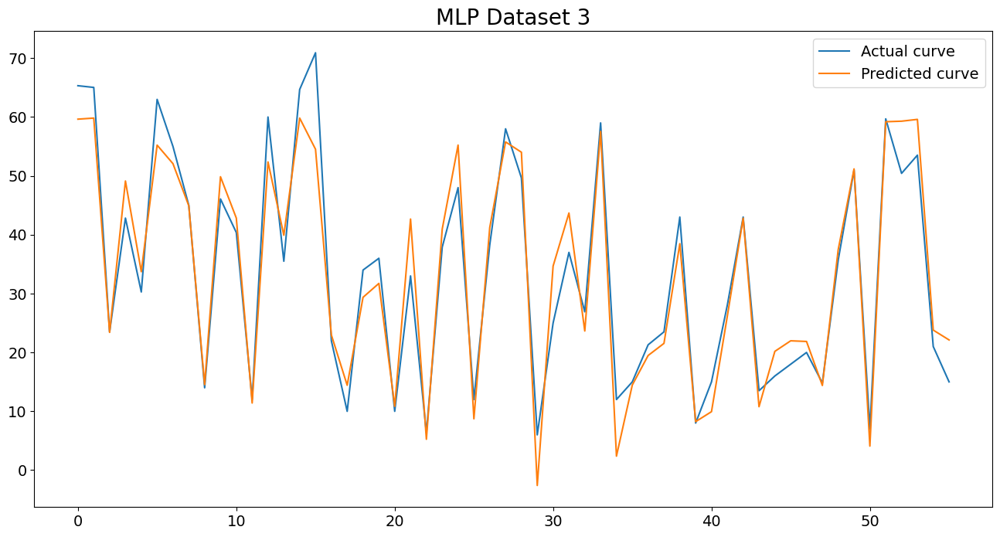

In [ ]:
# Evaluación de los modelos
for ds_name in datasets_test.keys():
    X_test, y_test = datasets_test[ds_name]
    mlp_model = models_dics[ds_name]["MLP"]
    y_pred = predictions_dics[ds_name]["MLP"]

    print(f"\nMLP Results in {ds_name}:")
    evaluate_model(ds_name,True, f"MLP", mlp_model, X_test, y_test, normalizer='std', nrmse_as_pct=True)

    # Crear gráfica de dispersión
    plt.figure(figsize=(10, 6))
    plt.scatter(x=y_pred, y=y_test, alpha=0.5, color='blue')  # Puntos azules con transparencia
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Línea de referencia (ideal)
    plt.xlabel('Predicted CSMPa', fontsize=18)
    plt.ylabel('Actual CSMPa', fontsize=18)
    plt.title(f'Predicted vs. Actual CSMPa (MLP {ds_name})', fontsize=20)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.show()

    # Comparación de la salida real vs predicha
    plt.figure(figsize=(16,8))
    plt.plot(np.arange(len(X_test)), y_test.values, label='Actual curve')
    plt.plot(np.arange(len(X_test)), y_pred, label='Predicted curve')
    plt.title(f'MLP {ds_name}', fontsize=20)
    plt.legend()
    plt.show()

### KNeighbors (KNN)

#### Entrenamiento de los modelos

In [ ]:
# KNN (con Pipeline). Si vas a usar 'p', deja 'metric' en 'minkowski' (default).
params_knn = {
    'model__n_neighbors': list(range(3, 31, 2)),   # 3,5,7,...,29
    'model__weights': ['uniform', 'distance'],
    'model__p': [1, 2],              # 1: Manhattan, 2: Euclidiana (con minkowski)
}

In [ ]:
knn_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('model', KNeighborsRegressor())
])

In [ ]:
results_knn = {}
for name, (X_train, y_train) in datasets_train.items():
    rs = RandomizedSearchCV(
      estimator=knn_pipe,
      param_distributions=params_knn,
      n_iter=50,
      cv=kf5,
      scoring='neg_mean_squared_error',
      random_state=42,
      n_jobs=-1
    )
    model = rs.fit(X_train, y_train)
    results_knn[name] = model

In [ ]:
# Ejecutar la búsqueda
knn_m1 = results_knn["Dataset 1"]
knn_m2 = results_knn["Dataset 2"]
knn_m3 = results_knn["Dataset 3"]

In [ ]:
# Extraer el mejor modelo ya entrenado
mejor_knn1 = knn_m1.best_estimator_
mejor_knn2 = knn_m2.best_estimator_
mejor_knn3 = knn_m3.best_estimator_
print("Mejor Modelo Dataset 1:", mejor_knn1)
print("Mejor Modelo Dataset 2:", mejor_knn2)
print("Mejor Modelo Dataset 3:", mejor_knn3)

Mejor Modelo Dataset 1: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 KNeighborsRegressor(n_neighbors=7, weights='distance'))])
Mejor Modelo Dataset 2: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 KNeighborsRegressor(n_neighbors=7, p=1, weights='distance'))])
Mejor Modelo Dataset 3: Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 KNeighborsRegressor(n_neighbors=11, p=1, weights='distance'))])


In [ ]:
#Guardar el mejor modelo un un diccionario que se utilizara para los resultados
models_dic_db1["KNN"] = mejor_knn1
models_dic_db2["KNN"] = mejor_knn2
models_dic_db3["KNN"] = mejor_knn3

In [ ]:
# Obtener predicciones del modelo
pred_knn1 = mejor_knn1.predict(X_test1)
pred_knn2 = mejor_knn2.predict(X_test2)
pred_knn3 = mejor_knn3.predict(X_test3)

In [ ]:
#Se alamcena en el diccionario de predicciones
predictions_db1["KNN"] = pred_knn1
predictions_db2["KNN"] = pred_knn2
predictions_db3["KNN"] = pred_knn3

#### Evaluación de los modelos


KNN Results in Dataset 1:
Dataset 1 – KNN: RMSE=7.662, MAE=5.630, MAPE=21.99%, R²=0.761, nRMSE(std)=48.91%


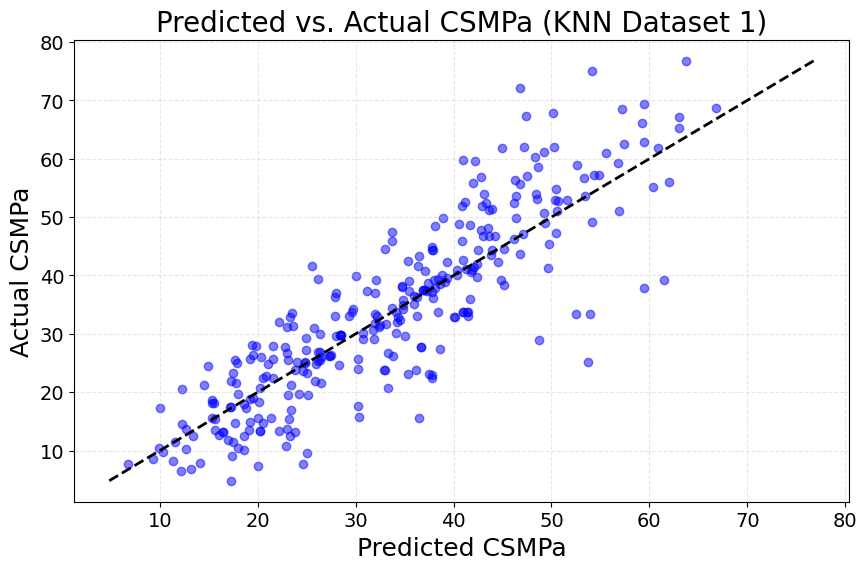

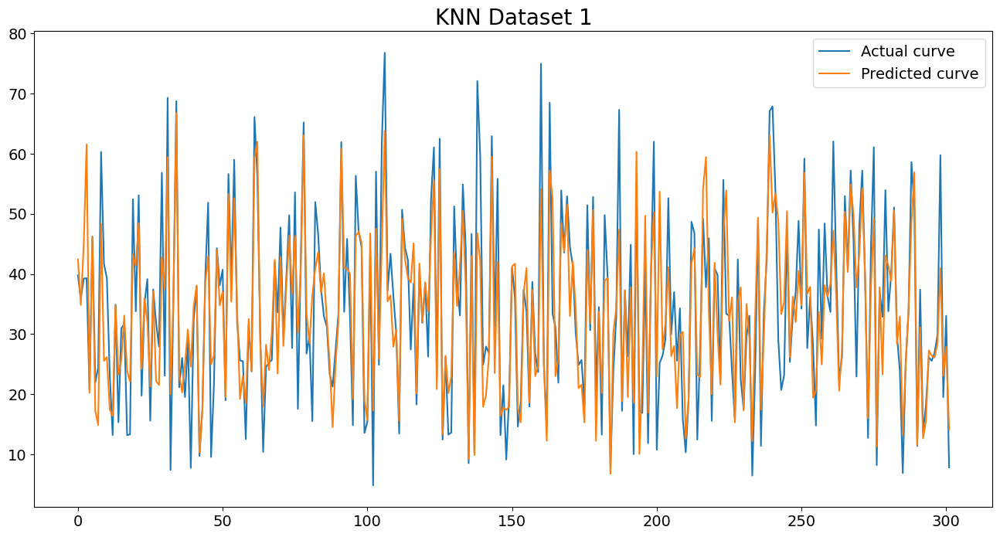


KNN Results in Dataset 2:
Dataset 2 – KNN: RMSE=5.378, MAE=3.410, MAPE=16.03%, R²=0.822, nRMSE(std)=42.23%


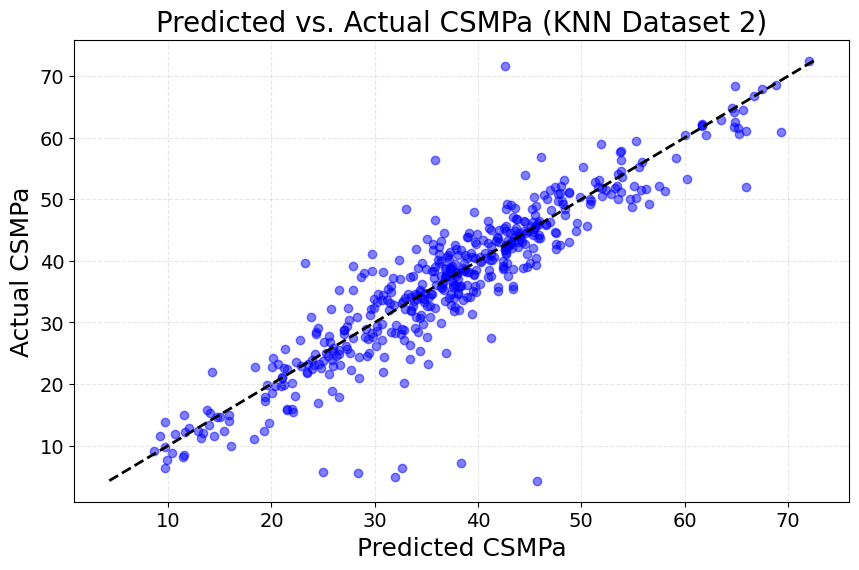

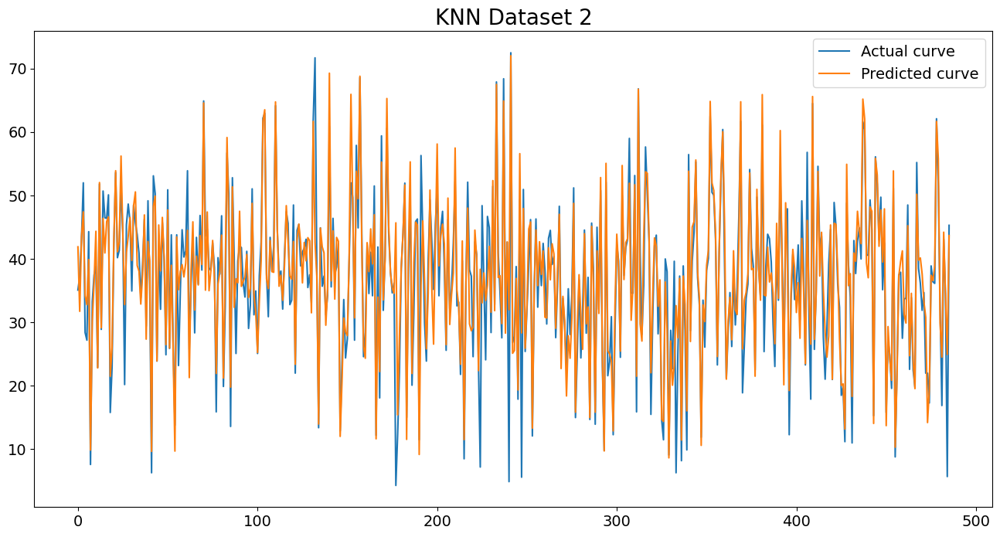


KNN Results in Dataset 3:
Dataset 3 – KNN: RMSE=8.388, MAE=6.522, MAPE=27.50%, R²=0.798, nRMSE(std)=44.94%


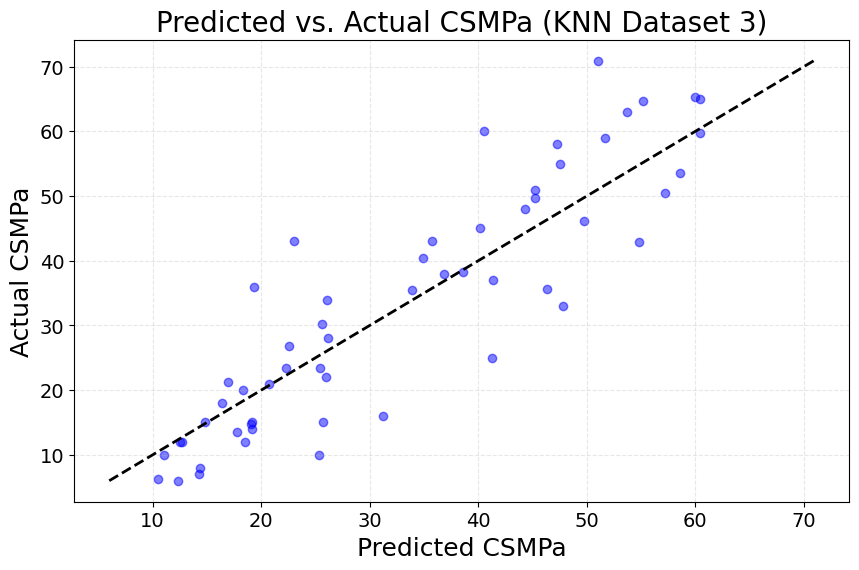

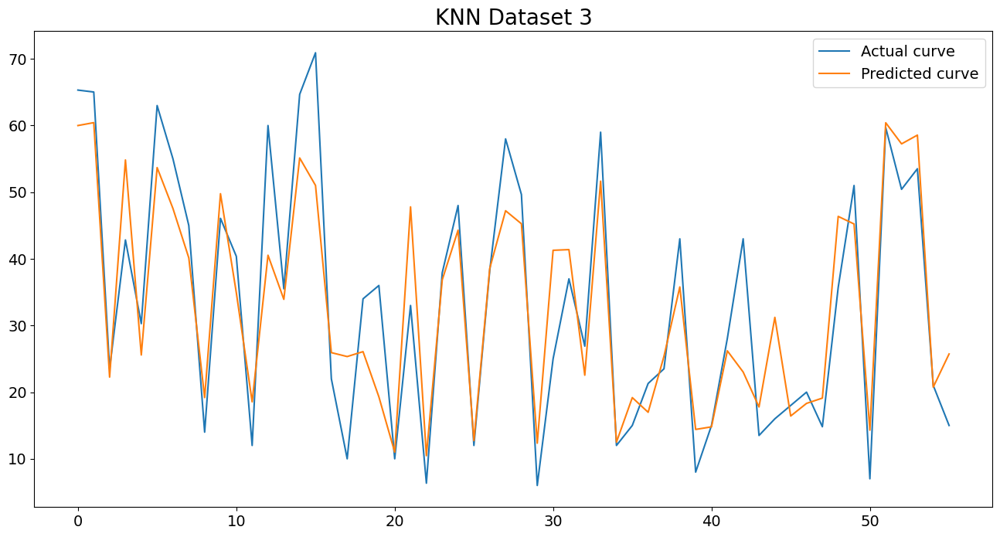

In [ ]:
# Evaluación de los modelos
for ds_name in datasets_test.keys():
    X_test, y_test = datasets_test[ds_name]
    knn_model = models_dics[ds_name]["KNN"]
    y_pred = predictions_dics[ds_name]["KNN"]

    print(f"\nKNN Results in {ds_name}:")
    evaluate_model(ds_name,True, f"KNN", knn_model, X_test, y_test, normalizer='std', nrmse_as_pct=True)

    # Crear gráfica de dispersión
    plt.figure(figsize=(10, 6))
    plt.scatter(x=y_pred, y=y_test, alpha=0.5, color='blue')  # Puntos azules con transparencia
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Línea de referencia (ideal)
    plt.xlabel('Predicted CSMPa', fontsize=18)
    plt.ylabel('Actual CSMPa', fontsize=18)
    plt.title(f'Predicted vs. Actual CSMPa (KNN {ds_name})', fontsize=20)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.show()

    # Comparación de la salida real vs predicha
    plt.figure(figsize=(16,8))
    plt.plot(np.arange(len(X_test)), y_test.values, label='Actual curve')
    plt.plot(np.arange(len(X_test)), y_pred, label='Predicted curve')
    plt.title(f'KNN {ds_name}', fontsize=20)
    plt.legend()
    plt.show()

### CatBoost

#### Entrenamiento de los modelos

In [ ]:
params_cb = {
    'iterations': [100, 200, 500],
    'depth': [4, 6, 8],
    'learning_rate': [0.01, 0.05, 0.1],
    'l2_leaf_reg': [1, 3, 5],
    'border_count': [32, 64, 128]
}

In [ ]:
# Modelo base (silent=True para evitar logs)
cb = CatBoostRegressor(random_state=42, verbose=False)

In [ ]:
# --- Entrenamiento automático con loop ---
results_cb = {}
for name, (X_train, y_train) in datasets_train.items():
    rs = RandomizedSearchCV(
      estimator=cb,
      param_distributions=params_cb,
      n_iter=50,
      cv=kf5,
      scoring='neg_mean_squared_error',
      random_state=42,
      n_jobs=-1
    )
    model = rs.fit(X_train, y_train)
    results_cb[name] = model

In [ ]:
# Ejecutar la búsqueda
cb_m1 = results_cb["Dataset 1"]
cb_m2 = results_cb["Dataset 2"]
cb_m3 = results_cb["Dataset 3"]

In [ ]:
# Extraer el mejor modelo ya entrenado
mejor_cb1 = cb_m1.best_estimator_
mejor_cb2 = cb_m2.best_estimator_
mejor_cb3 = cb_m3.best_estimator_
print("Mejor Modelo Dataset 1:", mejor_cb1)
print("Mejor Modelo Dataset 2:", mejor_cb2)
print("Mejor Modelo Dataset 3:", mejor_cb3)

Mejor Modelo Dataset 1: <catboost.core.CatBoostRegressor object at 0x7e65f7dcb0e0>
Mejor Modelo Dataset 2: <catboost.core.CatBoostRegressor object at 0x7e65f8da65d0>
Mejor Modelo Dataset 3: <catboost.core.CatBoostRegressor object at 0x7e65f855be00>


In [ ]:
#Guardar el mejor modelo un un diccionario que se utilizara para los resultados
models_dic_db1["CatBoost"] = mejor_cb1
models_dic_db2["CatBoost"] = mejor_cb2
models_dic_db3["CatBoost"] = mejor_cb3

In [ ]:
# Obtener predicciones del modelo entrenado
pred_cb1 = mejor_cb1.predict(X_test1)
pred_cb2 = mejor_cb2.predict(X_test2)
pred_cb3 = mejor_cb3.predict(X_test3)

In [ ]:
#Se alamcena en el diccionario de predicciones
predictions_db1["CatBoost"] = pred_cb1
predictions_db2["CatBoost"] = pred_cb2
predictions_db3["CatBoost"] = pred_cb3

#### Evaluación de los modelos


CatBoost Results in Dataset 1:
Dataset 1 – CatBoost: RMSE=3.710, MAE=2.743, MAPE=9.85%, R²=0.944, nRMSE(std)=23.69%


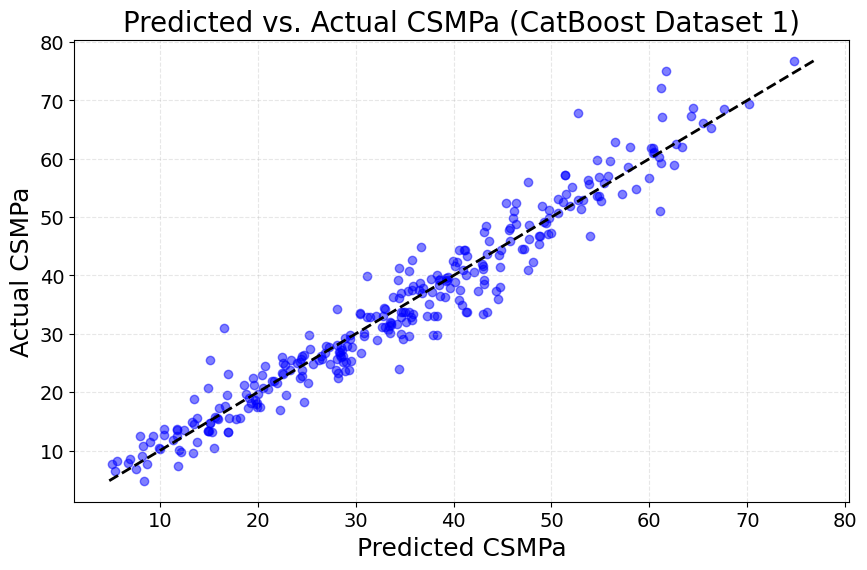

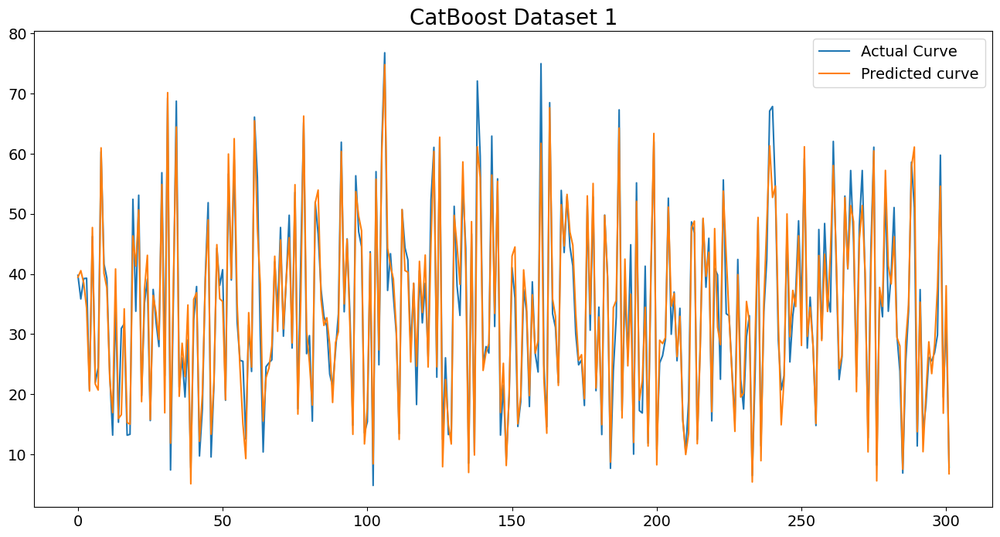


CatBoost Results in Dataset 2:
Dataset 2 – CatBoost: RMSE=4.127, MAE=2.759, MAPE=11.83%, R²=0.895, nRMSE(std)=32.41%


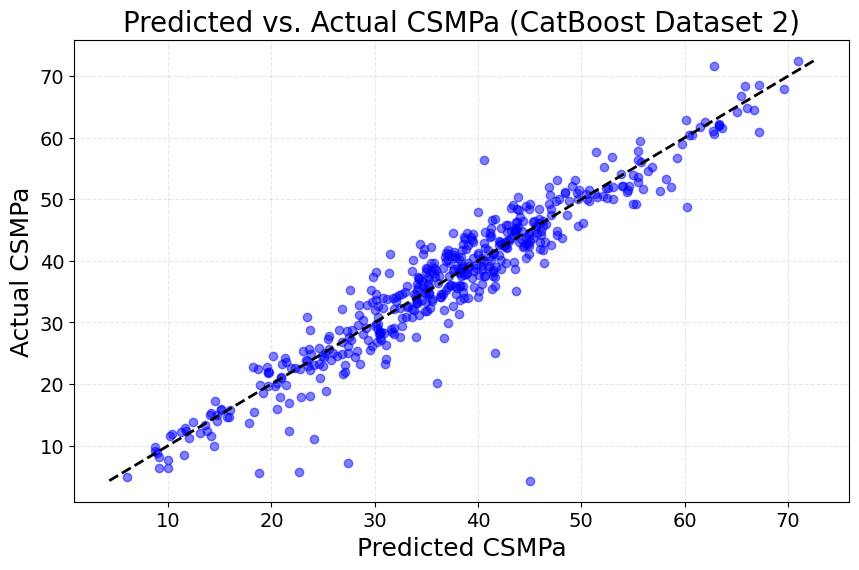

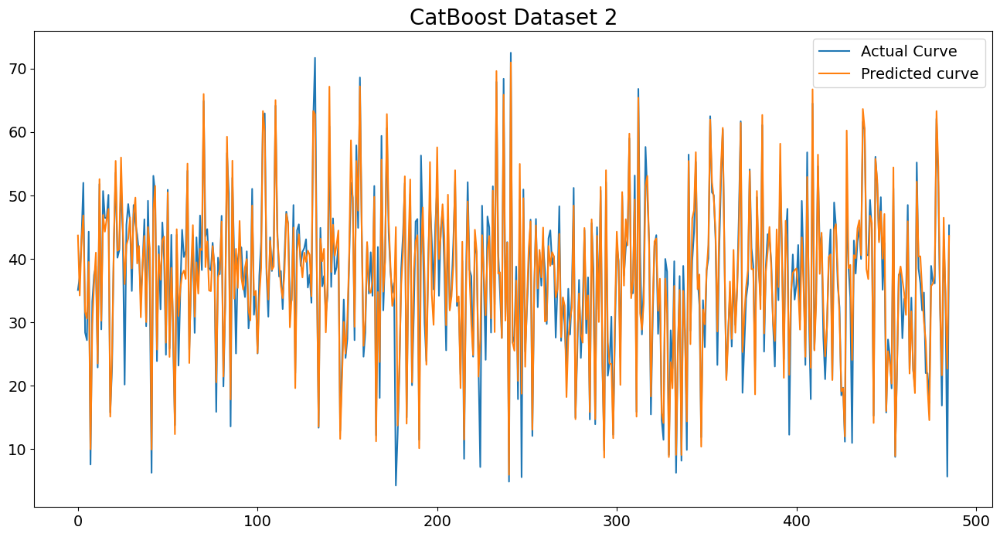


CatBoost Results in Dataset 3:
Dataset 3 – CatBoost: RMSE=3.898, MAE=3.008, MAPE=12.73%, R²=0.956, nRMSE(std)=20.89%


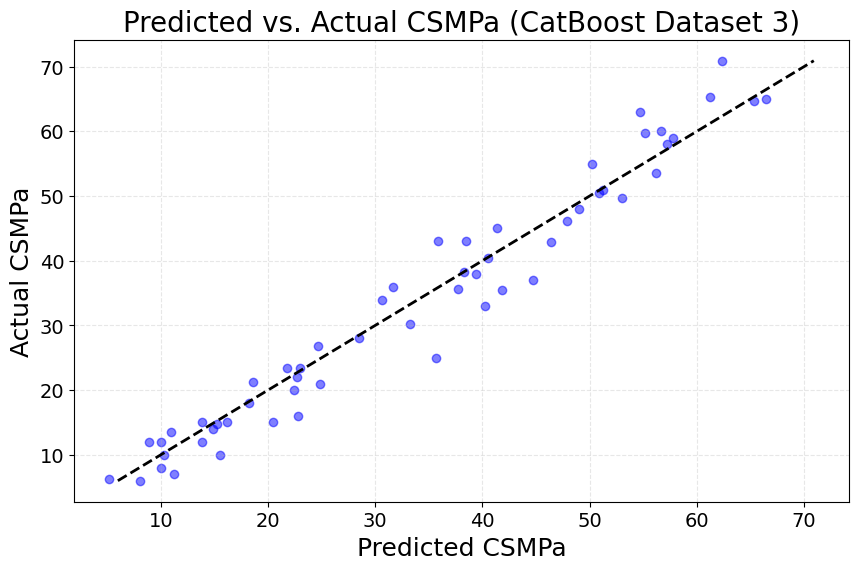

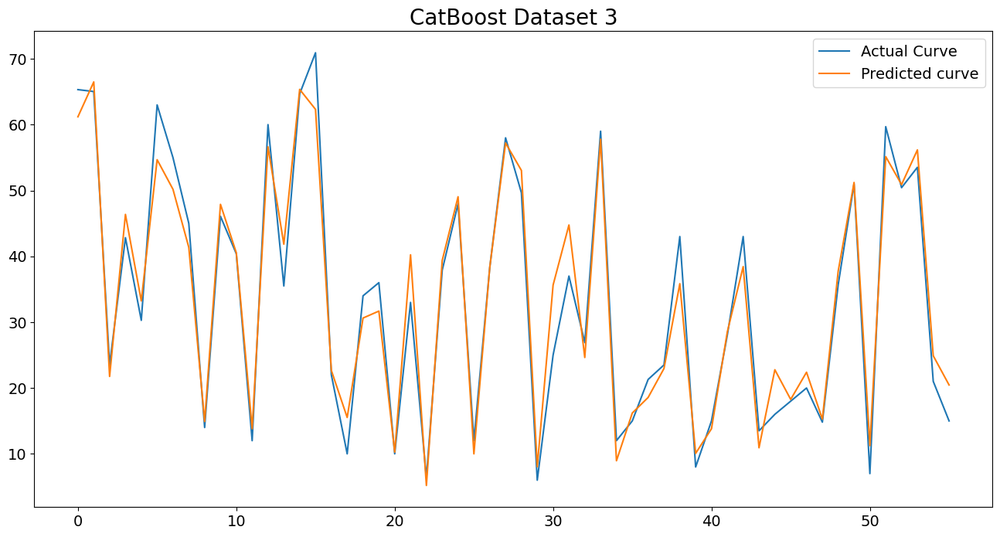

In [ ]:
# Evaluación de los modelos
for ds_name in datasets_test.keys():
    X_test, y_test = datasets_test[ds_name]
    cb_model = models_dics[ds_name]["CatBoost"]
    y_pred = predictions_dics[ds_name]["CatBoost"]

    print(f"\nCatBoost Results in {ds_name}:")
    evaluate_model(ds_name,True, f"CatBoost", cb_model, X_test, y_test, normalizer='std', nrmse_as_pct=True)

    # Crear gráfica de dispersión
    plt.figure(figsize=(10, 6))
    plt.scatter(x=y_pred, y=y_test, alpha=0.5, color='blue')  # Puntos azules con transparencia
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Línea de referencia (ideal)
    plt.xlabel('Predicted CSMPa', fontsize=18)
    plt.ylabel('Actual CSMPa', fontsize=18)
    plt.title(f'Predicted vs. Actual CSMPa (CatBoost {ds_name})', fontsize=20)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.show()

    # Comparación de la salida real vs predicha
    plt.figure(figsize=(16,8))
    plt.plot(np.arange(len(X_test)), y_test.values, label='Actual Curve')
    plt.plot(np.arange(len(X_test)), y_pred, label='Predicted curve')
    plt.title(f'CatBoost {ds_name}', fontsize=20)
    plt.legend()
    plt.show()

### XGBoost

#### Entrenamiento de los modelos

In [ ]:
# Espacio de búsqueda
params_xgb = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5],
    'gamma': [0, 0.1, 0.3],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [1, 1.5, 2],
    'objective': ['reg:squarederror']
}

In [ ]:
# Modelo base
xgb = XGBRegressor(random_state=42, n_jobs=-1)

In [ ]:
# Búsqueda aleatoria (más eficiente que GridSearch para muchos parámetros)
# --- Entrenamiento automático con loop ---
results_xgb = {}
for name, (X_train, y_train) in datasets_train.items():
    rs = RandomizedSearchCV(
      estimator=xgb,
      param_distributions=params_xgb,
      n_iter=50,                  # Número de combinaciones a probar
      cv=kf5,                       # Validación cruzada
      scoring='neg_mean_squared_error',
      verbose=2,
      random_state=42 #123
    )
    model = rs.fit(X_train, y_train)
    results_xgb[name] = model

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=50, objective=reg:squarederror, reg_alpha=0, reg_lambda=1, subsample=0.6; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=50, objective=reg:squarederror, reg_alpha=0, reg_lambda=1, subsample=0.6; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=50, objective=reg:squarederror, reg_alpha=0, reg_lambda=1, subsample=0.6; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=50, objective=reg:squarederror, reg_alpha=0, reg_lambda=1, subsample=0.6; total time=   0.3s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=1, n_estimators=50, objective=reg:squarede

In [ ]:
# Ejecutar la búsqueda
xgb_m1 = results_xgb["Dataset 1"]
xgb_m2 = results_xgb["Dataset 2"]
xgb_m3 = results_xgb["Dataset 3"]

In [ ]:
# Extraer el mejor modelo ya entrenado
mejor_xgb1 = xgb_m1.best_estimator_
mejor_xgb2 = xgb_m2.best_estimator_
mejor_xgb3 = xgb_m3.best_estimator_
print("Mejor Modelo Dataset 1:", mejor_xgb1)
print("Mejor Modelo Dataset 2:", mejor_xgb2)
print("Mejor Modelo Dataset 3:", mejor_xgb3)

Mejor Modelo Dataset 1: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=0.3, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.05, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
             max_leaves=None, min_child_weight=1, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=200,
             n_jobs=-1, num_parallel_tree=None, ...)
Mejor Modelo Dataset 2: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enab

In [ ]:
#Guardar el mejor modelo un un diccionario que se utilizara para los resultados
models_dic_db1["XGBoost"] = mejor_xgb1
models_dic_db2["XGBoost"] = mejor_xgb2
models_dic_db3["XGBoost"] = mejor_xgb3

In [ ]:
# Obtener predicciones del modelo entrenado
pred_xgb1 = mejor_xgb1.predict(X_test1)
pred_xgb2 = mejor_xgb2.predict(X_test2)
pred_xgb3 = mejor_xgb3.predict(X_test3)

In [ ]:
#Se alamcena en el diccionario de predicciones
predictions_db1["XGBoost"] = pred_xgb1
predictions_db2["XGBoost"] = pred_xgb2
predictions_db3["XGBoost"] = pred_xgb3

#### Evaluación de los modelos


XGBoost Results in Dataset 1:
Dataset 1 – XGBoost: RMSE=3.948, MAE=2.971, MAPE=10.54%, R²=0.936, nRMSE(std)=25.20%


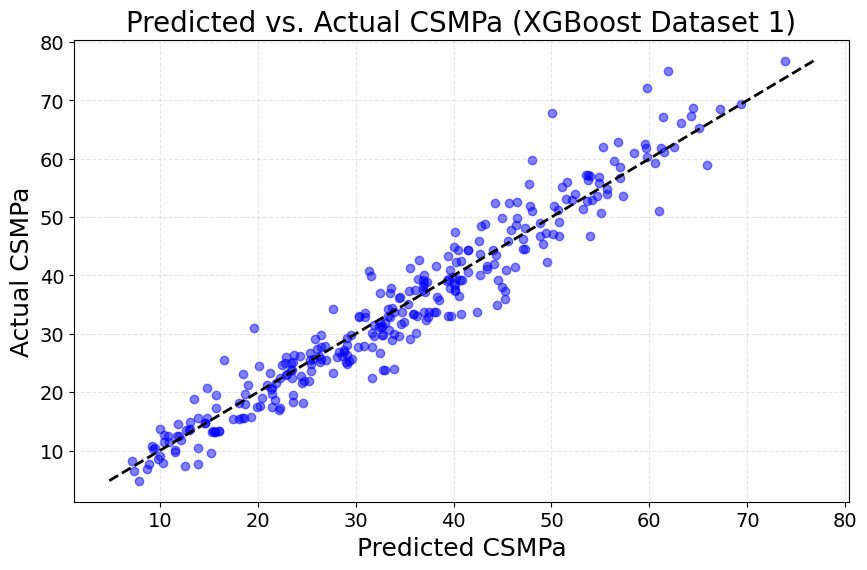

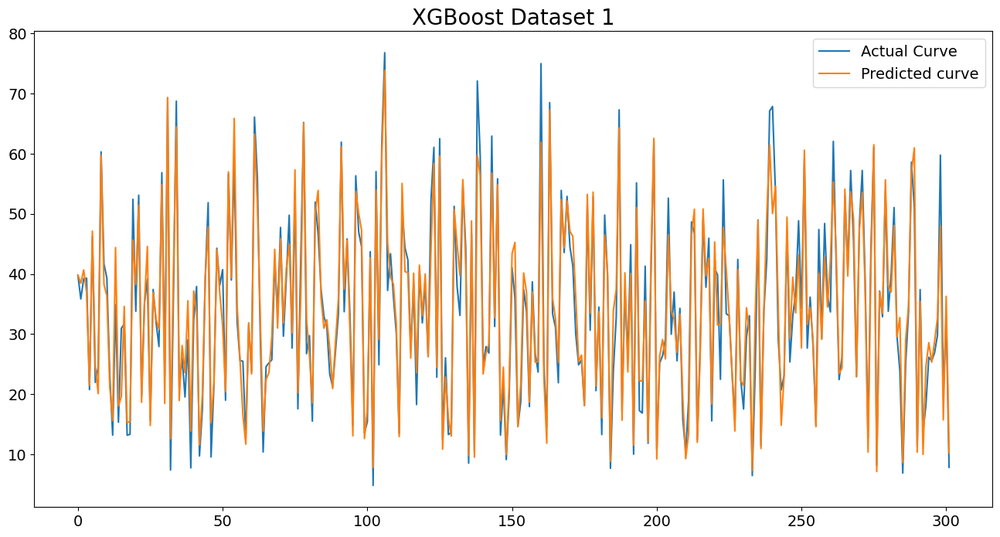


XGBoost Results in Dataset 2:
Dataset 2 – XGBoost: RMSE=3.879, MAE=2.657, MAPE=10.61%, R²=0.907, nRMSE(std)=30.47%


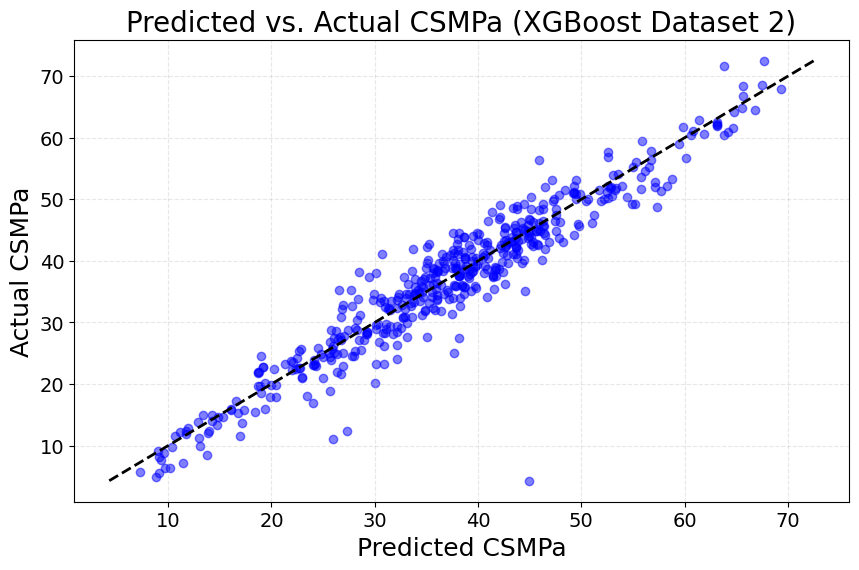

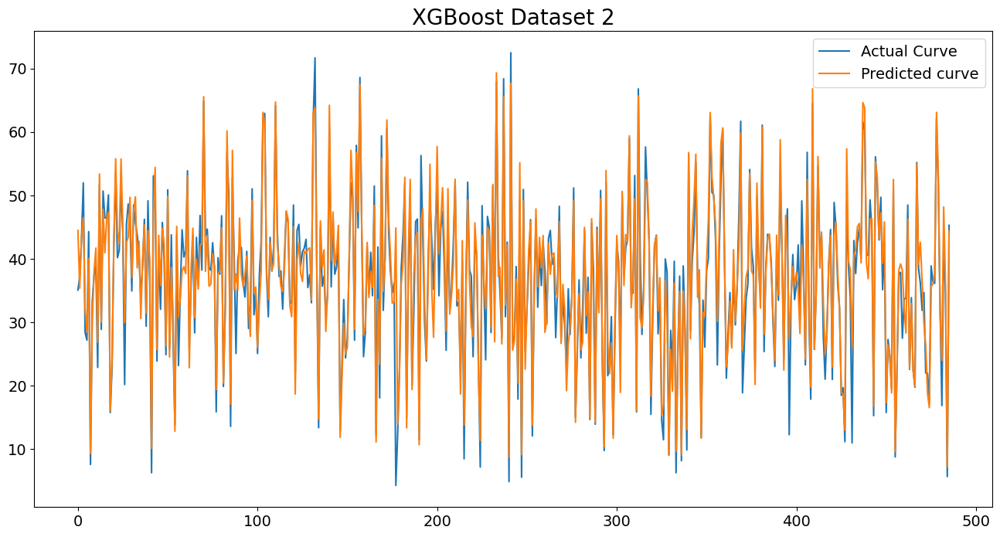


XGBoost Results in Dataset 3:
Dataset 3 – XGBoost: RMSE=4.291, MAE=3.422, MAPE=14.17%, R²=0.947, nRMSE(std)=22.99%


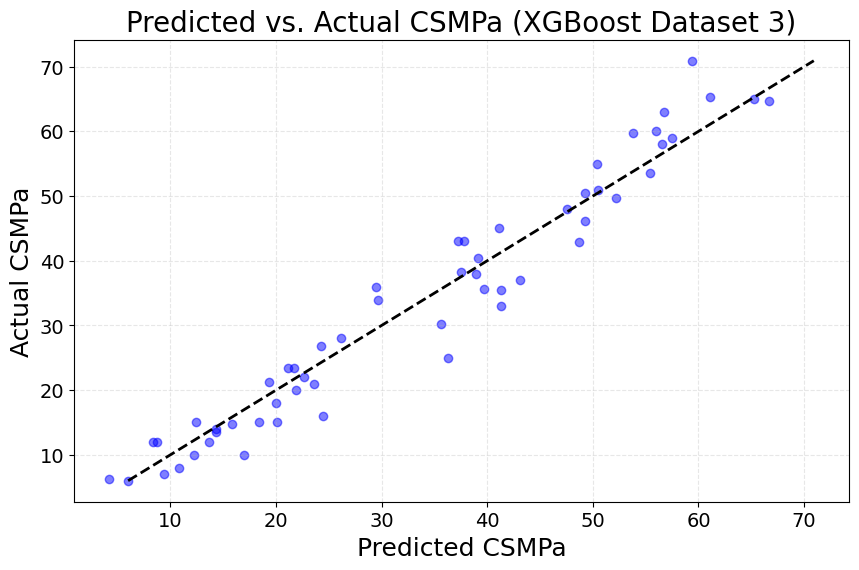

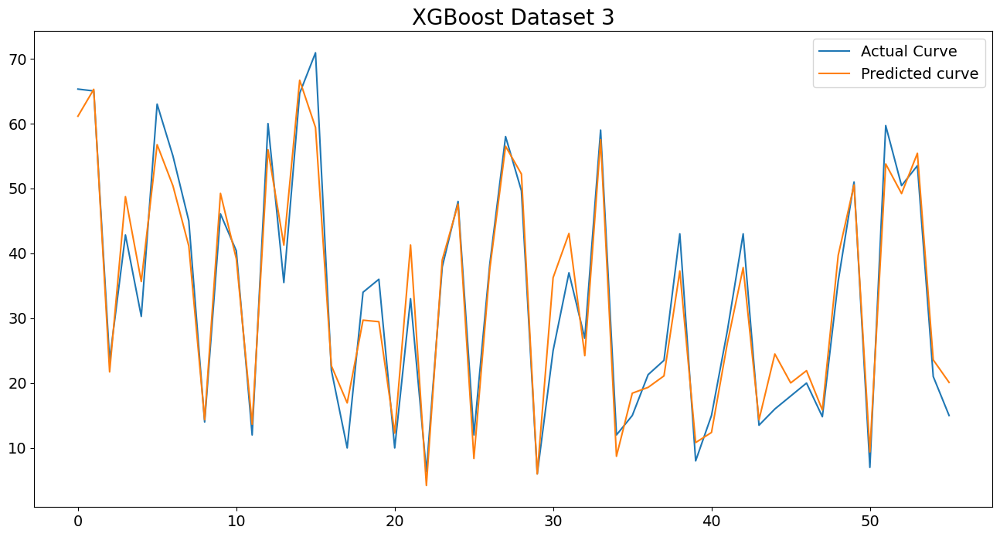

In [ ]:
# Evaluación de los modelos
for ds_name in datasets_test.keys():
    X_test, y_test = datasets_test[ds_name]
    xgb_model = models_dics[ds_name]["XGBoost"]
    y_pred = predictions_dics[ds_name]["XGBoost"]

    print(f"\nXGBoost Results in {ds_name}:")
    evaluate_model(ds_name,True, f"XGBoost", xgb_model, X_test, y_test, normalizer='std', nrmse_as_pct=True)

    # Crear gráfica de dispersión
    plt.figure(figsize=(10, 6))
    plt.scatter(x=y_pred, y=y_test, alpha=0.5, color='blue')  # Puntos azules con transparencia
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Línea de referencia (ideal)
    plt.xlabel('Predicted CSMPa', fontsize=18)
    plt.ylabel('Actual CSMPa', fontsize=18)
    plt.title(f'Predicted vs. Actual CSMPa (XGBoost {ds_name})', fontsize=20)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.show()

    # Comparación de la salida real vs predicha
    plt.figure(figsize=(16,8))
    plt.plot(np.arange(len(X_test)), y_test.values, label='Actual Curve')
    plt.plot(np.arange(len(X_test)), y_pred, label='Predicted curve')
    plt.title(f'XGBoost {ds_name}', fontsize=20)
    plt.legend()
    plt.show()

### LightGBM

#### Entrenamiento de los modelos

In [ ]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 6, 9],
    'num_leaves': [15, 31, 63],
    'min_child_samples': [5, 10, 20],
    'reg_alpha': [0, 0.1, 1],
    'reg_lambda': [0, 0.1, 1],
}

In [ ]:
# Definir el modelo base
lgbm = LGBMRegressor(random_state=123, verbose=-1)

In [ ]:
# --- Entrenamiento automático con loop ---
results_lgbm = {}
for name, (X_train, y_train) in datasets_train.items():
    rs = RandomizedSearchCV(
      lgbm,
      param_distributions=param_grid,
      n_iter=50,  # Número de combinaciones a probar
      cv=kf5,
      scoring='neg_mean_squared_error',
      verbose=2,
      random_state=42,
      n_jobs=-1
   )
    model = rs.fit(X_train, y_train)
    results_lgbm[name] = model

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Fitting 5 folds for each of 50 candidates, totalling 250 fits


In [ ]:
# Ejecutar la búsqueda
lgbm_m1 = results_lgbm["Dataset 1"]
lgbm_m2 = results_lgbm["Dataset 2"]
lgbm_m3 = results_lgbm["Dataset 3"]

In [ ]:
# Extraer el mejor modelo ya entrenado
mejor_lgbm1 = lgbm_m1.best_estimator_
mejor_lgbm2 = lgbm_m2.best_estimator_
mejor_lgbm3 = lgbm_m3.best_estimator_
print("Mejor Modelo Dataset 1:", mejor_lgbm1)
print("Mejor Modelo Dataset 2:", mejor_lgbm2)
print("Mejor Modelo Dataset 3:", mejor_lgbm3)

Mejor Modelo Dataset 1: LGBMRegressor(max_depth=6, min_child_samples=10, n_estimators=300,
              random_state=123, reg_alpha=0, reg_lambda=0.1, verbose=-1)
Mejor Modelo Dataset 2: LGBMRegressor(learning_rate=0.05, max_depth=9, min_child_samples=5,
              n_estimators=300, num_leaves=15, random_state=123, reg_alpha=0.1,
              reg_lambda=0.1, verbose=-1)
Mejor Modelo Dataset 3: LGBMRegressor(max_depth=3, min_child_samples=5, n_estimators=200, num_leaves=63,
              random_state=123, reg_alpha=0, reg_lambda=0, verbose=-1)


In [ ]:
#Guardar el mejor modelo un un diccionario que se utilizara para los resultados
models_dic_db1["LightGBM"] = mejor_lgbm1
models_dic_db2["LightGBM"] = mejor_lgbm2
models_dic_db3["LightGBM"] = mejor_lgbm3

In [ ]:
# Obtener predicciones del modelo entrenado
pred_lgbm1 = mejor_lgbm1.predict(X_test1)
pred_lgbm2 = mejor_lgbm2.predict(X_test2)
pred_lgbm3 = mejor_lgbm3.predict(X_test3)

In [ ]:
#Se alamcena en el diccionario de predicciones
predictions_db1["LightGBM"] = pred_lgbm1
predictions_db2["LightGBM"] = pred_lgbm2
predictions_db3["LightGBM"] = pred_lgbm3

#### Evaluación de los modelos


LightGBM Results in Dataset 1:
Dataset 1 – LightGBM: RMSE=3.733, MAE=2.643, MAPE=8.98%, R²=0.943, nRMSE(std)=23.83%


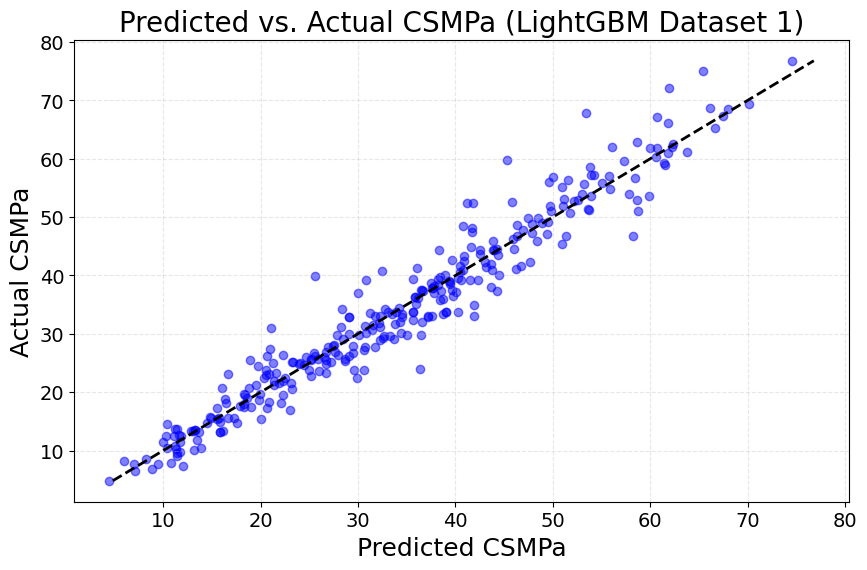

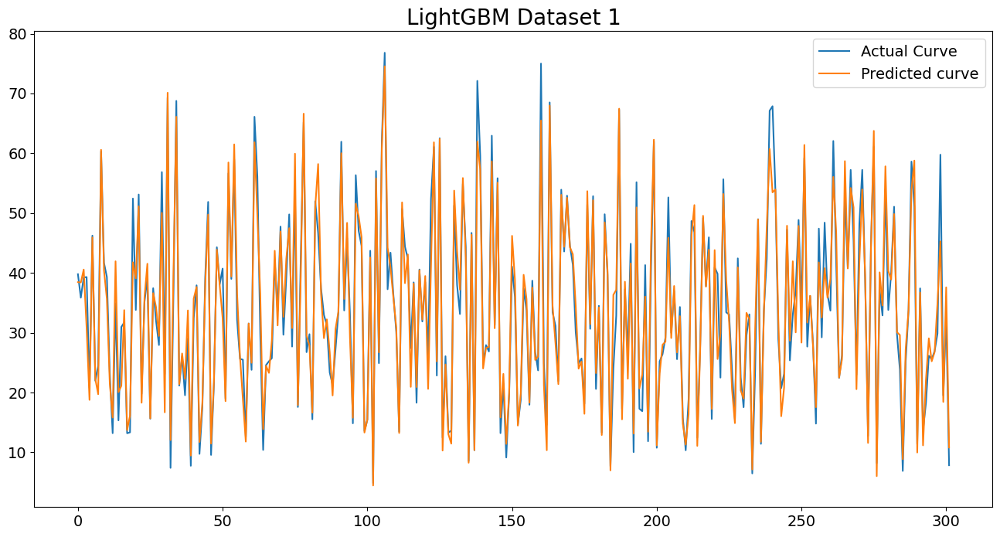


LightGBM Results in Dataset 2:
Dataset 2 – LightGBM: RMSE=4.167, MAE=2.828, MAPE=11.03%, R²=0.893, nRMSE(std)=32.72%


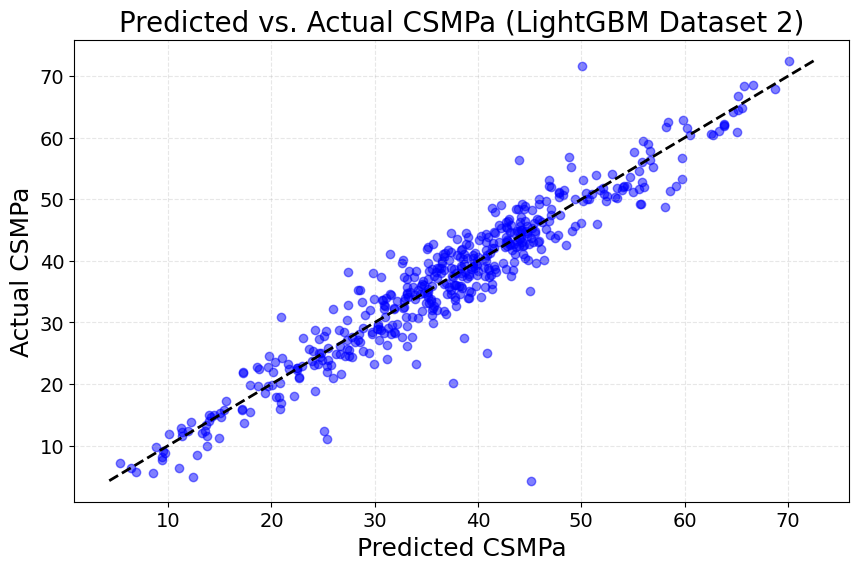

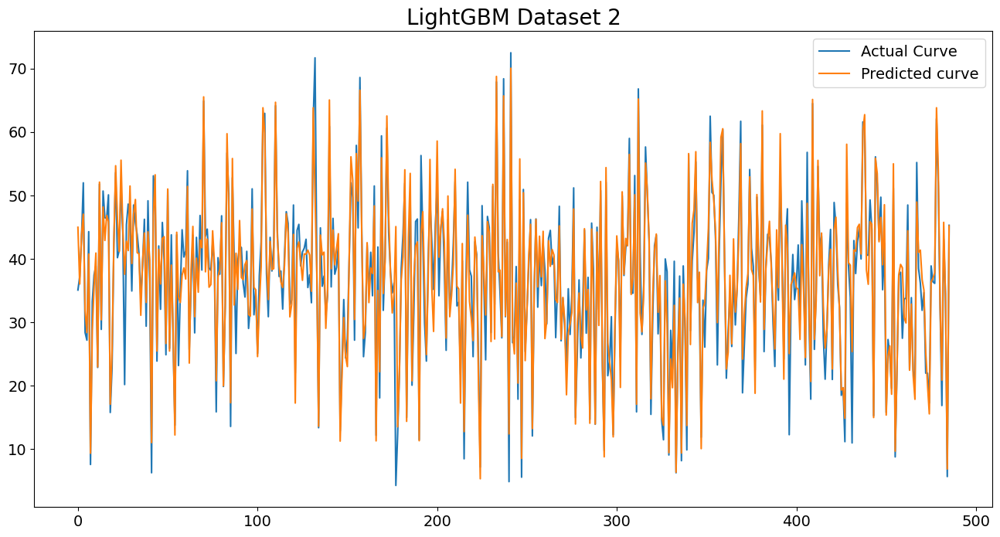


LightGBM Results in Dataset 3:
Dataset 3 – LightGBM: RMSE=3.834, MAE=2.971, MAPE=12.32%, R²=0.958, nRMSE(std)=20.55%


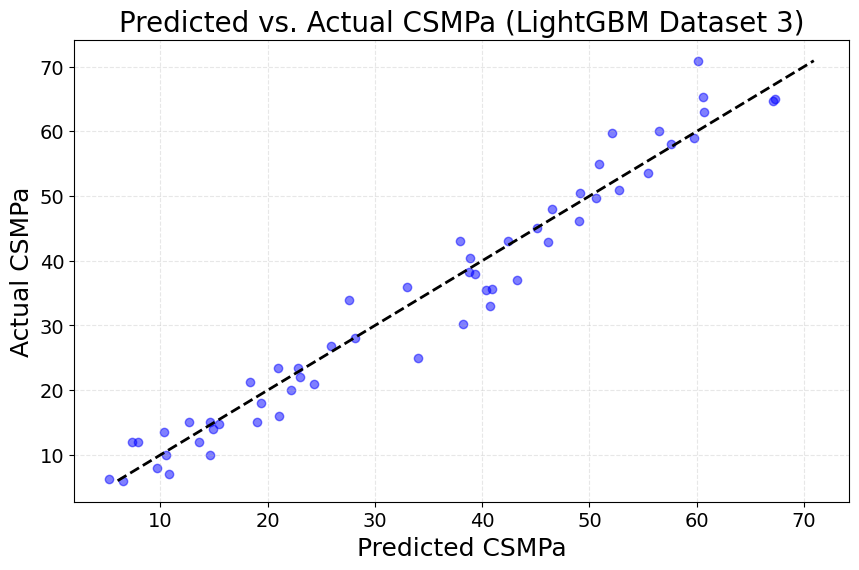

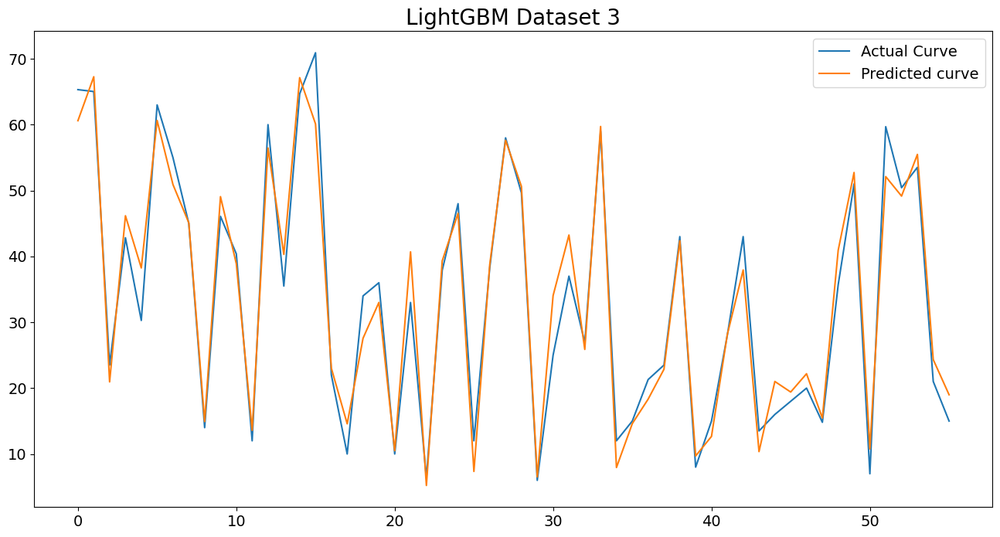

In [ ]:
# Evaluación de los modelos
for ds_name in datasets_test.keys():
    X_test, y_test = datasets_test[ds_name]
    lgbm_model = models_dics[ds_name]["LightGBM"]
    y_pred = predictions_dics[ds_name]["LightGBM"]

    print(f"\nLightGBM Results in {ds_name}:")
    evaluate_model(ds_name,True, f"LightGBM", lgbm_model, X_test, y_test, normalizer='std', nrmse_as_pct=True)

    # Crear gráfica de dispersión
    plt.figure(figsize=(10, 6))
    plt.scatter(x=y_pred, y=y_test, alpha=0.5, color='blue')  # Puntos azules con transparencia
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Línea de referencia (ideal)
    plt.xlabel('Predicted CSMPa', fontsize=18)
    plt.ylabel('Actual CSMPa', fontsize=18)
    plt.title(f'Predicted vs. Actual CSMPa (LightGBM {ds_name})', fontsize=20)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.show()

    # Comparación de la salida real vs predicha
    plt.figure(figsize=(16,8))
    plt.plot(np.arange(len(X_test)), y_test.values, label='Actual Curve')
    plt.plot(np.arange(len(X_test)), y_pred, label='Predicted curve')
    plt.title(f'LightGBM {ds_name}', fontsize=20)
    plt.legend()
    plt.show()

# ***Resultados obtenidos***

## Graficas comparativas del rendimiento de los modelos

###  Funciones para graficar

In [ ]:
def plot_model_performance(df, title_suffix=""):
    """
    Genera un conjunto de gráficas de barras (5 subplots) para comparar el rendimiento de los modelos.
    Requiere: columnas 'Modelo', 'RMSE', 'R²', 'MAE', 'MAPE (%)', 'nRMSE (%)'.
    """
    # Asegura que la columna 'Modelo' sea string y consistente
    df['Modelo'] = df['Modelo'].astype(str)

    # Orden de los modelos (por nRMSE (%) de menor a mayor)
    orden_modelos = df.sort_values('nRMSE')['Modelo']

    plt.figure(figsize=(14, 12))

    # Métricas a graficar (5 paneles)
    metrics = [
        {'col': 'nRMSE', 'title': 'nRMSE (%) Comparison', 'palette': 'Reds_r',   'format': '.2f', 'label_suffix': '%'},
        {'col': 'RMSE',      'title': 'RMSE Comparison',  'palette': 'Blues_r',  'format': '.2f', 'label_suffix': ''},
        {'col': 'R²',        'title': 'R² Comparison',    'palette': 'Greens_r', 'format': '.3f', 'label_suffix': '',},
        {'col': 'MAE',       'title': 'MAE Comparison',   'palette': 'Oranges_r','format': '.2f', 'label_suffix': ''},
        {'col': 'MAPE (%)',  'title': 'MAPE (%) Comparison','palette':'Purples_r','format': '.1f','label_suffix': '%',}
    ]

    # Grilla fija 3x2 (5 subplots, queda 1 hueco libre)
    for i, metric in enumerate(metrics):
        plt.subplot(3, 2, i + 1)
        ax = sns.barplot(
            x=metric['col'],
            y='Modelo',
            data=df,
            hue='Modelo',
            dodge=False,
            palette=metric['palette'],
            edgecolor='black',
            order=orden_modelos,
            legend=False
        )
        plt.title(metric['title'], fontsize=16, pad=15)
        plt.xlabel(metric['col'], fontsize=14)

        if metric.get('hide_ylabel'):
            plt.ylabel('')
            plt.yticks([])
        else:
            plt.ylabel('Model', fontsize=14)

        # Etiquetas en cada barra
        max_val = df[metric['col']].astype(float).max()
        offset = 0.01 * max_val if max_val > 0 else 0.1
        for p in ax.patches:
            value = p.get_width()
            ax.text(
                value + offset,
                p.get_y() + p.get_height()/2,
                f'{value:{metric["format"]}}{metric["label_suffix"]}',
                ha='left', va='center', fontsize=13
            )

    # Título general
    plt.suptitle(
        f'Performance of Regression Models for Predicting Concrete Compressive Strength (MPa) - {title_suffix}',
        fontsize=20, y=1.02
    )
    plt.tight_layout()
    plt.show()


In [ ]:
def plot_all_datasets_performance(results_dics):
    """
    Convierte cada diccionario de resultados en DataFrame
    y llama a plot_model_performance para graficar/imprimir por dataset.
    """
    for ds_name, res_dict in results_dics.items():
        # Convertir a DataFrame
        df = pd.DataFrame(res_dict)

        # Saltar si está vacío
        if df.empty:
            print(f"\n===== {ds_name} =====")
            print("No hay resultados para graficar.")
            continue

        # Graficar e imprimir
        print(f"\n===== {ds_name} =====")
        plot_model_performance(df, f"{ds_name}")
        print(df)


### Graficas


===== Dataset 1 =====


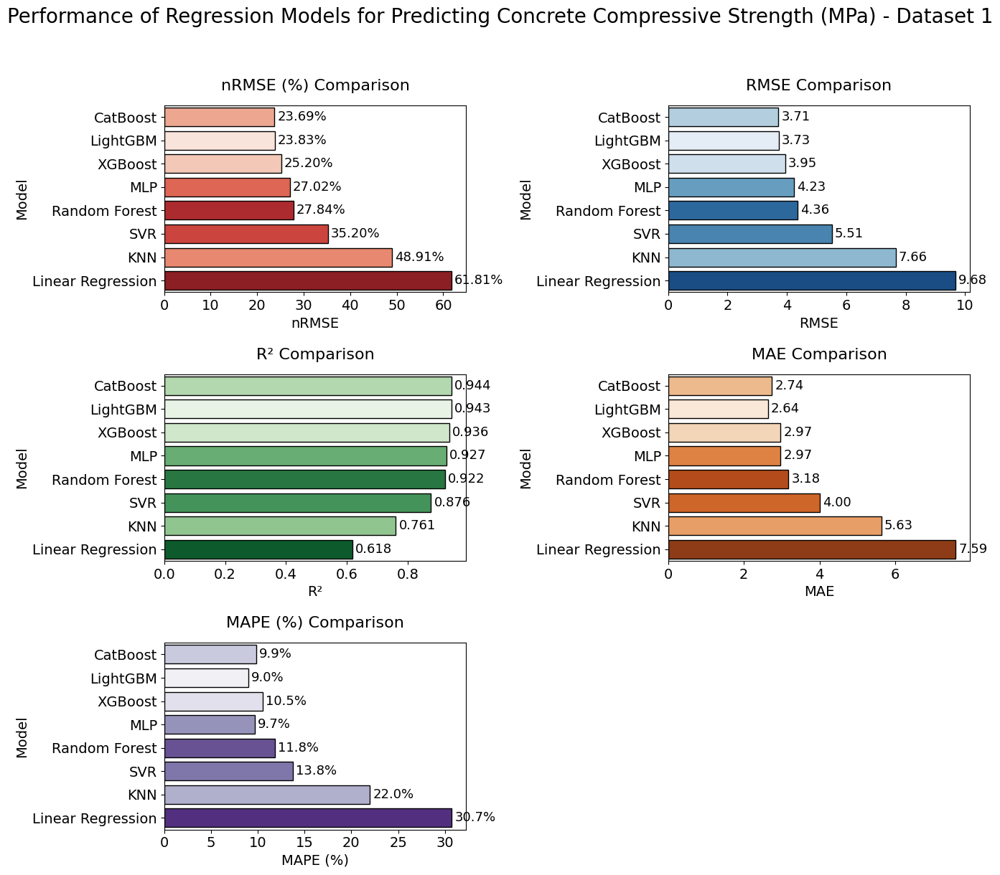

              Modelo      RMSE       MAE   MAPE (%)        R²      nRMSE
0  Linear Regression  9.682427  7.594014  30.724833  0.617941  61.810907
1      Random Forest  4.360944  3.178676  11.834425  0.922496  27.839501
2                SVR  5.514132  3.999741  13.789522  0.876087  35.201248
3                MLP  4.231902  2.968095   9.671475  0.927015  27.015718
4                KNN  7.661509  5.630139  21.992802  0.760784  48.909727
5           CatBoost  3.710454  2.743175   9.853672  0.943893  23.686884
6            XGBoost  3.947506  2.970892  10.539407  0.936495  25.200183
7           LightGBM  3.732529  2.642538   8.982421  0.943224  23.827805

===== Dataset 2 =====


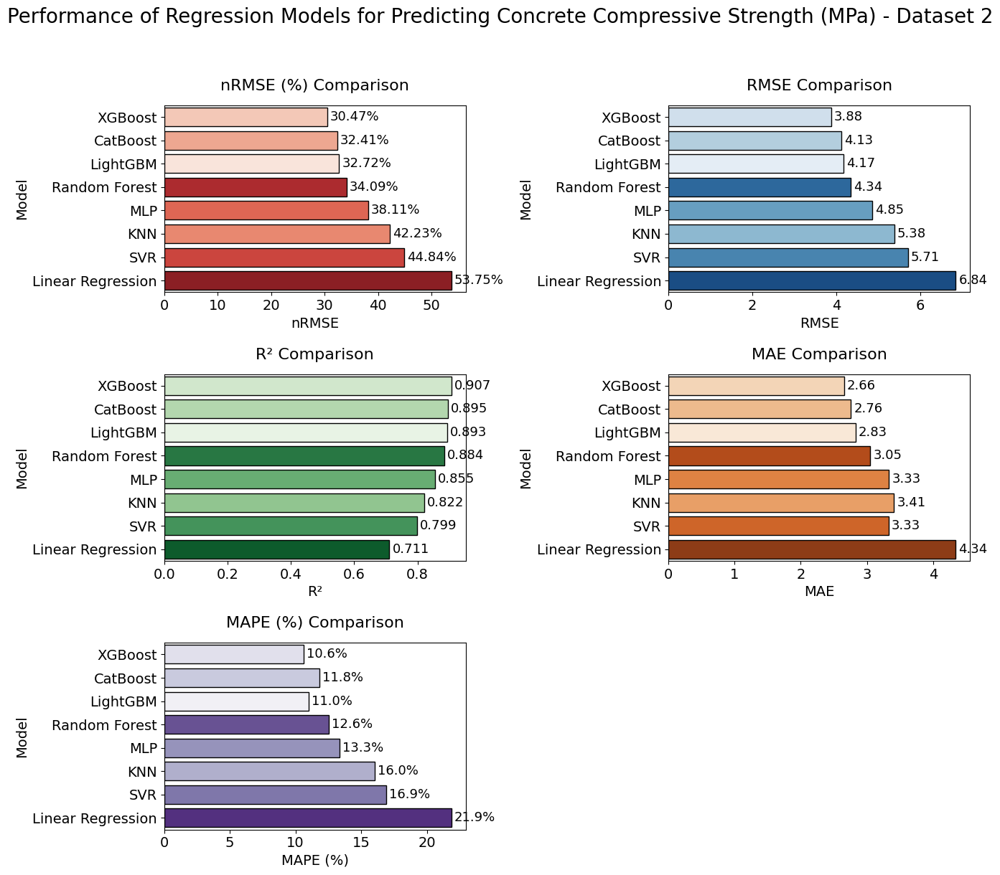

              Modelo      RMSE       MAE   MAPE (%)        R²      nRMSE
0  Linear Regression  6.843817  4.340422  21.880152  0.711106  53.748859
1      Random Forest  4.341249  3.052211  12.552669  0.883756  34.094595
2                SVR  5.709345  3.326545  16.915529  0.798945  44.839124
3                MLP  4.852961  3.333837  13.346265  0.854737  38.113393
4                KNN  5.377699  3.409671  16.029368  0.821625  42.234495
5           CatBoost  4.126812  2.759158  11.828783  0.894956  32.410487
6            XGBoost  3.879195  2.656885  10.613605  0.907184  30.465795
7           LightGBM  4.166827  2.828286  11.030017  0.892909  32.724747

===== Dataset 3 =====


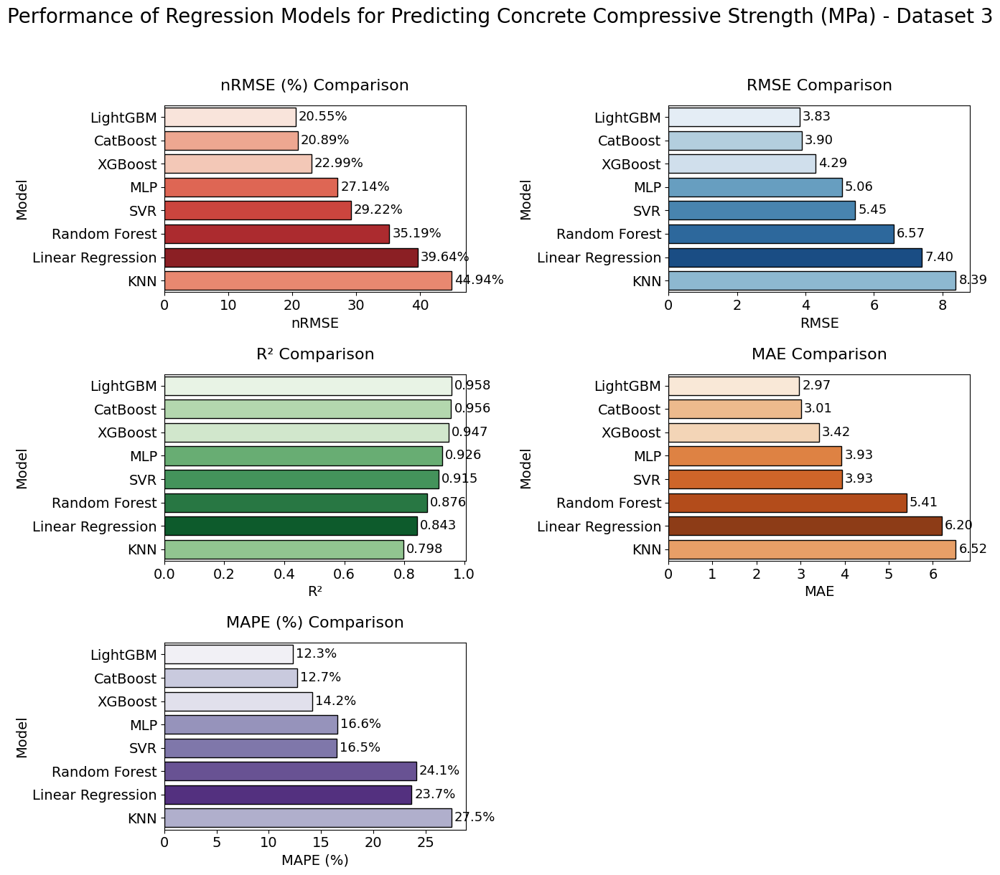

              Modelo      RMSE       MAE   MAPE (%)        R²      nRMSE
0  Linear Regression  7.397142  6.203001  23.668235  0.842900  39.635875
1      Random Forest  6.567276  5.405943  24.096404  0.876172  35.189228
2                SVR  5.453968  3.934766  16.480858  0.914597  29.223828
3                MLP  5.064671  3.929107  16.557295  0.926354  27.137868
4                KNN  8.387533  6.521816  27.496185  0.798016  44.942652
5           CatBoost  3.898099  3.008124  12.732889  0.956373  20.887062
6            XGBoost  4.290791  3.421990  14.166712  0.947140  22.991208
7           LightGBM  3.834410  2.970920  12.319801  0.957787  20.545798


In [ ]:
plot_all_datasets_performance(results_dics)

## Graficas comparativas del mejor algoritmo por dataset

### Función para las graficas

In [ ]:
def plot_best_models_all_metrics(results_dics):
    """
    Genera una figura 3x2 con las métricas (nRMSE, RMSE, R², MAE, MAPE),
    mostrando SOLO el mejor modelo de cada dataset para cada métrica.
    También imprime en consola los DataFrames con los mejores modelos.
    Requiere que exista la columna 'nRMSE (%)' (si tu col se llama distinto, cámbiala abajo).
    """
    metrics = [
        {"col": "nRMSE", "better": "lower",  "title": "nRMSE (%)"},
        {"col": "RMSE",      "better": "lower",  "title": "RMSE"},
        {"col": "R²",        "better": "higher", "title": "R²"},
        {"col": "MAE",       "better": "lower",  "title": "MAE"},
        {"col": "MAPE (%)",  "better": "lower",  "title": "MAPE (%)"},
    ]

    fig = plt.figure(figsize=(16, 14))
    nrows, ncols = 3, 2  # 5 subplots, queda 1 espacio libre

    for i, m in enumerate(metrics, start=1):
        best_rows = []
        for ds_name, res_dict in results_dics.items():
            df = pd.DataFrame(res_dict)
            if df.empty:
                continue

            # Si tu nRMSE está guardada con otro nombre, ajusta aquí:
            if m["col"] == "nRMSE (%)" and "nRMSE (%)" not in df.columns and "nRMSE" in df.columns:
                df = df.rename(columns={"nRMSE": "nRMSE (%)"})

            if m["col"] not in df.columns:
                continue

            df["Modelo"] = df["Modelo"].astype(str)
            vals = pd.to_numeric(df[m["col"]], errors="coerce")
            idx = vals.idxmin() if m["better"] == "lower" else vals.idxmax()
            row = df.loc[idx].to_dict()
            row["Dataset"] = ds_name
            best_rows.append(row)

        if not best_rows:
            continue

        df_best = pd.DataFrame(best_rows)

        # Orden natural: Dataset 1, 2, 3...
        try:
            ds_order = sorted(df_best["Dataset"].unique(), key=lambda s: int(str(s).split()[-1]))
        except Exception:
            ds_order = sorted(df_best["Dataset"].unique())

        # ---- imprimir resumen en consola ----
        print(f"\n=== Best Models for {m['col']} ===")
        print(df_best[["Dataset", "Modelo", m["col"]]].round(3))

        # ---- subplot (3x2) ----
        ax = plt.subplot(nrows, ncols, i)

        # Asegura numérico para la métrica (evita etiquetas "0.000")
        df_best[m["col"]] = pd.to_numeric(df_best[m["col"]], errors="coerce")

        sns.barplot(
            data=df_best,
            x="Dataset", y=m["col"],
            hue="Modelo",
            order=ds_order,
            edgecolor="black",
            ax=ax
        )
        plt.title(m["title"], fontsize=13, pad=10)
        plt.xlabel("Dataset", fontsize=11)
        plt.ylabel(m["col"], fontsize=11)

        # Etiquetas numéricas: omite alturas ~0
        is_percent = "%" in m["col"]
        fmt = "{:.2f}" if is_percent else "{:.3f}"

        ymax = ax.get_ylim()[1]
        thr = 0.01 * ymax  # umbral = 1% del máximo del eje

        for p in ax.patches:
            h = p.get_height()
            if (h is None) or (not np.isfinite(h)) or (h <= thr):
                continue
            ax.text(
                p.get_x() + p.get_width()/2,
                h,
                fmt.format(h),
                ha="center", va="bottom", fontsize=9
            )

        ax.legend(title="Best Model", loc="best")

    plt.suptitle("Best Model per Dataset for Each Metric", fontsize=15, y=0.98)
    plt.tight_layout()
    plt.show()


### Graficas


=== Best Models for nRMSE ===
     Dataset    Modelo   nRMSE
0  Dataset 1  CatBoost  23.687
1  Dataset 2   XGBoost  30.466
2  Dataset 3  LightGBM  20.546

=== Best Models for RMSE ===
     Dataset    Modelo   RMSE
0  Dataset 1  CatBoost  3.710
1  Dataset 2   XGBoost  3.879
2  Dataset 3  LightGBM  3.834

=== Best Models for R² ===
     Dataset    Modelo     R²
0  Dataset 1  CatBoost  0.944
1  Dataset 2   XGBoost  0.907
2  Dataset 3  LightGBM  0.958

=== Best Models for MAE ===
     Dataset    Modelo    MAE
0  Dataset 1  LightGBM  2.643
1  Dataset 2   XGBoost  2.657
2  Dataset 3  LightGBM  2.971

=== Best Models for MAPE (%) ===
     Dataset    Modelo  MAPE (%)
0  Dataset 1  LightGBM     8.982
1  Dataset 2   XGBoost    10.614
2  Dataset 3  LightGBM    12.320


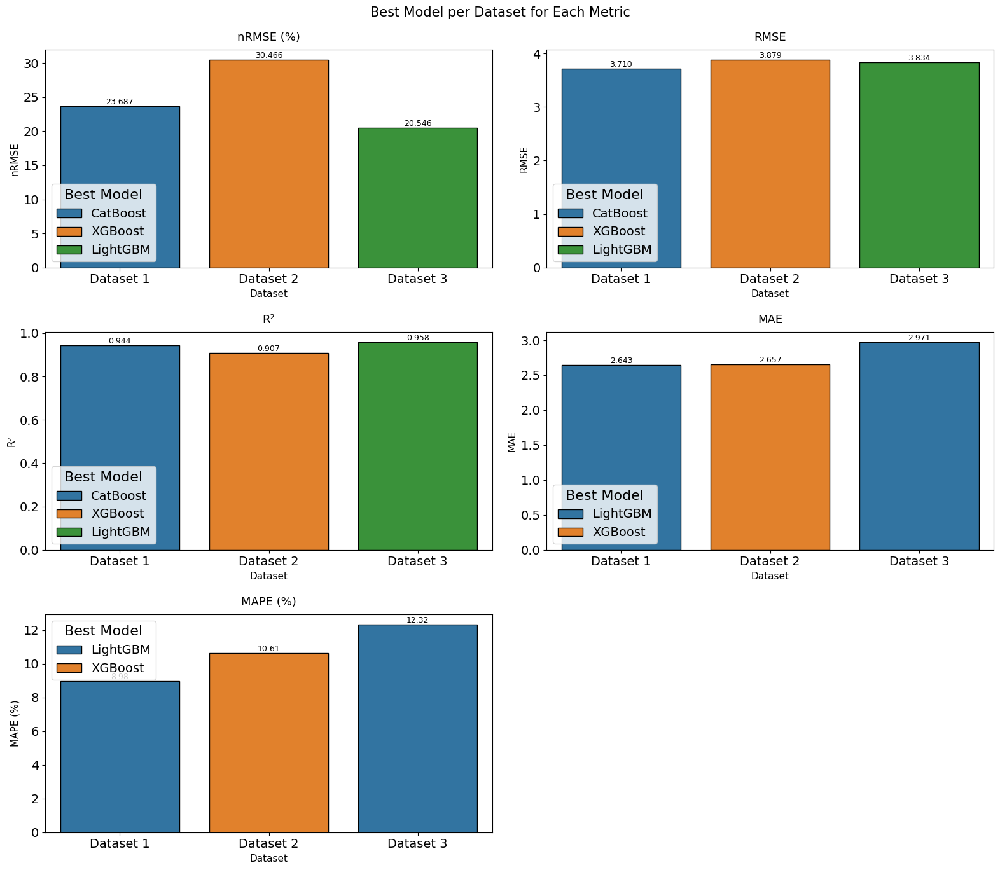

In [ ]:
plot_best_models_all_metrics(results_dics)


## Graficas de Estabilidad del ranking entre datasets


### Funciones

In [ ]:
def _natural_ds_order(cols):
    """
    Intenta ordenar columnas tipo 'Dataset 1', 'Dataset 2', ...
    Si no aplica, las deja en el orden dado.
    """
    try:
        return sorted(cols, key=lambda s: int(str(s).split()[-1]))
    except Exception:
        return list(cols)

# ---------- Núcleo: rankings y estabilidad ----------

def ranks_and_stability(results_dics, nrmse_col='nRMSE (%)'):
    """
    Construye:
      - ranks_df: filas=modelos, columnas=datasets, valores=rank (1=mejor) por nRMSE.
      - avg_rank: rango promedio por modelo (menor=mejor).
      - spearman: correlación de Spearman entre rankings de datasets.

    results_dics: dict con una entrada por dataset. Cada valor es un dict/DF con al menos:
        'Modelo' y la columna nrmse_col (p.ej. 'nRMSE (%)').
    """
    rank_tbl = {}
    for ds, d in results_dics.items():
        df = pd.DataFrame(d).copy()
        if df.empty or 'Modelo' not in df.columns or nrmse_col not in df.columns:
            continue

        # Asegurar tipos numéricos
        df['Modelo'] = df['Modelo'].astype(str)
        df[nrmse_col] = pd.to_numeric(df[nrmse_col], errors='coerce')

        # Orden por nRMSE ascendente (1 = mejor)
        r = df[['Modelo', nrmse_col]].dropna().sort_values(nrmse_col, ascending=True)
        r['rank'] = np.arange(1, len(r) + 1)
        rank_tbl[ds] = r.set_index('Modelo')['rank']

    ranks_df = pd.DataFrame(rank_tbl)  # filas=modelos, columnas=datasets
    # Algunos modelos podrían faltar en algún dataset → reordenar por promedio ignorando NaN
    avg_rank = ranks_df.mean(axis=1, skipna=True).sort_values()  # menor = mejor
    spearman = ranks_df.corr(method='spearman')  # coherencia entre datasets

    return ranks_df, avg_rank, spearman

# ---------- Gráficas separadas ----------

def plot_ranks_heatmap(ranks_df, title_suffix="nRMSE (%)"):
    """Heatmap de rangos por dataset (1 = mejor)."""
    # Ordenar filas por rango promedio y columnas por orden natural
    avg_rank = ranks_df.mean(axis=1, skipna=True).sort_values()
    ranks_df = ranks_df.loc[avg_rank.index]
    cols_order = _natural_ds_order(ranks_df.columns)
    ranks_df = ranks_df[cols_order]

    plt.figure(figsize=(7.5, 6), dpi=120)
    sns.heatmap(ranks_df, annot=True, fmt='.0f', cmap='Blues_r',
                cbar=False, linewidths=0.6, linecolor='white')
    plt.title(f'Ranks per Dataset ({title_suffix})', fontsize=16, pad=10)
    plt.xlabel('Dataset'); plt.ylabel('Model')
    plt.tight_layout()
    plt.show()

def plot_avg_rank_bar(avg_rank):
    """Barra del rango promedio (menor es mejor)."""
    ar_df = avg_rank.reset_index()
    ar_df.columns = ['Modelo', 'Avg Rank']
    order_models = ar_df['Modelo'].tolist()

    plt.figure(figsize=(7.5, 6), dpi=120)
    ax = sns.barplot(
        data=ar_df, x='Avg Rank', y='Modelo',
        hue='Modelo', hue_order=order_models, dodge=False,
        palette='Greens', edgecolor='black', legend=False
    )
    plt.title('Average Rank (lower is better)', fontsize=16, pad=10)
    plt.grid(axis='x', linestyle=':', alpha=0.4)
    # Etiquetas grandes en cada barra
    for p in ax.patches:
        v = p.get_width()
        ax.text(v + 0.05, p.get_y() + p.get_height()/2, f'{v:.2f}',
                ha='left', va='center', fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.show()

def plot_spearman_heatmap(spearman):
    """Heatmap de correlación de Spearman entre rankings de datasets."""
    # Orden natural de columnas/filas
    cols_order = _natural_ds_order(spearman.columns)
    spearman = spearman.loc[cols_order, cols_order]

    plt.figure(figsize=(6.2, 5.6), dpi=120)
    sns.heatmap(spearman, annot=True, fmt='.2f', vmin=-1, vmax=1, cmap='coolwarm',
                square=True, cbar=False, linewidths=0.6, linecolor='white')
    plt.title('Spearman between Dataset Rankings', fontsize=14, pad=10)
    plt.xlabel('Dataset'); plt.ylabel('Dataset')
    plt.tight_layout()
    plt.show()

def show_ranking_stability_separate(ranks_df, avg_rank, spearman, title_suffix="nRMSE (%)"):
    """
    Imprime tablas y genera 3 figuras independientes:
      1) Heatmap de rangos
      2) Barra de rango promedio
      3) Heatmap de Spearman
    """
    # Reordenar para impresión limpia
    ranks_df_print = ranks_df.loc[avg_rank.index, _natural_ds_order(ranks_df.columns)]

    print("\n=== Ranks per Dataset ({}) ===".format(title_suffix))
    print(ranks_df_print.round(0).astype('Int64').to_string())

    print("\n=== Average Rank (lower is better) ===")
    print(avg_rank.round(2).to_frame('Avg Rank').to_string())

    print("\n=== Spearman between Dataset Rankings ===")
    print(spearman.round(2).to_string())

    # Figuras separadas:
    plot_ranks_heatmap(ranks_df, title_suffix=title_suffix)
    plot_avg_rank_bar(avg_rank)
    plot_spearman_heatmap(spearman)

### Graficas


=== Ranks per Dataset (nRMSE (%)) ===
                   Dataset 1  Dataset 2  Dataset 3
Modelo                                            
CatBoost                   1          2          2
LightGBM                   2          3          1
XGBoost                    3          1          3
MLP                        4          5          4
Random Forest              5          4          6
SVR                        6          7          5
KNN                        7          6          8
Linear Regression          8          8          7

=== Average Rank (lower is better) ===
                   Avg Rank
Modelo                     
CatBoost               1.67
LightGBM               2.00
XGBoost                2.33
MLP                    4.33
Random Forest          5.00
SVR                    6.00
KNN                    7.00
Linear Regression      7.67

=== Spearman between Dataset Rankings ===
           Dataset 1  Dataset 2  Dataset 3
Dataset 1       1.00       0.88       0.93
Da

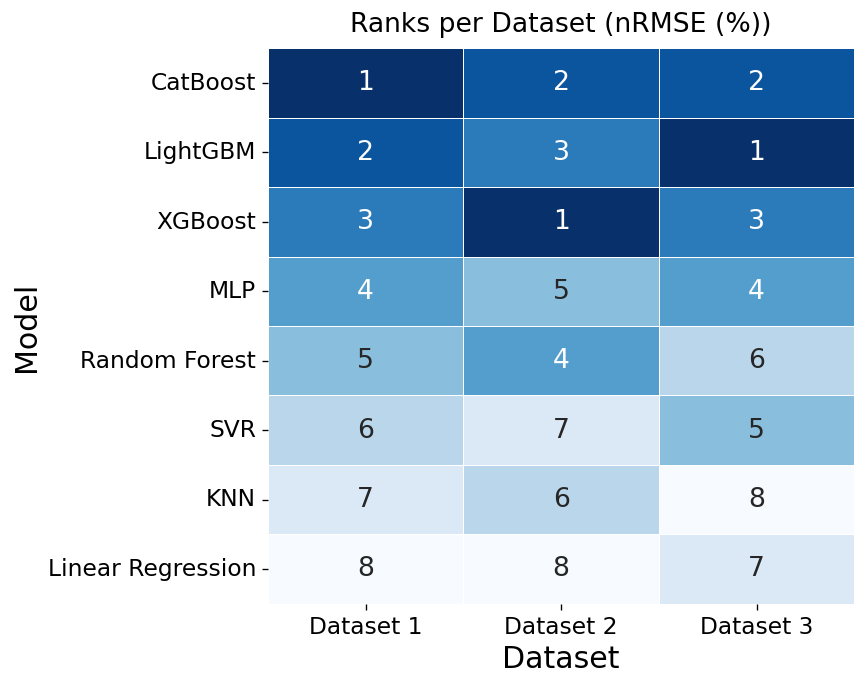

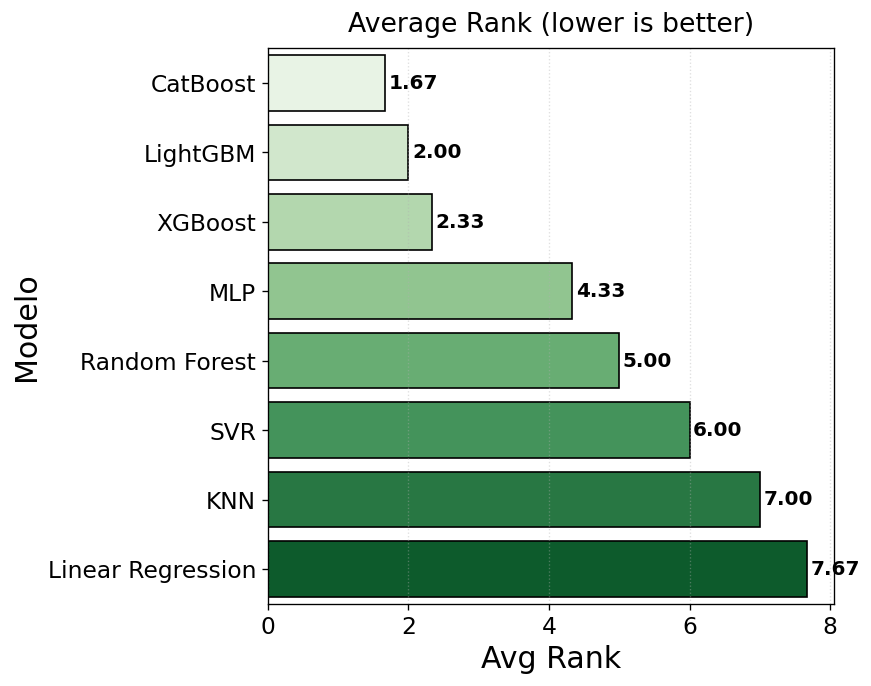

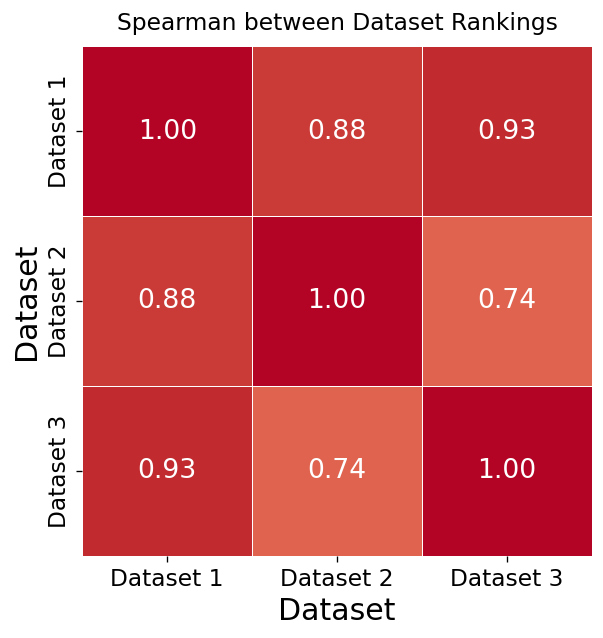

In [ ]:
ranks_df, avg_rank, spearman = ranks_and_stability(results_dics, nrmse_col='nRMSE')
show_ranking_stability_separate(ranks_df, avg_rank, spearman, title_suffix='nRMSE (%)')

##Importancia de las variables del mejor modelo

### Funciones para las graficas

In [ ]:
def plot_feature_importance(model, name, feature_names):
    """
    Dibuja la gráfica de importancias de un solo modelo.
    Usa get_feature_importance() o feature_importances_ según lo que exponga el modelo.
    """
    if hasattr(model, "get_feature_importance"):         # CatBoost, LightGBM
        importancia = model.get_feature_importance()
    elif hasattr(model, "feature_importances_"):         # XGBoost, RandomForest
        importancia = model.feature_importances_
    elif hasattr(model, "coef_"):                          # LR / Ridge / Lasso / LinearSVR
        importancia = np.abs(np.ravel(model.coef_))
    else:
        print(f"[{name}] Este modelo no soporta importancias nativas, se omite.")
        return

    importancias_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importancia
    }).sort_values(by='Importance', ascending=True)

    # Se imprimen los valores en consola
    print(f"\n=== {name} | Feature Importances ===")
    print(importancias_df.to_string(index=False))

    plt.figure(figsize=(8,6))
    plt.barh(importancias_df['Feature'], importancias_df['Importance'])
    plt.xlabel("Feature Importance")
    plt.title(f"{name} Feature Importance")
    plt.tight_layout()
    plt.show()

In [ ]:

def plot_feature_importances_all(models_dic, feature_names):
    """
    Recorre todos los modelos en el diccionario y genera una gráfica individual
    de importancia para cada uno.
    """
    for name, model in models_dic.items():
        plot_feature_importance(model, name, feature_names)

In [ ]:
# Helper: obtiene nombres de columna robustamente (DataFrame o ndarray)
def _get_feature_names(X, prefix="x"):
    if hasattr(X, "columns"):
        return list(X.columns)
    import numpy as np
    return [f"{prefix}{i}" for i in range(np.asarray(X).shape[1])]

# 1) Define los nombres de features por dataset (usa tus X_train originales)
feature_names_by_ds = {
    "Dataset 1": _get_feature_names(X_train1, prefix="d1_"),
    "Dataset 2": _get_feature_names(X_train2, prefix="d2_"),
    "Dataset 3": _get_feature_names(X_train3, prefix="d3_"),
}

In [ ]:
def plot_feature_importances_by_dataset(models_dics, feature_names_by_ds):
    for ds_name, models_dic in models_dics.items():
        names = feature_names_by_ds[ds_name]
        print(f"\n========== {ds_name} — Feature Importances ==========")
        for model_name, model in models_dic.items():
            plot_feature_importance(model, f"{model_name} — {ds_name}", names)


### Graficas


========== Dataset 1 — Feature Importances ==========

=== Linear Regression — Dataset 1 | Feature Importances ===
         Feature  Importance
 coarseaggregate    0.010293
   fineaggregate    0.011797
          flyash    0.072310
            slag    0.091972
          cement    0.106492
             age    0.116425
           water    0.173142
superplasticizer    0.382886


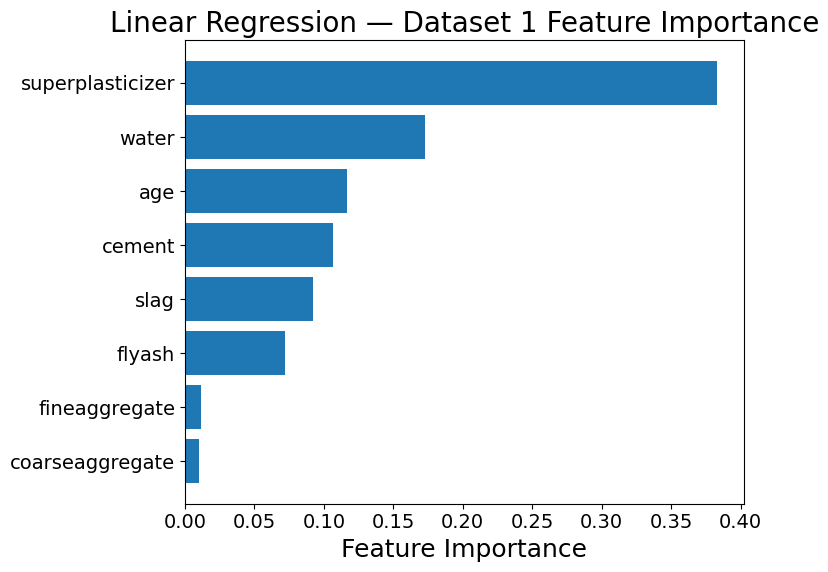


=== Random Forest — Dataset 1 | Feature Importances ===
         Feature  Importance
 coarseaggregate    0.048214
          flyash    0.048451
   fineaggregate    0.060660
            slag    0.064857
superplasticizer    0.077748
           water    0.131508
          cement    0.214285
             age    0.354278


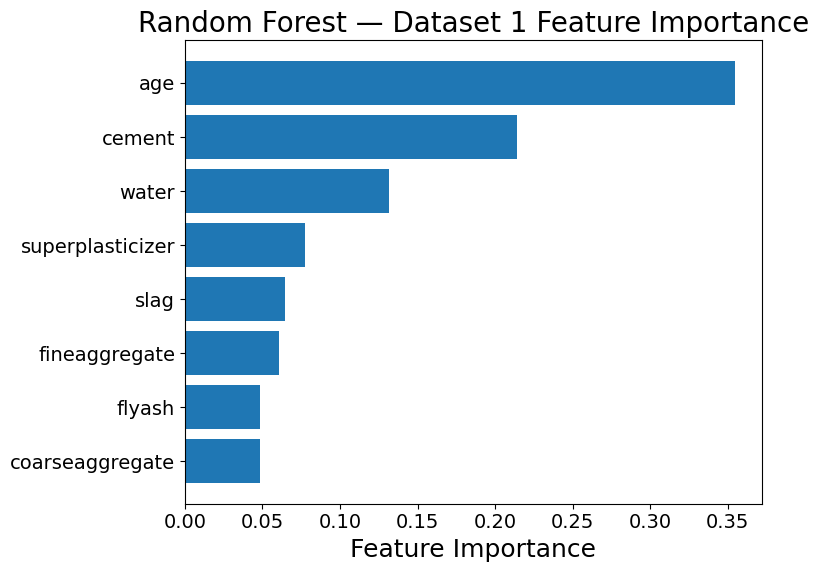

[SVR — Dataset 1] Este modelo no soporta importancias nativas, se omite.
[MLP — Dataset 1] Este modelo no soporta importancias nativas, se omite.
[KNN — Dataset 1] Este modelo no soporta importancias nativas, se omite.

=== CatBoost — Dataset 1 | Feature Importances ===
         Feature  Importance
 coarseaggregate    2.802929
          flyash    3.655678
   fineaggregate    5.851485
superplasticizer    6.750396
            slag    7.645917
           water   15.514125
          cement   22.604231
             age   35.175240


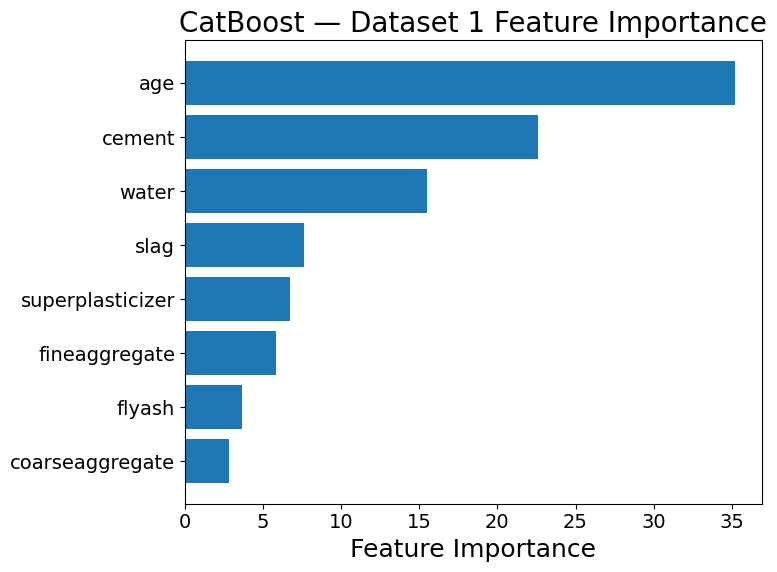


=== XGBoost — Dataset 1 | Feature Importances ===
         Feature  Importance
 coarseaggregate    0.038882
            slag    0.067940
   fineaggregate    0.069183
superplasticizer    0.092991
          flyash    0.097582
          cement    0.138128
           water    0.138872
             age    0.356423


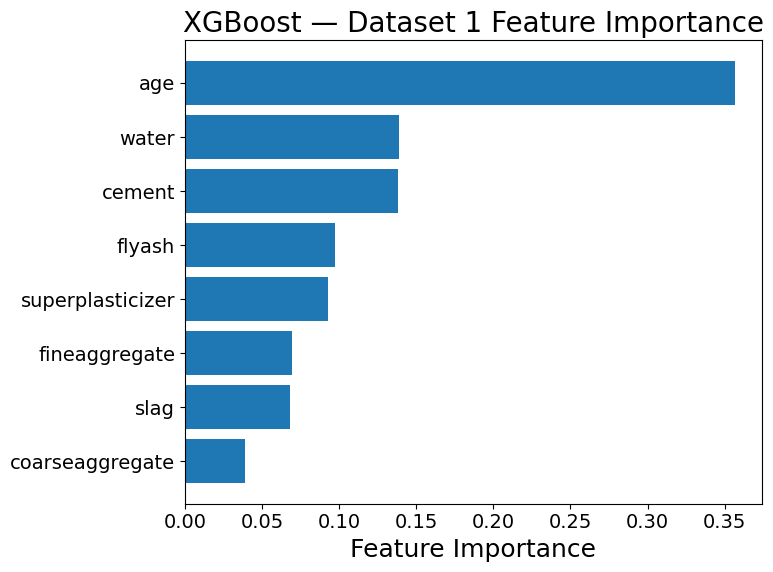


=== LightGBM — Dataset 1 | Feature Importances ===
         Feature  Importance
          flyash         268
            slag         495
superplasticizer         668
             age         687
           water         688
   fineaggregate         782
 coarseaggregate         794
          cement         821


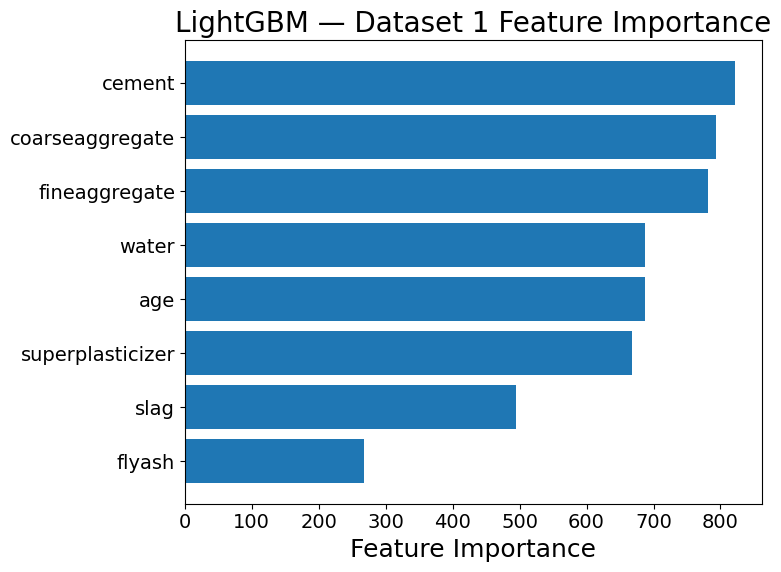


========== Dataset 2 — Feature Importances ==========

=== Linear Regression — Dataset 2 | Feature Importances ===
                 Feature  Importance
Water_reducing_Admixture    0.003671
       Coarse_Aggregates    0.004287
         Fine_Aggregates    0.011225
                 Fly_Ash    0.099011
                  Cement    0.125559
                   Water    0.252016
      Accelerating_Agent    0.293730
                    Time    0.339368
             Silica_Fume    0.552542


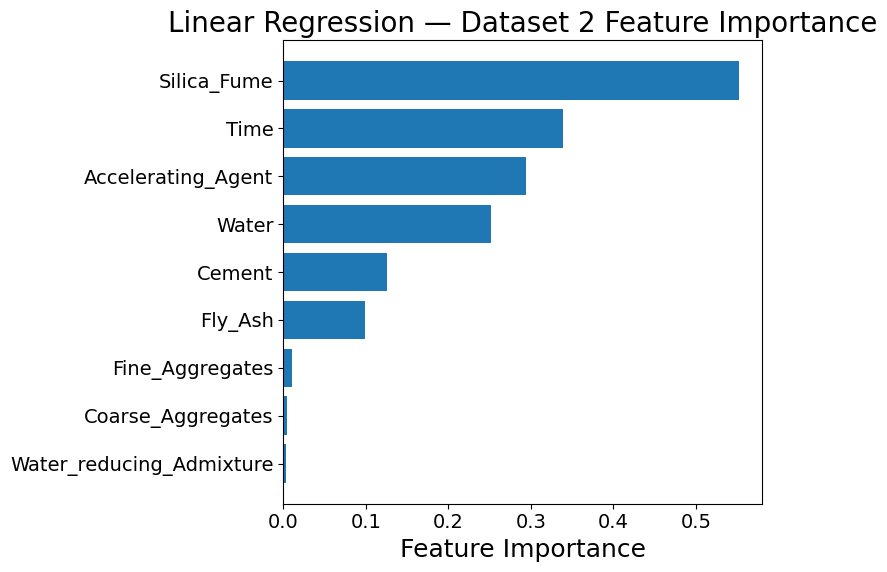


=== Random Forest — Dataset 2 | Feature Importances ===
                 Feature  Importance
      Accelerating_Agent    0.001605
             Silica_Fume    0.012633
                 Fly_Ash    0.025587
                    Time    0.069851
       Coarse_Aggregates    0.104265
                   Water    0.118241
         Fine_Aggregates    0.168938
Water_reducing_Admixture    0.230209
                  Cement    0.268670


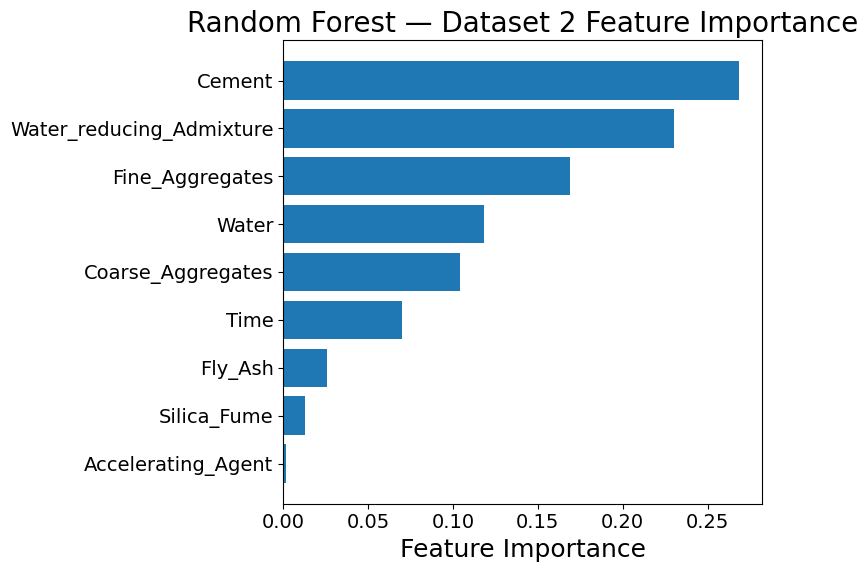

[SVR — Dataset 2] Este modelo no soporta importancias nativas, se omite.
[MLP — Dataset 2] Este modelo no soporta importancias nativas, se omite.
[KNN — Dataset 2] Este modelo no soporta importancias nativas, se omite.

=== CatBoost — Dataset 2 | Feature Importances ===
                 Feature  Importance
      Accelerating_Agent    0.219963
             Silica_Fume    0.839012
                 Fly_Ash    4.904190
         Fine_Aggregates    7.504408
                    Time   10.713326
       Coarse_Aggregates   11.924372
Water_reducing_Admixture   15.602802
                   Water   16.993819
                  Cement   31.298109


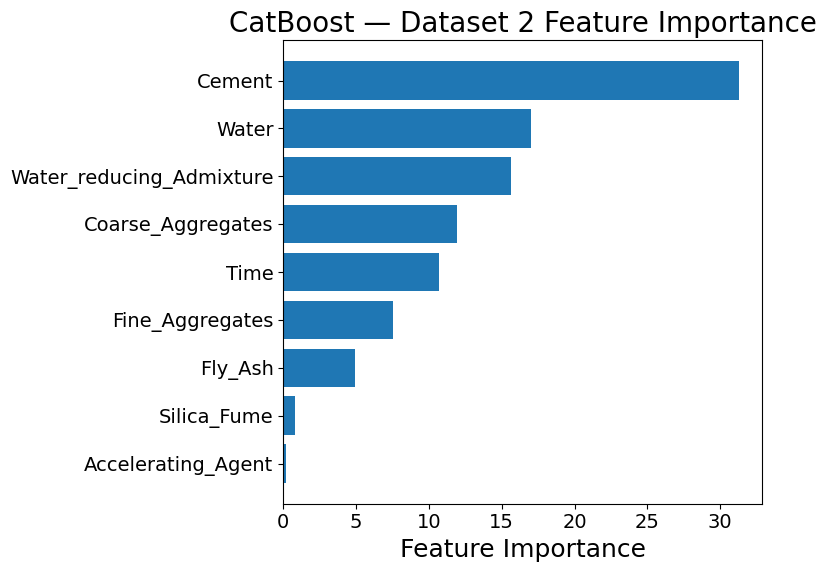


=== XGBoost — Dataset 2 | Feature Importances ===
                 Feature  Importance
      Accelerating_Agent    0.022725
                 Fly_Ash    0.063944
       Coarse_Aggregates    0.078569
         Fine_Aggregates    0.079220
                   Water    0.116927
                    Time    0.123091
             Silica_Fume    0.143628
                  Cement    0.170767
Water_reducing_Admixture    0.201129


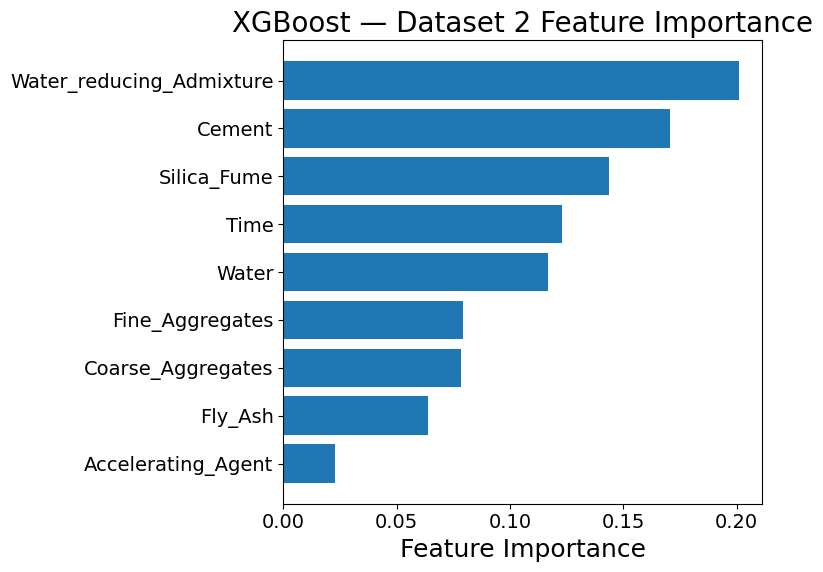


=== LightGBM — Dataset 2 | Feature Importances ===
                 Feature  Importance
      Accelerating_Agent          30
             Silica_Fume          40
                    Time         220
                 Fly_Ash         313
       Coarse_Aggregates         611
                   Water         629
         Fine_Aggregates         714
Water_reducing_Admixture         749
                  Cement         892


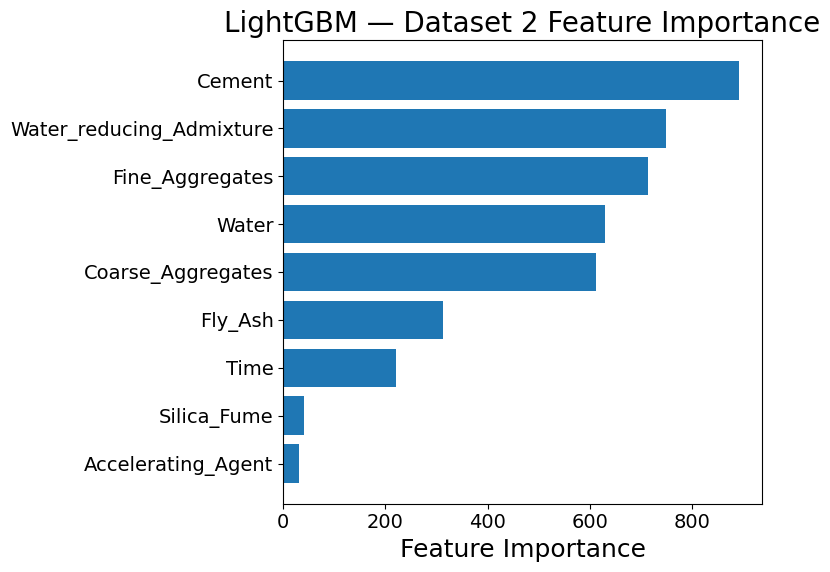


========== Dataset 3 — Feature Importances ==========

=== Linear Regression — Dataset 3 | Feature Importances ===
    Feature  Importance
     flyash    0.000000
      water    0.000000
  water_TCM    0.000000
NCA_20_DOWN    0.000000
RCA_10_DOWN    0.000000
RCA_20_DOWN    0.000000
NCA_10_DOWN    0.000000
        TCM    0.000251
       SAND    0.018523
       GGBS    0.069138
         MK    0.087199
     cement    0.092489
        AGE    0.251790
         SP    0.922514
        VMA    1.814133


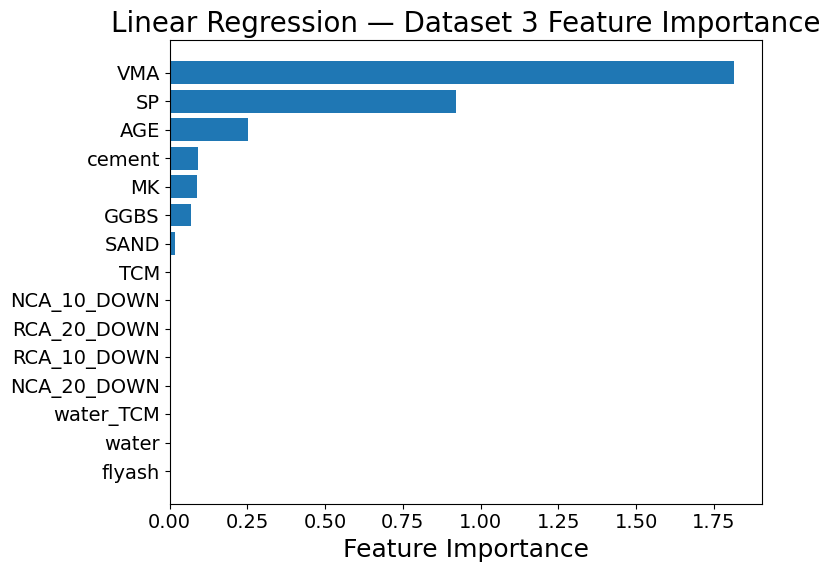


=== Random Forest — Dataset 3 | Feature Importances ===
    Feature  Importance
NCA_10_DOWN    0.003300
NCA_20_DOWN    0.003598
         MK    0.017642
        VMA    0.019468
      water    0.023016
       GGBS    0.025162
RCA_10_DOWN    0.049755
       SAND    0.057554
RCA_20_DOWN    0.066676
         SP    0.070922
     flyash    0.080921
  water_TCM    0.120391
        TCM    0.121801
     cement    0.143961
        AGE    0.195832


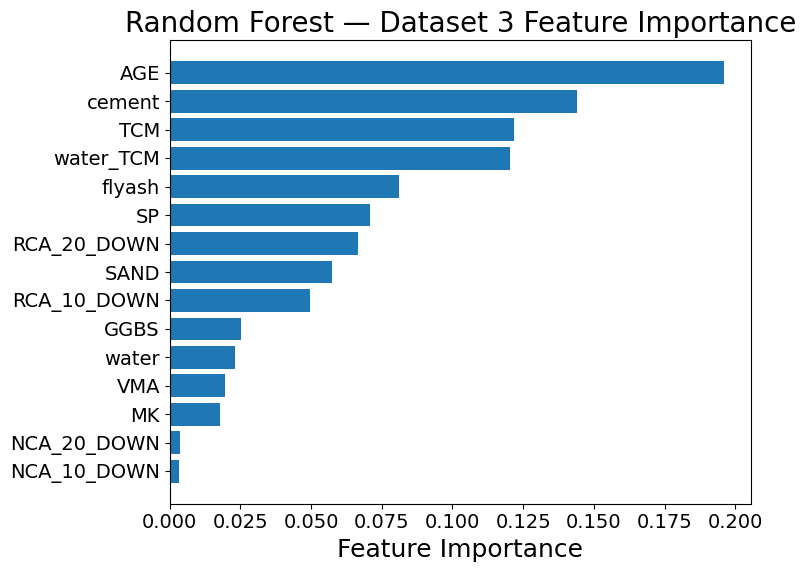

[SVR — Dataset 3] Este modelo no soporta importancias nativas, se omite.
[MLP — Dataset 3] Este modelo no soporta importancias nativas, se omite.
[KNN — Dataset 3] Este modelo no soporta importancias nativas, se omite.

=== CatBoost — Dataset 3 | Feature Importances ===
    Feature  Importance
NCA_10_DOWN    0.040777
NCA_20_DOWN    0.061782
      water    1.037547
       SAND    1.408994
         MK    1.487980
        VMA    2.274070
RCA_20_DOWN    2.368147
       GGBS    3.044811
RCA_10_DOWN    3.317312
         SP    5.651522
        TCM    9.475259
  water_TCM    9.616918
     flyash   16.320614
     cement   17.550996
        AGE   26.343272


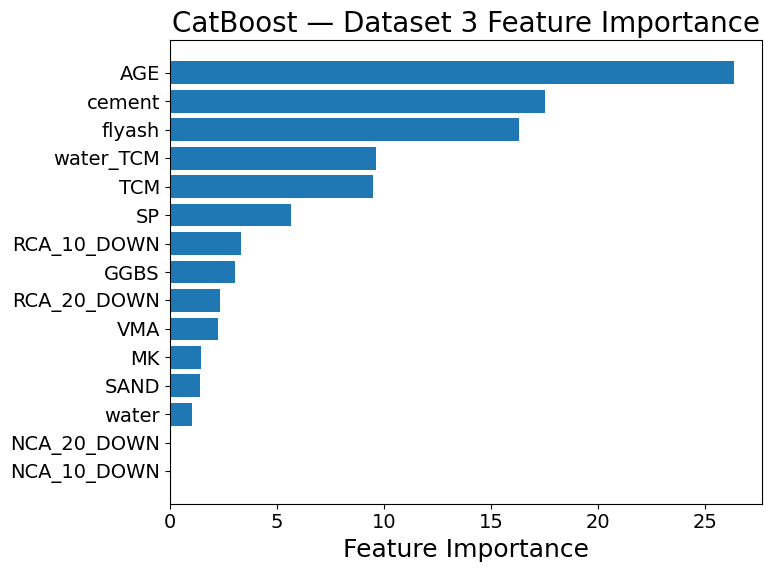


=== XGBoost — Dataset 3 | Feature Importances ===
    Feature  Importance
NCA_10_DOWN    0.005592
         MK    0.010988
       SAND    0.011892
RCA_10_DOWN    0.030532
      water    0.031569
RCA_20_DOWN    0.034148
         SP    0.039076
        VMA    0.042272
  water_TCM    0.061074
        AGE    0.067521
       GGBS    0.071049
     cement    0.101313
     flyash    0.107773
        TCM    0.117870
NCA_20_DOWN    0.267332


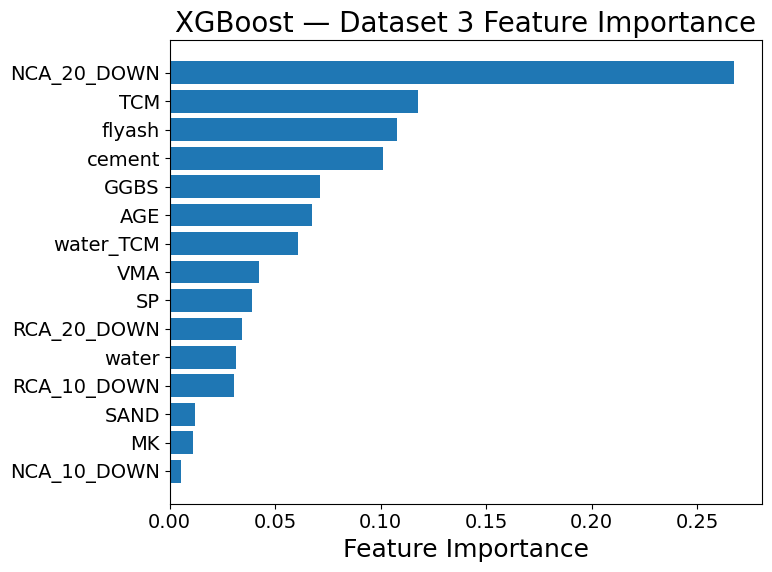


=== LightGBM — Dataset 3 | Feature Importances ===
    Feature  Importance
NCA_10_DOWN           0
NCA_20_DOWN          10
        VMA          13
         MK          30
      water          31
       GGBS          33
  water_TCM          40
        TCM          49
     flyash          68
       SAND          88
RCA_10_DOWN          91
RCA_20_DOWN         102
         SP         103
     cement         165
        AGE         267


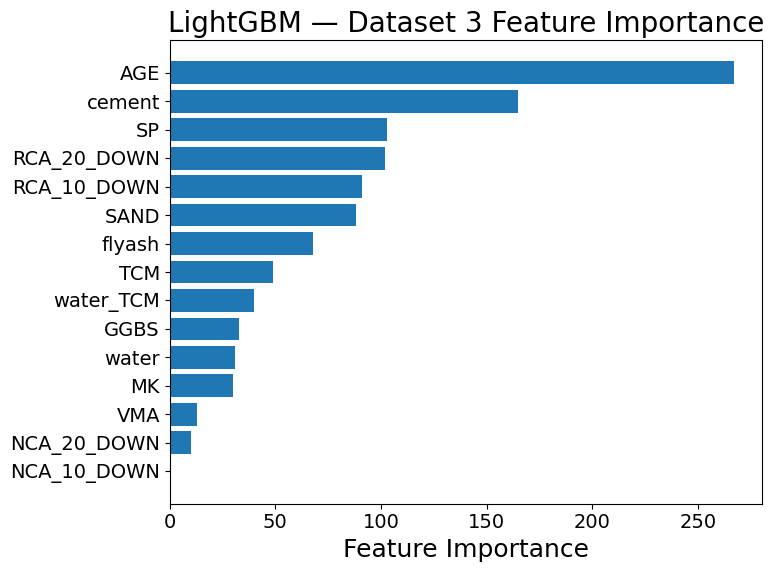

In [ ]:
plot_feature_importances_by_dataset(models_dics, feature_names_by_ds)

# ***Inferencia de csMPa***

## Funciones para el sistema

In [ ]:
def launch_dataset_inference(
    ds_name: str,
    model,
    feature_config: list,
    scaler=None,
    title: str = "AI-Based Inference System for Concrete Compressive Strength"
):
    """
    Launches a clean UI to infer concrete compressive strength (MPa) from mix parameters.
    feature_config: list of tuples (col_name, spec) in the desired render order.
      spec keys:
        - label: str (widget label)
        - type: "float" | "int" (default "float")
        - value: default value
        - min, max, step: optional
        - style: ipywidgets style dict (e.g., {'description_width': '200px'})
    """

    # ---- Build input widgets
    widgets_map = {}
    for col, spec in feature_config:
        label = spec.get("label", col)
        typ = spec.get("type", "float")
        style = spec.get("style", {'description_width': '250px'})
        layout = widgets.Layout(width="360px")

        if typ == "int":
            w = widgets.IntText(
                value=spec.get("value", 0),
                description=f"{label}:",
                style=style,
                layout=layout
            )
            if "min" in spec: w.min = spec["min"]
            if "max" in spec: w.max = spec["max"]
            if "step" in spec: w.step = spec["step"]
        else:
            w = widgets.FloatText(
                value=spec.get("value", 0.0),
                description=f"{label}:",
                style=style,
                layout=layout
            )
            if "min" in spec: w.min = spec["min"]
            if "max" in spec: w.max = spec["max"]
            if "step" in spec: w.step = spec["step"]

        widgets_map[col] = w

    # ---- Header (boxed + centered) + legend
    header = widgets.HTML(
        f"""
        <div style="display:flex; justify-content:center; margin:6px 0 10px 0;">
          <div style="
            border:2px solid #0a2e5c;
            background:#0a2e5c0d;
            border-radius:12px;
            padding:12px 16px;
            max-width: 760px;
            width: 100%;
            text-align:center;">
            <h2 style="margin:0; font-weight:800; color:#0a2e5c;">
              {title}
            </h2>
            <div style="font-size:14px; color:#444; margin-top:4px;">
              <strong>Dataset:</strong> {ds_name}
            </div>
          </div>
        </div>
        """
    )

    legend = widgets.HTML(
        '<div style="margin:6px 0 10px 0; font-size:14px; color:#555; text-align:center;">'
        '<em>Enter mix parameters</em>'
        '</div>'
    )

    # ---- Inputs
    inputs_box = widgets.VBox(
        [widgets_map[c] for c, _ in feature_config],
        layout=widgets.Layout(margin="0 0 8px 0", align_items="center")
    )

    # ---- Predict button (navy)
    btn = widgets.Button(
        description='Predict Strength (MPa)',
        icon='calculator',
        button_style='primary'
    )
    btn.layout = widgets.Layout(width='260px', height='40px')
    try:
        btn.style.button_color = '#00357a'
        btn.style.font_weight = '700'
        btn.style.text_color = 'white'
    except Exception:
        pass

    # ---- Output
    out = widgets.Output()

    def _predict(_):
        with out:
            out.clear_output()
            try:
                # Build DF in configured order
                row = {col: float(widgets_map[col].value) for col, _ in feature_config}
                X = pd.DataFrame([row], columns=[c for c, _ in feature_config])

                if scaler is not None:
                    X = pd.DataFrame(scaler.transform(X), columns=X.columns)

                yhat = float(model.predict(X)[0])

                display(HTML(
                    f"""
                    <div style="
                        border:2px solid #0a2e5c;
                        background:#0a2e5c0d;
                        padding:12px 14px;
                        border-radius:10px;
                        margin-top:12px;">
                      <div style="font-size:15px; color:#0a2e5c; font-weight:700; margin-bottom:6px;">
                        Prediction Result
                      </div>
                      <div style="font-size:22px; font-weight:800; color:#111;">
                        {yhat:.2f} MPa
                      </div>
                      <div style="font-size:12px; color:#444; margin-top:4px;">
                        Model inference for <strong>{ds_name}</strong>
                      </div>
                    </div>
                    """
                ))
            except Exception as e:
                display(HTML(
                    f"""
                    <div style="border:2px solid #b00020; background:#ffe6e9; padding:10px; border-radius:8px;">
                      <pre style="margin:0; color:#b00020; font-size:12px;">Error: {e}</pre>
                    </div>
                    """
                ))

    btn.on_click(_predict)

    # ---- Compose UI
    wrapper = widgets.VBox(
        [header, legend, inputs_box, btn, out],
        layout=widgets.Layout(width='100%', max_width='400px', align_items='center')
    )
    display(wrapper)


## Caracteristicas de las bases de datos para cada sistema

In [ ]:
wide_style = {'description_width': '250px'}

# === Dataset 1 ===
feature_config_ds1 = [
    ("cement",           {"label": "Cement (kg/m³)",            "type": "float", "value": 540.0, "min": 0, "style": wide_style}),
    ("slag",             {"label": "Blast Furnace Slag (kg/m³)","type": "float", "value": 0.0,   "min": 0, "style": wide_style}),
    ("flyash",           {"label": "Fly Ash (kg/m³)",           "type": "float", "value": 0.0,   "min": 0, "style": wide_style}),
    ("water",            {"label": "Water (kg/m³)",             "type": "float", "value": 162.0, "min": 0, "style": wide_style}),
    ("superplasticizer", {"label": "Superplasticizer (kg/m³)",  "type": "float", "value": 2.5,   "min": 0, "step": 0.1, "style": wide_style}),
    ("coarseaggregate",  {"label": "Coarse Aggregate (kg/m³)",  "type": "float", "value": 1040.0,"min": 0, "style": wide_style}),
    ("fineaggregate",    {"label": "Fine Aggregate (kg/m³)",    "type": "float", "value": 676.0, "min": 0, "style": wide_style}),
    ("age",              {"label": "Age (days)",                "type": "int",   "value": 28,    "min": 1, "style": wide_style}),
]

# === Dataset 2 ===
feature_config_ds2 = [
    ("Cement",                   {"label": "Cement (kg/m³)",                   "type": "float", "value": 358.0, "min": 230.0, "max": 724.0,  "step": 1.0,  "style": wide_style}),
    ("Fine_Aggregates",          {"label": "Fine aggregates (kg/m³)",          "type": "float", "value": 896.0, "min": 823.0, "max": 1600.0, "step": 1.0,  "style": wide_style}),
    ("Coarse_Aggregates",        {"label": "Coarse aggregates (kg/m³)",        "type": "float", "value": 1047.0,"min": 0.0,   "max": 1051.0, "step": 1.0,  "style": wide_style}),
    ("Water",                    {"label": "Water (kg/m³)",                    "type": "float", "value": 172.0, "min": 170.0, "max": 320.0,  "step": 0.5,  "style": wide_style}),
    ("Water_reducing_Admixture", {"label": "Water-reducing admixture (kg/m³)", "type": "float", "value": 5.4,   "min": 0.0,   "max": 10.0,   "step": 0.1,  "style": wide_style}),
    ("Fly_Ash",                  {"label": "Fly ash (kg/m³)",                  "type": "float", "value": 0.0,   "min": 0.0,   "max": 60.0,   "step": 1.0,  "style": wide_style}),
    ("Accelerating_Agent",       {"label": "Accelerating agent (kg/m³)",       "type": "float", "value": 0.0,   "min": 0.0,   "max": 5.0,    "step": 0.1,  "style": wide_style}),
    ("Silica_Fume",              {"label": "Silica fume (kg/m³)",              "type": "float", "value": 0.0,   "min": 0.0,   "max": 10.0,   "step": 0.5,  "style": wide_style}),
    ("Time",                     {"label": "Curing time (days)",               "type": "int",   "value": 28,    "min": 1,     "max": 90,     "step": 1,    "style": wide_style}),
]


# === Dataset 3 ===
feature_config_ds3 = [
    ("NCA_10_DOWN", {"label": "Natural coarse aggregate <10 mm (kg/m³)", "type": "float", "value": 455.0, "min": 0.0,   "max": 514.0, "step": 1.0,  "style": wide_style}),
    ("NCA_20_DOWN", {"label": "Natural coarse aggregate <20 mm (kg/m³)", "type": "float", "value": 410.0, "min": 0.0,   "max": 462.0, "step": 1.0,  "style": wide_style}),
    ("VMA",         {"label": "Viscous modifying agent (kg/m³)",        "type": "float", "value": 0.0,   "min": 0.0,   "max": 1.38,  "step": 0.1,  "style": wide_style}),
    ("water",       {"label": "Water (kg/m³)",                          "type": "float", "value": 170.0, "min": 146.0, "max": 172.0, "step": 0.5,  "style": wide_style}),
    ("TCM",         {"label": "Total cementitious material (kg/m³)",    "type": "float", "value": 550.0, "min": 480.0, "max": 680.0, "step": 1.0,  "style": wide_style}),
    ("flyash",      {"label": "Fly ash (kg/m³)",                        "type": "float", "value": 165.0, "min": 0.0,   "max": 385.0, "step": 1.0,  "style": wide_style}),
    ("GGBS",        {"label": "GGBS (kg/m³)",                           "type": "float", "value": 165.0, "min": 0.0,   "max": 385.0, "step": 1.0,  "style": wide_style}),
    ("MK",          {"label": "Metakaolin (kg/m³)",                     "type": "float", "value": 68.0,  "min": 0.0,   "max": 102.0, "step": 1.0,  "style": wide_style}),
    ("water_TCM",   {"label": "Water/TCM ratio (–)",                    "type": "float", "value": 0.30,  "min": 0.25,  "max": 0.35,  "step": 0.01, "style": wide_style}),
    ("RCA_10_DOWN", {"label": "Recycled coarse aggregate <10 mm (kg/m³)","type": "float", "value": 432.0, "min": 247.0, "max": 514.0, "step": 1.0,  "style": wide_style}),
    ("SAND",        {"label": "Fine aggregate (sand, kg/m³)",           "type": "float", "value": 729.0, "min": 555.0, "max": 815.0, "step": 1.0,  "style": wide_style}),
    ("RCA_20_DOWN", {"label": "Recycled coarse aggregate <20 mm (kg/m³)","type": "float", "value": 361.0, "min": 270.0, "max": 462.0, "step": 1.0,  "style": wide_style}),
    ("cement",      {"label": "Cement (kg/m³)",                         "type": "float", "value": 385.0, "min": 165.0, "max": 612.0, "step": 1.0,  "style": wide_style}),
    ("SP",          {"label": "Superplasticizer (kg/m³)",               "type": "float", "value": 3.30,  "min": 1.20,  "max": 6.60,  "step": 0.1,  "style": wide_style}),
    ("AGE",         {"label": "Curing age (days)",                      "type": "int",   "value": 28,    "min": 7,     "max": 90,    "step": 1,    "style": wide_style}),
]



## Sistema - Base de Datos 1

In [ ]:
launch_dataset_inference("Yeh", mejor_cb1, feature_config_ds1, scaler=None)


## Sistema - Base de Datos 2

In [ ]:
launch_dataset_inference("Ke--Qiu", mejor_xgb2, feature_config_ds2, scaler=None)


## Sistema - Base de Datos 3

In [ ]:
launch_dataset_inference("Biswal", mejor_lgbm3, feature_config_ds3, scaler=None)
